# Table des matières

### [Introduction](#I)

### [Importation du jeu de données](#T1)
- [Importation des librairies](#T1C1)
- [Importation du jeu de données](#T1C2)

### [Exploration du jeu de données](#T2)
- [Jeu de données](#T2C1)
- [Fusion + data engineering : LightGBM with Simple Features](#T2C2)
- [Feature selection (données manquantes, dupliquées, sans variance)](#T2C3)
- [Exploration des données](#T2C4)

### [Modélisations](#T3)
- [Pipeline](#T3C1)
- [DummyClassifier](#T3C2)
- [KNeighborsClassifier](#T3C3)
- [RandomForestClassifier](#T3C4)
- [Naives Bayes Classifier](#T3C5)
- [LogisticRegression](#T3C6)
- [SGDClassifier](#T3C7)
- [GradientBoostingClassifier](#T3C8)
- [XGBClassifier](#T3C9)
- [LightGBM](#T3C10)
- [Neural Network (Keras)](#T3C11)

### [Sélection du meilleur modèle](#T4)
- [Résultats des modélisations](#T4C1)
- [Résultats des modélisations : Temps](#T4C2)
- [Résultats des modélisations : ROC-AUC](#T4C3)
- [Résultats des modélisations : Recall](#T4C4)

### [Conclusions générales](#C)

***
# <a name="I">Introduction</a>

Nous travaillons pour l'entreprise "Prêt à dépenser", qui propose des crédits à la consommation pour des personnes ayant peu ou pas du tout d'historique de prêt. 

L’entreprise souhaite mettre en œuvre un outil de “scoring crédit” pour calculer la probabilité qu’un client rembourse son crédit, puis classifie la demande en crédit accordé ou refusé. Elle souhaite donc développer un algorithme de classification en s’appuyant sur des sources de données variées (données comportementales, données provenant d'autres institutions financières, etc.).

De plus, les chargés de relation client ont fait remonter le fait que les clients sont de plus en plus demandeurs de transparence vis-à-vis des décisions d’octroi de crédit.

Prêt à dépenser décide donc qu'il faut qu'on développe un dashboard interactif pour que les chargés de relation client puissent à la fois expliquer de façon la plus transparente possible les décisions d’octroi de crédit, mais également permettre à leurs clients de disposer de leurs informations personnelles et de les explorer facilement. 

***
# <a name="T1">Importation du jeu de données</a>

### <a name = "T1C1">a. Importation des librairies</a>

In [ ]:
"""import subprocess

# Librairies à update
libraries_to_update = [
    "pandas",
    "numpy",
    "matplotlib",
    "seaborn",
    "scipy",
    "scikit-learn",
    "xgboost",
    "lightgbm",
    "imbalanced-learn",
    "shap",
    "mlflow",
    "tensorflow",
]

# On update quand c'est nécessaire
for library in libraries_to_update:
    subprocess.check_call(["pip", "install", "--upgrade", library])"""

In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import sklearn
import lightgbm
import xgboost
import imblearn
import shap
import random
import mlflow
import copy
import tensorflow as tf
import pickle
from datetime import datetime

from collections import Counter
from IPython.display import clear_output, IFrame
from scipy import stats

from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score, StratifiedKFold 
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report, confusion_matrix
from sklearn.metrics import make_scorer, precision_score, recall_score, f1_score, fbeta_score

from imblearn.pipeline import Pipeline # sklearn ne prend pas en compte les méthodes de sampling
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.base import BaseEstimator, TransformerMixin

from sklearn.dummy import DummyClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

from imblearn.under_sampling import NearMiss
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTEENN

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.layers import Dense, Dropout, Normalization, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam

from mlflow.sklearn import log_model, save_model, autolog

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

libraries = {
    "Pandas" : pd,
    "Numpy" : np,
    "Scikit-Learn" : sklearn,
    "Xgboost" : xgboost,
    "LightGBM" : lightgbm,
    "Imblearn" : imblearn,
    "SHAP" : shap,
    "mlflow" : mlflow,
    "TensorFlow" : tf,
}

# On affiche les différentes versions des librairies utilisées
for lib_name, lib in libraries.items():
    print(f"{lib_name} Version : {lib.__version__}")

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


Pandas Version : 1.5.3
Numpy Version : 1.23.5
Scikit-Learn Version : 1.2.2
Xgboost Version : 1.7.6
LightGBM Version : 4.0.0
Imblearn Version : 0.11.0
SHAP Version : 0.42.1
mlflow Version : 2.6.0
TensorFlow Version : 2.13.0


### <a name = "T1C2">b. Importation du jeu de données</a>

On réalise l'importation du jeu de données.

In [2]:
google_colab = False

#Pour une utilisation sur google colab
if google_colab:

    from google.colab import drive
    drive.mount('/content/drive')
    path_data = "/content/drive/My Drive/Projet 7/"

else :
    # On récupère le file path du notebook
    path_data = os.getcwd()

In [3]:
# On récupère la liste de fichiers dans le dossier
file_list = os.listdir(path_data + "/fichiers")

# On filtre sur les fichiers csv
csv_files = ["fichiers/" + file for file in file_list if file.endswith('.csv')]

# Si l'opération de merge a déjà été réalisée, on ne la refait pas
if "fichiers/concatenate_files.csv" in (csv_files):
    data = pd.read_csv("fichiers/concatenate_files.csv")

***
# <a name="T2">Exploration du jeu de données</a>

### <a name = "T2C1">a. Jeux de données</a>

In [4]:
with pd.option_context('display.max_columns', None):
    for file in [files for files in csv_files if files != "fichiers/concatenate_files.csv"]:
        
        print("Nom de fichier :", file)
        
        # On lit le fichier avec le décodeur classique UTF-8, sinon on tente latin1
        try:          
            df = pd.read_csv(file, sep = ',', encoding = "UTF-8")        
        
        except UnicodeDecodeError:
            
            print(f"UnicodeDecodeError: Erreur d'encodage, ne peut pas lire {csv_files} avec UTF-8.")
            
            try:
                df = pd.read_csv(file, sep = ',', encoding='latin1')
            
            except:
                print(f"UnicodeDecodeError: Erreur d'encodage, ne peut pas lire {csv_files} avec latin1.")
                print("Trouver un autre encodeur")
        
        # On affiche les données du fichier
        display(df)

Nom de fichier : fichiers/application_test.csv


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.0660,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.1250,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.1250,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.1250,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.699787,0.610991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Marr

Nom de fichier : fichiers/application_train.csv


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.0220,0.0198,0.0,0.0000,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.0000,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.0790,0.0554,0.0,0.0000,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.0100,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

Nom de fichier : fichiers/bureau.csv


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.00,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.00,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.50,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.00,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.00,NaN,NaN,0.0,Consumer credit,-21,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1716423,259355,5057750,Active,currency 1,-44,0,-30.0,NaN,0.0,0,11250.00,11250.0,0.0,0.0,Microloan,-19,NaN
1716424,100044,5057754,Closed,currency 1,-2648,0,-2433.0,-2493.0,5476.5,0,38130.84,0.0,0.0,0.0,Consumer credit,-2493,NaN
1716425,100044,5057762,Closed,currency 1,-1809,0,-1628.0,-970.0,NaN,0,15570.00,NaN,NaN,0.0,Consumer credit,-967,NaN
1716426,246829,5057770,Closed,currency 1,-1878,0,-1513.0,-1513.0,NaN,0,36000.00,0.0,0.0,0.0,Consumer credit,-1508,NaN


Nom de fichier : fichiers/bureau_balance.csv


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C
...,...,...,...
27299920,5041336,-47,X
27299921,5041336,-48,X
27299922,5041336,-49,X
27299923,5041336,-50,X


Nom de fichier : fichiers/credit_card_balance.csv


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.00,1800.000,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.00,2250.000,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.00,2250.000,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.00,11925.000,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.00,27000.000,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840307,1036507,328243,-9,0.000,45000,NaN,0.0,NaN,NaN,0.000,NaN,0.000,0.000,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
3840308,1714892,347207,-9,0.000,45000,0.0,0.0,0.0,0.0,0.000,1879.11,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,23.0,Active,0,0
3840309,1302323,215757,-9,275784.975,585000,270000.0,270000.0,0.0,0.0,2250.000,375750.00,356994.675,269356.140,273093.975,273093.975,2.0,2,0.0,0.0,18.0,Active,0,0
3840310,1624872,430337,-10,0.000,450000,NaN,0.0,NaN,NaN,0.000,NaN,0.000,0.000,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0


Nom de fichier : fichiers/dash_file.csv


,SK_ID_CURR,AMT_INCOME_TOTAL,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,FLAG_MOBIL,CNT_FAM_MEMBERS,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,FLAG_DOCUMENT_2,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Unemployed,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Lower secondary,NAME_HOUSING_TYPE_Rented apartment,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,ORGANIZATION_TYPE_University,FONDKAPREMONT_MODE_reg oper spec account,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_Yes,PAYMENT_RATE,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_MONTHS_BALANCE_SIZE_SUM,BURO_CREDIT_ACTIVE_Bad debt_MEAN,BURO_CREDIT_TYPE_Consumer credit_MEAN,BURO_CREDIT_TYPE_Loan for working capital replenishment_MEAN,BURO_CREDIT_TYPE_Unknown type of loan_MEAN,ACTIVE_DAYS_CREDIT_MIN,ACTIVE_DAYS_CREDIT_MAX,ACTIVE_MONTHS_BALANCE_SIZE_SUM,CLOSED_DAYS_CREDIT_MAX,CLOSED_DAYS_CREDIT_ENDDATE_MEAN,CLOSED_MONTHS_BALANCE_SIZE_SUM,PREV_AMT_ANNUITY_MAX,PREV_APP_CREDIT_PERC_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MAX,PREV_NAME_CONTRACT_TYPE_Cash loans_MEAN,PREV_NAME_CONTRACT_TYPE_Consumer loans_MEAN,PREV_NAME_CASH_LOAN_PURPOSE_XNA_MEAN,PREV_NAME_CONTRACT_STATUS_Canceled_MEAN,PREV_NAME_CONTRACT_STATUS_Unused offer_MEAN,PREV_NAME_PAYMENT_TYPE_Non-cash from your account_MEAN,PREV_CODE_REJECT_REASON_CLIENT_MEAN,PREV_CODE_REJECT_REASON_HC_MEAN,PREV_CODE_REJECT_REASON_SCO_MEAN,PREV_CODE_REJECT_REASON_VERIF_MEAN,PREV_NAME_TYPE_SUITE_Unaccompanied_MEAN,PREV_NAME_GOODS_CATEGORY_Weapon_MEAN,PREV_NAME_GOODS_CATEGORY_XNA_MEAN,PREV_NAME_PORTFOLIO_Cash_MEAN,PREV_NAME_PORTFOLIO_POS_MEAN,PREV_NAME_PRODUCT_TYPE_XNA_MEAN,PREV_NAME_PRODUCT_TYPE_x-sell_MEAN,PREV_NAME_SELLER_INDUSTRY_Clothing_MEAN,PREV_NAME_SELLER_INDUSTRY_XNA_MEAN,PREV_NAME_YIELD_GROUP_XNA_MEAN,PREV_NAME_YIELD_GROUP_low_action_MEAN,PREV_NAME_YIELD_GROUP_middle_MEAN,PREV_PRODUCT_COMBINATION_Cash Street: middle_MEAN,PREV_PRODUCT_COMBINATION_Cash X-Sell: high_MEAN,PREV_PRODUCT_COMBINATION_POS household without interest_MEAN,APPROVED_AMT_ANNUITY_MIN,APPROVED_AMT_ANNUITY_MAX,APPROVED_AMT_APPLICATION_MAX,APPROVED_APP_CREDIT_PERC_MIN,APPROVED_AMT_GOODS_PRICE_MAX,APPROVED_HOUR_APPR_PROCESS_START_MIN,APPROVED_HOUR_APPR_PROCESS_START_MAX,APPROVED_RATE_DOWN_PAYMENT_MIN,APPROVED_RATE_DOWN_PAYMENT_MEAN,APPROVED_DAYS_DECISION_MAX,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_NAME_CONTRACT_STATUS_XNA_MEAN,INSTAL_PAYMENT_DIFF_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_COUNT,ANNEES_AGE,prediction,prediction_pret,proba_pred_pret,proba_pred_non_pret
0,100002,202500.0,24700.5,351000.0,0.018801,-3648.0,1,1.0,0,0,0,0,0.262949,2.0,2.0,0,1.0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0.060749,-1437.0,-103.0,-874.000000,780.0,-349.000000,110.0,0.0,0.500000,0.0,0.0,-1042.0,-103.0,20.0,-476.0,-574.800000,90.0,9251.775,1.000000,179055.000000,9.0,9.0,0.000000,0.000000,0.000000,-606.0,0.000000,1.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,1.000000,1.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.00,0.000000,0.0,9251.775,9251.775,179055.0,1.000000,179055.0,9.0,9.0,0.000000,0.000000,-606.0,-1.0,-10.000000,0.0,0.000,-49.0,-315.421053,19.0,25.902806,1,Non pret,0.276633,0.723367
1,100003,270000.0,35698.5,1129500.0,0.003541,-1186.0,1,2.0,0,0,0,0,0.622246,1.0,1.0,0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0.027598,-2586.0,-606.0,-1400.750000,1216.0,-544.500000,0.0,0.0,0.500000,0.0,0.0,-606.0,-606.0,0.0,-775.0,-1131.333333,0.0,98356.995,1.011109,435436.500000,12.0,17.0,0.000000,0.100061,0.050030,-746.0,

Nom de fichier : fichiers/HomeCredit_columns_description.csv
UnicodeDecodeError: Erreur d'encodage, ne peut pas lire ['fichiers/application_test.csv', 'fichiers/application_train.csv', 'fichiers/bureau.csv', 'fichiers/bureau_balance.csv', 'fichiers/credit_card_balance.csv', 'fichiers/dash_file.csv', 'fichiers/HomeCredit_columns_description.csv', 'fichiers/installments_payments.csv', 'fichiers/POS_CASH_balance.csv', 'fichiers/previous_application.csv', 'fichiers/sample_submission.csv'] avec UTF-8.


,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
...,...,...,...,...,...
214,217,installments_payments.csv,NUM_INSTALMENT_NUMBER,On which installment we observe payment,NaN
215,218,installments_payments.csv,DAYS_INSTALMENT,When the installment of previous credit was su...,time only relative to the application
216,219,installments_payments.csv,DAYS_ENTRY_PAYMENT,When was the installments of previous credit p...,time only relative to the application
217,220,installments_payments.csv,AMT_INSTALMENT,What was the prescribed installment amount of ...,NaN


Nom de fichier : fichiers/installments_payments.csv


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585
...,...,...,...,...,...,...,...,...
13605396,2186857,428057,0.0,66,-1624.0,NaN,67.500,NaN
13605397,1310347,414406,0.0,47,-1539.0,NaN,67.500,NaN
13605398,1308766,402199,0.0,43,-7.0,NaN,43737.435,NaN
13605399,1062206,409297,0.0,43,-1986.0,NaN,67.500,NaN


Nom de fichier : fichiers/POS_CASH_balance.csv


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0
...,...,...,...,...,...,...,...,...
10001353,2448283,226558,-20,6.0,0.0,Active,843,0
10001354,1717234,141565,-19,12.0,0.0,Active,602,0
10001355,1283126,315695,-21,10.0,0.0,Active,609,0
10001356,1082516,450255,-22,12.0,0.0,Active,614,0


Nom de fichier : fichiers/previous_application.csv


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.000000,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.290,267295.5,311400.0,0.0,267295.5,WEDNESDAY,12,Y,1,0.000000,NaN,NaN,XAP,Approved,-544,Cash through the bank,XAP,NaN,Refreshed,Furniture,POS,XNA,Stone,43,Furniture,30.0,low_normal,POS industry with interest,365243.0,-508.0,362.0,-358.0,-351.0,0.0
1670210,2357031,334635,Consumer loans,6622.020,87750.0,64291.5,29250.0,87750.0,TUESDAY,15,Y,1,0.340554,NaN,NaN,XAP,Approved,-1694,Cash through the bank,XAP,Unaccompanied,New,Furniture,POS,XNA,Stone,43,Furniture,12.0,middle,POS industry with interest,365243.0,-1604.0,-1274.0,-1304.0,-1297.0,0.0
1670211,2659632,249544,Consumer loans,11520.855,105237.0,102523.5,10525.5,105237.0,MONDAY,12,Y,1,0.101401,NaN,NaN,XAP,Approved,-1488,Cash through the bank,XAP,"Spouse, partner",Repeater,Consumer Electronics,POS,XNA,Country-wide,1370,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-1457.0,-1187.0,-1187.0,-1181.0,0.0
1670212,2785582,400317,Cash loans,18821.520,180000.0,191880.0,NaN,180000.0,WEDNESDAY,9,Y,1,NaN,NaN,NaN,XNA,Approved,-1185,Cash through the bank,XAP,Family,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-1155.0,-825.0,-825.0,-817.0,1.0


Nom de fichier : fichiers/sample_submission.csv


,SK_ID_CURR,TARGET
0,100001,0.5
1,100005,0.5
2,100013,0.5
3,100028,0.5
4,100038,0.5
...,...,...
48739,456221,0.5
48740,456222,0.5
48741,456223,0.5
48742,456224,0.5


## Une explication des fichiers :
   
### application_{train|test}.csv

This is the main table, broken into two files for Train (with TARGET) and Test (without TARGET).
Static data for all applications. One row represents one loan in our data sample.

### bureau.csv

All client's previous credits provided by other financial institutions that were reported to Credit Bureau (for clients who have a loan in our sample).
For every loan in our sample, there are as many rows as number of credits the client had in Credit Bureau before the application date.

### bureau_balance.csv

Monthly balances of previous credits in Credit Bureau.
This table has one row for each month of history of every previous credit reported to Credit Bureau – i.e the table has (#loans in sample * # of relative previous credits * # of months where we have some history observable for the previous credits) rows.

### POS_CASH_balance.csv

Monthly balance snapshots of previous POS (point of sales) and cash loans that the applicant had with Home Credit.
This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credits * # of months in which we have some history observable for the previous credits) rows.

### credit_card_balance.csv

Monthly balance snapshots of previous credit cards that the applicant has with Home Credit.
This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credit cards * # of months where we have some history observable for the previous credit card) rows.

### previous_application.csv

All previous applications for Home Credit loans of clients who have loans in our sample.
There is one row for each previous application related to loans in our data sample.

### installments_payments.csv

Repayment history for the previously disbursed credits in Home Credit related to the loans in our sample.
There is a) one row for every payment that was made plus b) one row each for missed payment.
One row is equivalent to one payment of one installment OR one installment corresponding to one payment of one previous Home Credit credit related to loans in our sample.

### HomeCredit_columns_description.csv

This file contains descriptions for the columns in the various data files.

    application_test.csv et sample_submission.csv ne nous serviront pas, car ils sont là pour le kernel

    HomeCredit_columns_description.csv juste des description, donc ne servira pas.

### <a name = "T2C2">b. Fusion + data engineering : LightGBM with Simple Features</a>

Notre mission étant de développer un modèle efficace, on laisse la part de feature engineering à des personnes plus expérimentées dans le domaine. Pour cela, nous utilisons le kernel https://www.kaggle.com/code/jsaguiar/lightgbm-with-simple-features/script comme source.

In [5]:
# Reprise des explications du kaggle.
# La plupart des features sont créées en appliquant les fonctions min, max, moyenne, somme et var.
# - La division de certaines features permet d'obtenir des taux (comme la rente et le revenu)
# - Dans Bureau Data : créer des features spécifiques pour les crédits actifs et les crédits clôturés
# - Dans Previous Applications : on a des features spécifiques pour les candidatures approuvées et refusées
# - On réalise un One Hot encodage pour les featurees catégoriques
# Tous les fichiers sont joints au fichier application avec SK_ID_CURR (sauf bureau_balance).


# Pour limiter le nombre d'entrées, lors de test
DEBUG = None # 10000

# Permet de réaliser le One Hot encodage
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess les fichiers application_train.csv / application_test.csv 
def application_train_test(file, nan_as_category = False):
    df = pd.read_csv(file, nrows = DEBUG)
    print("Samples: {}".format(len(df)))
    
    # On élimine les entrées CODE_GENDER == XNA (genre non spécifié) et qui ne concernent que peu de clients
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # On encode par 0 ou 1 quand il n'y a que 2 catégories
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Sinon on fait du one hot encoding
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # On remplace les erreurs entrées par des np.NaN 
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    
    # Quelques features créées par feature engineering
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    
    # On met en positif, puis on divise par 365 pour avoir le nombre d'années
    df["ANNEES_AGE"] = round((abs(df.DAYS_BIRTH) / 365.25), 1)
    df["ANNEES_EMPLOYED"] = round((abs(df.DAYS_EMPLOYED) / 365.25), 1)
    df["ANNEES_LAST_PHONE_CHANGE"] = round((abs(df.DAYS_LAST_PHONE_CHANGE) / 365.25), 2)    
    
    # On élimine les anciennes variables
    df.drop(["DAYS_BIRTH", "DAYS_EMPLOYED", "DAYS_LAST_PHONE_CHANGE"], axis = 1, inplace = True)
    
    return df

# Preprocess les fichiers bureau.csv et bureau_balance.csv
def bureau_and_balance(file_bureau = "fichiers/bureau.csv", file_bb = "fichiers/bureau_balance.csv", nan_as_category = True):
    bureau = pd.read_csv(file_bureau, nrows = DEBUG)
    bb = pd.read_csv(file_bb, nrows = DEBUG)
    
    # On réalise un One Hot encodage
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance : On réalise une aggrégation puis on fusionne avec bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    
    # Elimination des dataframes pour libérer de la mémoire
    del bb, bb_agg
    
    
    # On réalise différentes aggrégations sur les features numériques
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    
    # Elimination des dataframes pour libérer de la mémoire
    del active, active_agg
    
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')

    # Elimination des dataframes pour libérer de la mémoire
    del closed, closed_agg, bureau
    
    return bureau_agg

# Preprocess du fichier previous_applications.csv
def previous_applications(file = "fichiers/previous_application.csv", nan_as_category = True):
    prev = pd.read_csv(file, nrows = DEBUG)
    # One hot encodage
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    
    # On remplace les erreurs entrées par des np.NaN 
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    
    # Feature engineering : valeur demandée / valeur reçue 
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Correction
    prev['APP_CREDIT_PERC'] = prev['APP_CREDIT_PERC'].apply(lambda x: 0 if (x == np.nan) or (x == np.inf) else x)
    # Features numériques
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Features catégoriques
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    
    # On aggrége sur les anciennes applications qui ont été acceptées 
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    
    # On aggrége sur les anciennes applications qui ont été refusées 
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    
    # Elimination des dataframes pour libérer de la mémoire
    del refused, refused_agg, approved, approved_agg, prev
    
    return prev_agg

# Preprocess fichier POS_CASH_balance.csv
def pos_cash(file = "fichiers/POS_CASH_balance.csv", nan_as_category = True):
    pos = pd.read_csv(file, nrows = DEBUG)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    
    # On compte le nombre de POS compte
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    
    # Elimination du dataframe pour libérer de la mémoire
    del pos
    
    return pos_agg
    
# Preprocess installments_payments.csv
def installments_payments(file = "fichiers/installments_payments.csv", nan_as_category = True):
    ins = pd.read_csv(file, nrows = DEBUG)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    
    # Quelques features créées par feature engineering
    # Pourcentage et différence payées sur les différents prêts (Pourcentage payé et ce qu'il reste à payer)
    ins['AMT_PAYMENT'] = ins['AMT_PAYMENT'].apply(lambda x: x if x >= 0 else 0)
    ins['PAYMENT_EFFECTUE_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_EFFECTUE_PERC'] = ins['PAYMENT_EFFECTUE_PERC'].apply(lambda x: 0 if (x == np.nan) or (x == np.inf) else x)
    ins['PAYMENT_RESTANT'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # On différencie les : jours en retard de paiement (DPD) et jours avant paiement (DBD)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_EFFECTUE_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_RESTANT': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    
    # Elimination du dataframe pour libérer de la mémoire
    del ins
    
    return ins_agg

# Preprocess le fichier credit_card_balance.csv
def credit_card_balance(file = "fichiers/credit_card_balance.csv", nan_as_category = True):
    cc = pd.read_csv(file, nrows = DEBUG)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    # Elimination du dataframe pour libérer de la mémoire
    del cc
    
    return cc_agg  

#https://www.kaggle.com/code/mohammad2012191/reduce-memory-usage-2gb-780mb
def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print("L'utilisation de la mémoire est de {:.2f} MB".format(start_mem))
    
    for i, col in enumerate(df.columns, start=1):
        col_type = df[col].dtype

        # Calculate the percentage of completion
        completion_percentage = (i / df.shape[1]) * 100

        # Use \r to move the cursor to the beginning of the line and overwrite the previous output
        print(f"({i}/{df.shape[1]}) - {completion_percentage:.2f}% complete", end='\r')

        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print("L'utilisation de la mémoire est de {:.2f} MB après optimisation".format(end_mem))
    print("Réduction de {:.1f} %".format(100 * (start_mem - end_mem) / start_mem))
    
    return df

In [6]:
# Fonction permettant de créer le fichier .csv

def creation_fichier_csv(df, nom_du_fichier):

    ## On identifie si le format CSV a été entré, sinon on l'ajout
    if ".csv" not in nom_du_fichier:
        nom_du_fichier = nom_du_fichier + ".csv"

    ## Le fichier est écrit au même endroit que le notebook
    ## Séparateur : virgule
    df.to_csv(nom_du_fichier, index = False, sep = ",")

In [7]:
def preparation_files(bool_drift = False):
    ##
    #    Fonction appelant les autres fonctions de préparation d'un fichier mergé
    #    On appel la même fonction pour créer le fichier permettant le test de data drift
    ##
    
    if bool_drift == False:
        df = application_train_test(file="fichiers/application_train.csv")
    elif bool_drift == True:
        print("Préparation des fichiers pour une analyse du data_drift")
        df = application_train_test(file="fichiers/application_test.csv")
        
    print("Préparation des fichiers : bureau and bureau_balance")
    bureau = bureau_and_balance()
    print("Taille du fichier Bureau :", bureau.shape)
    df = df.join(bureau, how='left', on='SK_ID_CURR')
    del bureau

    print("Préparation du fichier : previous_applications")
    prev = previous_applications()
    print("Taille du fichier Previous applications :", prev.shape)
    df = df.join(prev, how='left', on='SK_ID_CURR')
    del prev

    print("Préparation du fichier : POS-CASH balance")
    pos = pos_cash()
    print("Taille du fichier Pos-cash balance :", pos.shape)
    df = df.join(pos, how='left', on='SK_ID_CURR')
    del pos

    print("Préparation du fichier : installments payments")
    ins = installments_payments()
    print("Taille du fichier Installments payments :", ins.shape)
    df = df.join(ins, how='left', on='SK_ID_CURR')
    del ins

    print("Préparation du fichier : credit card balance")
    cc = credit_card_balance()
    print("Taille du fichier Credit card balance :", cc.shape)
    df = df.join(cc, how='left', on='SK_ID_CURR')
    del cc

    print("Création du fichier mergé...")
    # On créé le fichier avec les données fusionnées
    if bool_drift == False :
        creation_fichier_csv(df, "fichiers/concatenate_files.csv")
    elif bool_drift == True :
        creation_fichier_csv(df, "fichiers/concatenate_files_data_drift.csv")
    
    print("Fichier généré !")
    return df

In [8]:
# Si l'opération de merge n'a pas déjà été réalisée, on la réalise
if "fichiers/concatenate_files.csv" not in (csv_files):
    print("Préparation du fichier...")
    data = preparation_files()

else:
    print("Fichier est déjà généré")

Préparation du fichier...
Samples: 307511
Préparation des fichiers : bureau and bureau_balance
Taille du fichier Bureau : (305811, 116)
Préparation du fichier : previous_applications
Taille du fichier Previous applications : (338857, 249)
Préparation du fichier : POS-CASH balance
Taille du fichier Pos-cash balance : (337252, 18)
Préparation du fichier : installments payments
Taille du fichier Installments payments : (339587, 26)
Préparation du fichier : credit card balance
Taille du fichier Credit card balance : (103558, 141)
Création du fichier mergé...
Fichier généré !


In [9]:
# On réduit la taille du fichier
data = reduce_mem_usage(data)

L'utilisation de la mémoire est de 1599.16 MB
L'utilisation de la mémoire est de 556.61 MB après optimisation
Réduction de 65.2 %


In [10]:
with pd.option_context('display.max_columns', None):
    display(data.shape)
    display(data)
    display(data.describe())

(307507, 797)

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cl

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cl

La variable d'intérêt pour notre projet est "TARGET" : 
- 0 équivalent à un prêt qui a pu être remboursé
- 1 équivalent à un prêt qui n'a pas pu être remboursé

Nous obtenir un modèle permettant de minimiser le nombre de prêts attribués à des clients en incapacité de rembourser

### <a name = "T2C3">c. Feature selection (données manquantes, dupliquées, sans variance)</a>

#### <a name = "T2C31">1. Données manquantes</a>

Etant donné le grand nombre de features générées lors de la fusion des fichiers et du feature engineering, il y a nécessitée de réduire leur nombre.

Dans un premier temps, nous allons éliminer les colonnes où il y a un grand nombre de valeurs manquantes.

Puis nous éliminerons les variables qui n'ont aucune variance.

In [11]:
## Fonction permettant d'afficher le pourcentage de valeurs manquante par colonnes sous la forme d'un barplot

def valeurs_manquantes_graph(df, element, affichage = "Both"):

    #element : "row" ou "column"
    #Si element = row, on analyse le degré de complétude par ligne
    #Si element = column, on analyse le pourcentage de données manquantes par colonnes
    #affichage = "Tab", "Fig" ou "Both", pour l'affichage du tableau ou de la figure seulement, ou les deux


    if element == "column":
        # On créé une liste qui va accueillir le % de données manquantes par feature
        # On parcours les colonnes du dataframe et on calcule le pourcentage de valeurs manquantes
        donnees_manquantes = [[col, df[col].isnull().sum() / df.shape[0] * 100] for col in df.columns]

        #On transforme notre liste contenant les données manquantes en dataframe
        donnees_manquantes = pd.DataFrame(donnees_manquantes, columns = ['Features', 'Pourcentage manquant'])

        #on trie ensuite les données par le pourcentage de données manquantes
        donnees_manquantes.sort_values("Pourcentage manquant", ascending = False, inplace = True)

        if (affichage == "Tab") | (affichage == "Both"):

            display(donnees_manquantes[donnees_manquantes["Pourcentage manquant"] > 0])

        if (affichage == "Fig") | (affichage == "Both"):

            hauteur = df.columns.shape[0] / 4

            plt.figure(figsize=(12,hauteur))

            sns.barplot(data = donnees_manquantes, y = "Features", x = "Pourcentage manquant", color = "red", orient = "h")

            plt.title("Pourcentage de données manquantes par features, \nN = " + str(df.shape[0]) + ", P = " + str(len(df.columns)), fontsize = 20)
            plt.xlabel("Pourcentage de données manquantes (%)", fontsize=18)
            plt.ylabel("Features", fontsize=18)
            plt.xlim(0,100)
            plt.show()

    elif element == "row":
        # On compte pour chaque ligne le nombre de features pour lesquelles une valeur est entrée

        #Comptage du nombre de valeurs non NaN
        valeur_nonNaN = df.count(axis = 1)

        #Comptage du nombre de valeurs NaN
        valeur_NaN = valeur_nonNaN[valeur_nonNaN == 0]

        #Ensuite on calcul la proportion de complétude
        completude_donnees = valeur_nonNaN / len(df.columns) * 100

        print("Il y a %d lignes où nous ne retrouvons aucune valeur entrée" %valeur_NaN.shape[0])

        # On regarde la dispersion des données
        if (affichage == "Tab") | (affichage == "Both"):

            print("Statistiques sur la complétude des données :")
            display(completude_donnees.describe())

        # On affiche les résultats dans une figure
        if (affichage == "Fig") | (affichage == "Both"):

            plt.figure(figsize=(12,8))

            sns.histplot(data = completude_donnees, bins = len(df.columns))

            plt.title("Distribution du nombre de lignes \npar features remplies, N_features = " + str(len(df.columns)), fontsize = 20)
            plt.xlabel("Nombre de features remplies (%)", fontsize=18)
            plt.ylabel("Nombre de lignes, n = " + str(df.shape[0]), fontsize=18)
            plt.show()

    else :
        print("N'a pu rien afficher")
        print("La fonction prend en arguement /element/ qui ne prend comme valeurs /row/ ou /column/")


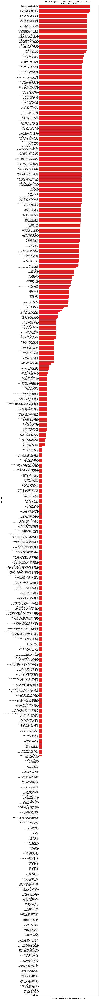

In [12]:
valeurs_manquantes_graph(data, "column", affichage = "Fig")

In [13]:
# On ne garde que les variables où on retrouve moins de 30 % de valeurs manquantes 

nb_col = data.shape[1]

data = data.loc[:, data.apply(lambda x: (x.isnull().sum() / x.shape[0]) < 0.3)]

print("%d colonnes ont été éliminées du dataframe" %(nb_col - data.shape[1]))

253 colonnes ont été éliminées du dataframe


Nous avons drastiquement réduit le nombre de variables du jeu de données en utilisant un threshold de 0.3.

#### <a name = "T2C32">2. Données sans variance</a>

Un second moyen de réduire le nombre de features et par la même occasion améliorer nos modèles et d'éliminer les variables avec peu de variance.

Nous allons éliminer les variables sans variance (qu'une valeur)

In [14]:
# On instancie un objet VarianceThreshold avec un threshold de 0 variance
sel = VarianceThreshold(threshold=0)

#On fit sur nos données
sel.fit(data)

VarianceThreshold(threshold=0)

In [15]:
zero_var = [x for x in data.columns if x not in data.columns[sel.get_support()]]

print("Il y a %d variables qui n'ont pas de variance" %len(zero_var))

Il y a 19 variables qui n'ont pas de variance


In [16]:
# On affiche le résultat
i = 0

while (i < 10) & (i < len(zero_var)) :
    print(data[zero_var[i]].value_counts()) #/ np.float(len(xtrain))
    
    i+=1

0.0    263487
Name: BURO_CREDIT_ACTIVE_nan_MEAN, dtype: int64
0.0    263487
Name: BURO_CREDIT_CURRENCY_nan_MEAN, dtype: int64
0.0    263487
Name: BURO_CREDIT_TYPE_nan_MEAN, dtype: int64
0.0    291053
Name: PREV_NAME_CONTRACT_TYPE_nan_MEAN, dtype: int64
0.0    291053
Name: PREV_WEEKDAY_APPR_PROCESS_START_nan_MEAN, dtype: int64
0.0    291053
Name: PREV_FLAG_LAST_APPL_PER_CONTRACT_nan_MEAN, dtype: int64
0.0    291053
Name: PREV_NAME_CASH_LOAN_PURPOSE_nan_MEAN, dtype: int64
0.0    291053
Name: PREV_NAME_CONTRACT_STATUS_nan_MEAN, dtype: int64
0.0    291053
Name: PREV_NAME_PAYMENT_TYPE_nan_MEAN, dtype: int64
0.0    291053
Name: PREV_CODE_REJECT_REASON_nan_MEAN, dtype: int64


On enlève les variables sans variance

In [17]:
# On ne garde que les variables où on retrouve moins de 30 % de valeurs manquantes 

nb_col = data.shape[1]

data = data.loc[:, ~data.columns.isin(zero_var)]

print("%d colonnes ont été éliminées du dataframe" %(nb_col - data.shape[1]))

19 colonnes ont été éliminées du dataframe


#### <a name = "T2C33">3. Données dupliquées</a>

In [18]:
data[data.duplicated(keep="first")]

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT


Il n'y a pas de données dupliquées.

#### <a name = "T2C34">4. Variables colinéaires</a>

Les variables colinéaires sont des variables corrélées entre elles. Elles peuvent diminuer les capacités du modèle à apprendre eet à généraliser. Donc on va éliminer les variables colinéaires, selon un threshold et ne garder qu'une seule variable sur une paire.

In [19]:
# Matrice de corrélation 
corr_matrix = data.drop(["SK_ID_CURR", "TARGET"], axis = 1).corr().abs()
corr_matrix.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
CODE_GENDER,1.000000,0.345848,0.044374,0.047387,0.074730,0.021597,0.076990,0.022512,0.014056,0.077187,...,0.003959,0.038291,0.004641,0.016228,0.000376,0.039977,0.022670,0.004368,0.031127,0.044159
FLAG_OWN_CAR,0.345848,1.000000,0.002820,0.102037,0.083381,0.116226,0.141589,0.120306,0.041313,0.087778,...,0.049980,0.029706,0.014838,0.040158,0.047625,0.029432,0.015849,0.032811,0.007011,0.007475
FLAG_OWN_REALTY,0.044374,0.002820,1.000000,0.002370,0.002934,0.039266,0.005221,0.045535,0.015167,0.025225,...,0.023496,0.030103,0.009649,0.025680,0.026605,0.033829,0.071957,0.073237,0.015413,0.003885
CNT_CHILDREN,0.047387,0.102037,0.002370,1.000000,0.012884,0.002151,0.021381,0.001818,0.025568,0.183387,...,0.022882,0.051821,0.013564,0.018863,0.024316,0.052364,0.009342,0.006069,0.029051,0.036935
AMT_INCOME_TOTAL,0.074730,0.083381,0.002934,0.012884,1.000000,0.156871,0.191658,0.159610,0.074799,0.027808,...,0.080162,0.086860,0.024174,0.070257,0.079128,0.087304,0.007801,0.002086,0.019330,0.026088


In [20]:
# Partie supérieure de la matrice
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
upper.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
CODE_GENDER,NaN,0.345848,0.044374,0.047387,0.074730,0.021597,0.076990,0.022512,0.014056,0.077187,...,0.003959,0.038291,0.004641,0.016228,0.000376,0.039977,0.022670,0.004368,0.031127,0.044159
FLAG_OWN_CAR,NaN,NaN,0.002820,0.102037,0.083381,0.116226,0.141589,0.120306,0.041313,0.087778,...,0.049980,0.029706,0.014838,0.040158,0.047625,0.029432,0.015849,0.032811,0.007011,0.007475
FLAG_OWN_REALTY,NaN,NaN,NaN,0.002370,0.002934,0.039266,0.005221,0.045535,0.015167,0.025225,...,0.023496,0.030103,0.009649,0.025680,0.026605,0.033829,0.071957,0.073237,0.015413,0.003885
CNT_CHILDREN,NaN,NaN,NaN,NaN,0.012884,0.002151,0.021381,0.001818,0.025568,0.183387,...,0.022882,0.051821,0.013564,0.018863,0.024316,0.052364,0.009342,0.006069,0.029051,0.036935
AMT_INCOME_TOTAL,NaN,NaN,NaN,NaN,NaN,0.156871,0.191658,0.159610,0.074799,0.027808,...,0.080162,0.086860,0.024174,0.070257,0.079128,0.087304,0.007801,0.002086,0.019330,0.026088


In [21]:
# Pour garder le nombre de colonnes par threshold à éliminer
drop_colums = []
for threshold in np.arange(0, 1.1, 0.1):
    threshold = round(threshold, 1)
    
    # On sélectionne les colonnes au dessus du threshold
    
    to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
    
    # On ajoute à la liste
    drop_colums.append([threshold, len(to_drop), to_drop])

In [22]:
drop_colums = pd.DataFrame(drop_colums, columns = ["Threshold", "Nombre de colonnes à éliminer", "Colonnes à éliminer"])
drop_colums

,Threshold,Nombre de colonnes à éliminer,Colonnes à éliminer
0,0.0,522,"[FLAG_OWN_CAR, FLAG_OWN_REALTY, CNT_CHILDREN, ..."
1,0.1,365,"[FLAG_OWN_CAR, CNT_CHILDREN, AMT_CREDIT, AMT_A..."
2,0.2,296,"[FLAG_OWN_CAR, AMT_ANNUITY, AMT_GOODS_PRICE, F..."
3,0.3,249,"[FLAG_OWN_CAR, AMT_ANNUITY, AMT_GOODS_PRICE, C..."
4,0.4,222,"[AMT_ANNUITY, AMT_GOODS_PRICE, CNT_FAM_MEMBERS..."
5,0.5,195,"[AMT_ANNUITY, AMT_GOODS_PRICE, CNT_FAM_MEMBERS..."
6,0.6,165,"[AMT_ANNUITY, AMT_GOODS_PRICE, CNT_FAM_MEMBERS..."
7,0.7,147,"[AMT_ANNUITY, AMT_GOODS_PRICE, CNT_FAM_MEMBERS..."
8,0.8,115,"[AMT_GOODS_PRICE, CNT_FAM_MEMBERS, REGION_RATI..."
9,0.9,68,"[AMT_GOODS_PRICE, REGION_RATING_CLIENT_W_CITY,..."


On a un certain nombre de colonnes qui sont très colinéaires. 

On va prendre arbitrairement le threshold à 0.8. 

Mais cela fait partie des axes d'améliorations pour le développement d'un modèle général.

In [23]:
to_drop = drop_colums.loc[drop_colums.Threshold == 0.8, "Colonnes à éliminer"]

In [24]:
# On ne garde que les variables où on retrouve moins de 30 % de valeurs manquantes 

nb_col = data.shape[1]

data = data.drop(to_drop.values[0], axis = 1)

print("%d colonnes ont été éliminées du dataframe" %(nb_col - data.shape[1]))

115 colonnes ont été éliminées du dataframe


### <a name = "T2C4">d. Exploration des données</a>

Dans un premier temps, nous pouvons analyser le pourcentage de complitude des features par client.

Il y a 0 lignes où nous ne retrouvons aucune valeur entrée
Statistiques sur la complétude des données :


count    307507.000000
mean         95.038902
std          10.468532
min          43.414634
25%          97.073171
50%          99.512195
75%         100.000000
max         100.000000
dtype: float64

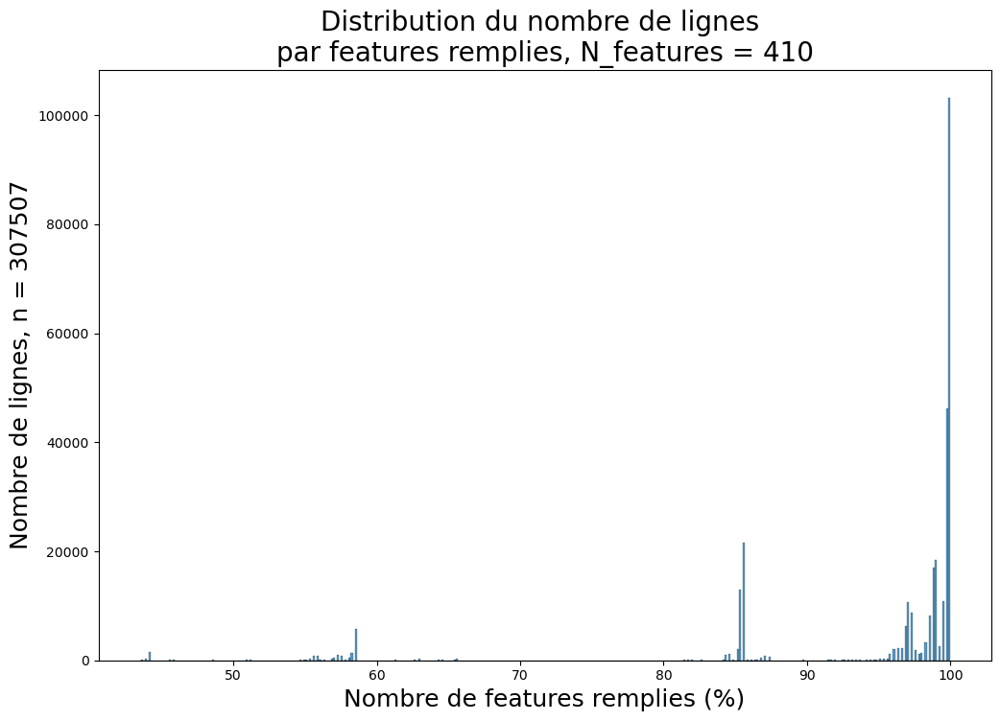

In [25]:
valeurs_manquantes_graph(data, "row", affichage = "Both")

Au moins 50 % des clients ont 99.5 % des features informées. L'impact des imputations des valeurs manquantes sera minimum.

In [26]:
bon_clients = data[data["TARGET"] == 0].shape[0]
mauvais_clients = data[data["TARGET"] == 1].shape[0]
rapport_bon_mauvais = mauvais_clients / (bon_clients + mauvais_clients)

print("Il y a %d bons clients et %d mauvais clients, il y a donc un rapport %.2f entre mauvais / total clients" 
      %(bon_clients, mauvais_clients, rapport_bon_mauvais))

Il y a 282682 bons clients et 24825 mauvais clients, il y a donc un rapport 0.08 entre mauvais / total clients


Nous sommes en présence d'un jeu de données déséquilibré. Il sera important d'y penser lors de la modélisation.

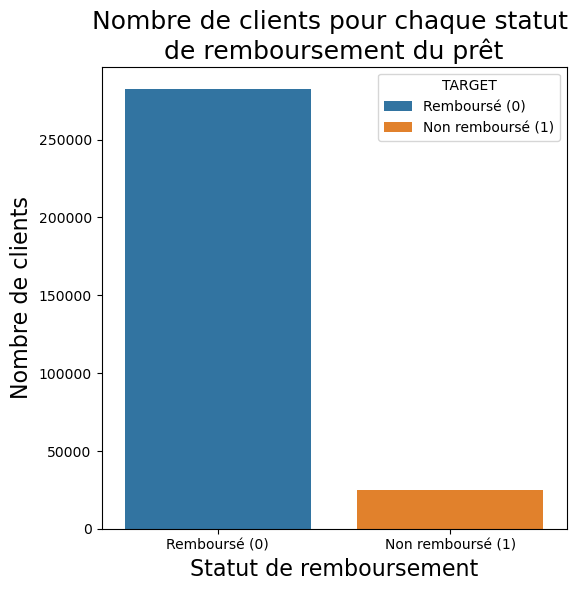

In [27]:
plt.figure(figsize=(6,6))
sns.countplot(data = data, x = "TARGET", hue = "TARGET", dodge=False)
plt.title("Nombre de clients pour chaque statut \nde remboursement du prêt", fontsize = 18)
plt.ylabel("Nombre de clients", fontsize = 16)
plt.xlabel("Statut de remboursement", fontsize = 16)
plt.legend(title="TARGET", labels=["Remboursé (0)", "Non remboursé (1)"])  
plt.xticks(ticks=[0, 1], labels=["Remboursé (0)", "Non remboursé (1)"])  
plt.show()

On peut analyser s'il existe une structuration des données avec TSNE

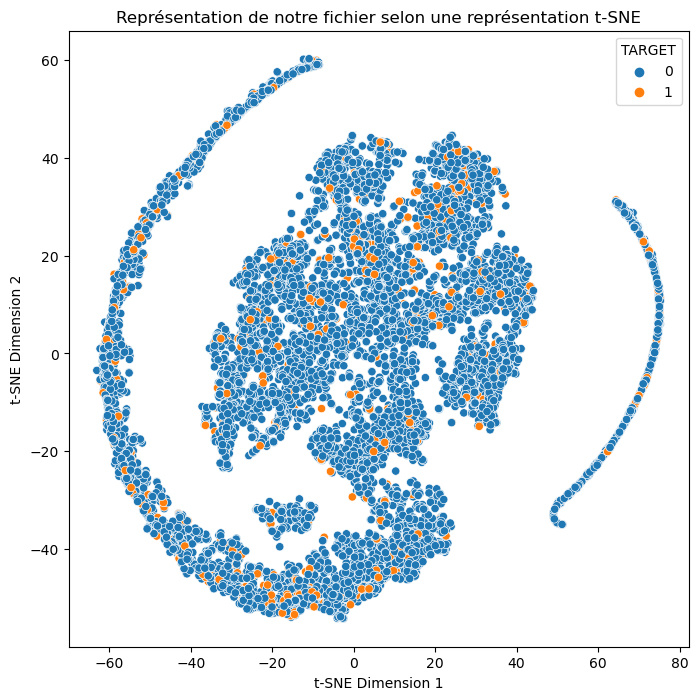

In [28]:
def plot_tsne(X_tsne, labels):
    ##
    #    Fonction permettant d'afficher une représentation TSNE
    ##
    plt.figure(figsize=(8, 8))

    # Réduction minimaliste de la représentation
    sns.scatterplot(x = X_tsne[:, 0], y = X_tsne[:, 1], hue=labels)

    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.title(f'Représentation de notre fichier selon une représentation t-SNE')

    plt.show()

# On ne réalise que sur 10000 données, car ça peut être très long à générer
mask = copy.deepcopy(data[:10000])

imputer = SimpleImputer(strategy='median')
data_imputed = pd.DataFrame(imputer.fit_transform(mask), columns=mask.columns)

tsne = TSNE(n_components=2,
            random_state=42,
            init = "random",
            perplexity = 70,
            learning_rate = 200, # Choix dû à des tests préliminaires
            n_iter = 1000) # Choix dû à des tests préliminaires

# On applique sur nos données
X_tsne = tsne.fit_transform(data_imputed.drop(["TARGET", "SK_ID_CURR"], axis=1))
    
labels = mask["TARGET"]
del mask

plot_tsne(X_tsne, labels)


On observe aucune structuration nette des données.

On peut ensuite analyser la distribution de certaines variables par rapport à la Target.

On ne va en choisir que quelques unes qui peuvent nous intéresser, mais qui ne sont pas forcément les plus intéressantes pour les modèles. Cela nous permet d'avoir une vue d'ensemble des clients.

La variable ANNEES_AGE nous donne accès à l'age du client.

In [29]:
data.ANNEES_AGE.describe()

count    307507.00000
mean              NaN
std           0.00000
min          20.50000
25%          34.00000
50%          43.09375
75%          53.90625
max          69.12500
Name: ANNEES_AGE, dtype: float64

In [30]:
def graphBoxplot(df, x, y, xlabel, figsize = (10,10), **kwargs):
    plt.figure(figsize = figsize)
    
    # On trie pour l'affichage du comptage
    sns.boxplot(data = df.sort_values(x), x = x, y = y, **kwargs)    

    # On compte le nombre de bâtiment par type de x
    # Pour ensuite afficher le compte
    label_count = [str(unique) + ", n = " + str(df[df[x] == unique].shape[0]) 
                   for unique in np.sort(df[x].unique())]
    
    plt.xticks(np.arange(len(df[x].unique())), label_count, rotation=45, ha='right')     
    
    plt.title(str(y) + " par rapport à\n" + str(xlabel) , fontsize = 20)
    plt.xlabel(xlabel.capitalize(), fontsize=18)
    plt.ylabel(y, fontsize=18)
    
    plt.show()

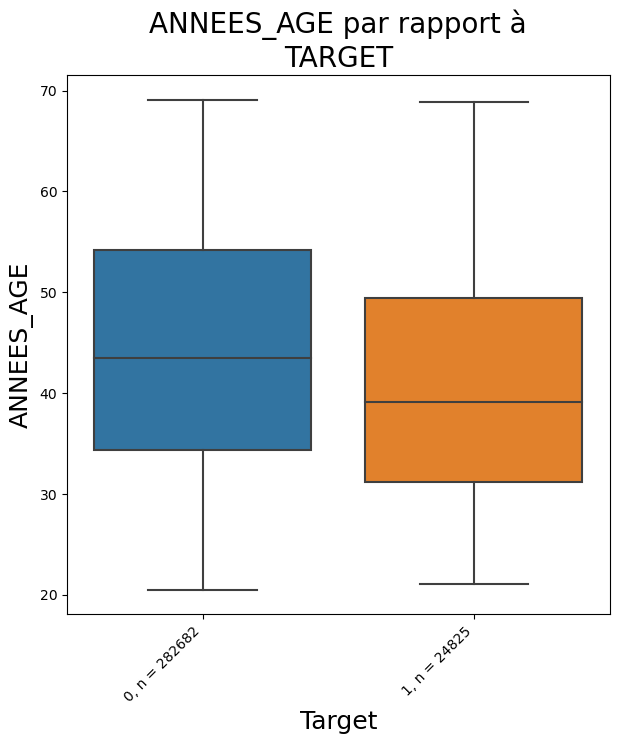

In [31]:
graphBoxplot(data, "TARGET", "ANNEES_AGE", "TARGET", (7,7))

Valeur de skewness : nan


<Axes: xlabel='ANNEES_AGE', ylabel='Count'>

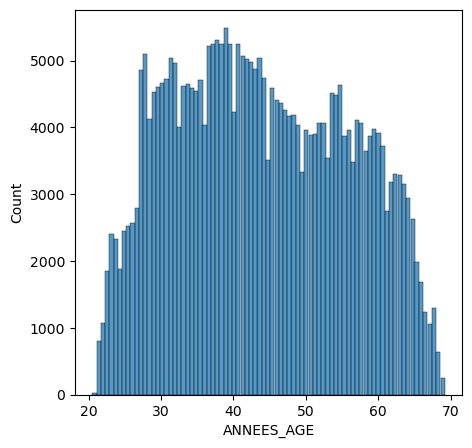

In [32]:
print("Valeur de skewness : %.2f" %data["ANNEES_AGE"].skew())
plt.figure(figsize = (5,5))
sns.histplot(data["ANNEES_AGE"])

On pourrait aller plus loin dans notre test de normalité, mais cela suffira étant donné le nombre de données.

In [33]:
def test_stat(df, var):
    bon_clients = df.loc[df["TARGET"] == 0, var].astype(np.float64)
    mauvais_clients = df.loc[df["TARGET"] == 1, var].astype(np.float64)

    print("Variable testée : ", var)
    # On réalise un t-test
    t_statistic, p_value = stats.ttest_ind(bon_clients, mauvais_clients)

    # On prend un alpa = 0.05
    alpha = 0.05  

    print("p_value : %.5f" %p_value)

    # On test s'il y a une différence significative ou non entre les 2 groupes
    if p_value < alpha:
        print("La moyenne des deux groupes est statistiquement différente.")
    else:
        print("La moyenne des deux groupes n'est pas statistiquement différente.")

In [34]:
test_stat(data, "ANNEES_AGE")

Variable testée :  ANNEES_AGE
p_value : 0.00000
La moyenne des deux groupes est statistiquement différente.


Donc l'age de l'emprunteur semble influencer sur la capacité à rembourser son prêt. Etre en moyenne plus jeune n'est pas un bon signe.

La variable DAYS_EMPLOYED_PERC nous donne accès au pourcentage de jour que le client avait un travail.

In [35]:
# On va mettre en pourcentage
data.DAYS_EMPLOYED_PERC = data.DAYS_EMPLOYED_PERC*100

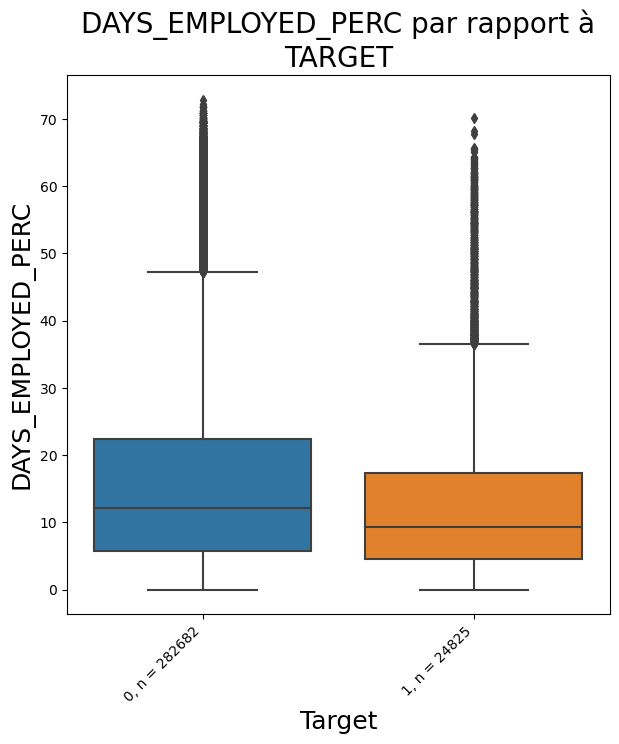

In [36]:
graphBoxplot(data, "TARGET", "DAYS_EMPLOYED_PERC", "TARGET", (7,7))

Valeur de skewness : nan


<Axes: xlabel='DAYS_EMPLOYED_PERC', ylabel='Count'>

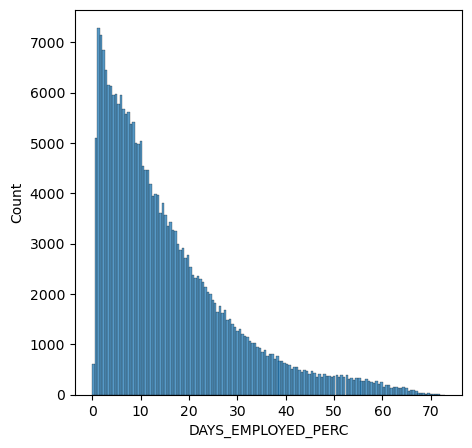

In [37]:
print("Valeur de skewness : %.2f" %data["DAYS_EMPLOYED_PERC"].skew())
plt.figure(figsize = (5,5))
sns.histplot(data["DAYS_EMPLOYED_PERC"])

On regarde si on peut améliorer ce score tout de même.

Valeur de skewness : nan


<Axes: xlabel='DAYS_EMPLOYED_PERC', ylabel='Count'>

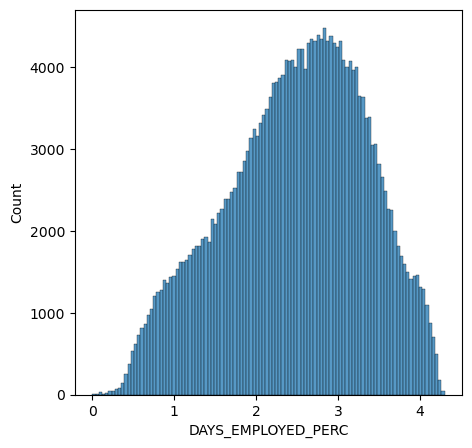

In [38]:
print("Valeur de skewness : %.2f" %np.log1p(data["DAYS_EMPLOYED_PERC"]).skew())
plt.figure(figsize = (5,5))
sns.histplot(np.log1p(data["DAYS_EMPLOYED_PERC"]))

In [39]:
# On ne sélectionne que les données où il n'y a pas de valeurs manquantes
mask = copy.deepcopy(data[data.DAYS_EMPLOYED_PERC.notnull()])

mask.DAYS_EMPLOYED_PERC = np.log1p(mask["DAYS_EMPLOYED_PERC"])

test_stat(mask, "DAYS_EMPLOYED_PERC")

del mask

Variable testée :  DAYS_EMPLOYED_PERC
p_value : 0.00000
La moyenne des deux groupes est statistiquement différente.


Donc le pourcentage passé de sa vie à travailler de l'emprunteur influence sur la capacité à rembourser son prêt. Etre en moyenne plus employé contribue à un meilleur taux de remboursement.

La variable CNT_CHILDREN nous donne accès au nombre d'enfants que le client possède.

In [40]:
data.CNT_CHILDREN.describe()

count    307507.000000
mean          0.417047
std           0.722119
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          19.000000
Name: CNT_CHILDREN, dtype: float64

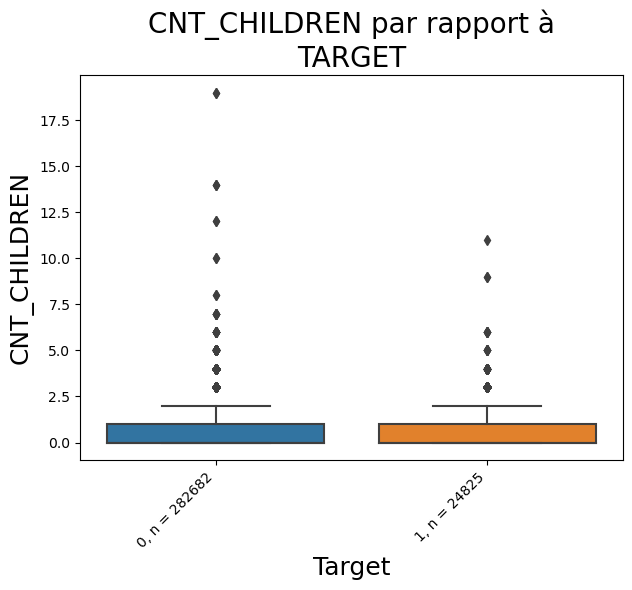

In [41]:
graphBoxplot(data, "TARGET", "CNT_CHILDREN", "TARGET", (7,5))

Graphiquement on observe pas de différence entre les deux groupes.

In [42]:
data.loc[data.TARGET == 0, "CNT_CHILDREN"].describe()

count    282682.000000
mean          0.412941
std           0.718840
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          19.000000
Name: CNT_CHILDREN, dtype: float64

In [43]:
data.loc[data.TARGET == 1, "CNT_CHILDREN"].describe()

count    24825.000000
mean         0.463807
std          0.756903
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max         11.000000
Name: CNT_CHILDREN, dtype: float64

On observe quand même des moyennes différentes

In [44]:
mask = copy.deepcopy(data[data.CNT_CHILDREN.notnull()])

mask.CNT_CHILDREN = np.log1p(mask["CNT_CHILDREN"])

test_stat(mask, "CNT_CHILDREN")

del mask

Variable testée :  CNT_CHILDREN
p_value : 0.00000
La moyenne des deux groupes est statistiquement différente.


Il semblerait donc qu'avoir au moins 1 enfant réduit sa capacité à rembourser son crédit.

La variable FLAG_OWN_CAR nous donne accès si le client possède une voiture ou non.

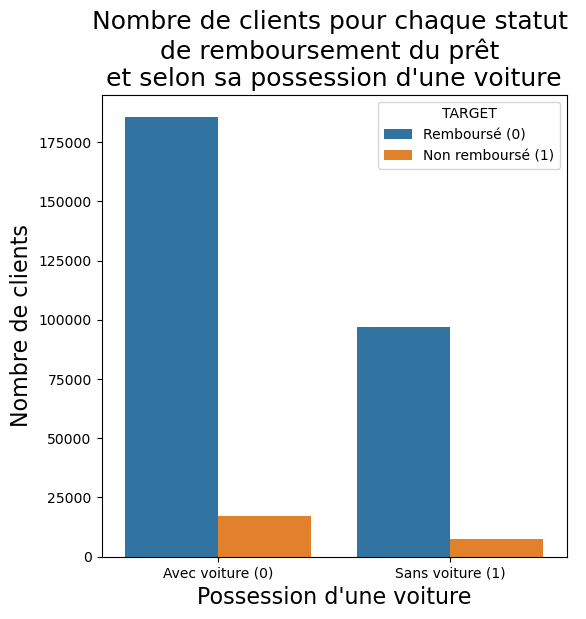

In [45]:
plt.figure(figsize=(6,6))
sns.countplot(data = data, x = "FLAG_OWN_CAR", hue = "TARGET")
plt.title("Nombre de clients pour chaque statut \nde remboursement du prêt \net selon sa possession d'une voiture", fontsize = 18)
plt.ylabel("Nombre de clients", fontsize = 16)
plt.xlabel("Possession d'une voiture", fontsize = 16)
plt.legend(title="TARGET", labels=["Remboursé (0)", "Non remboursé (1)"])  
plt.xticks(ticks=[0, 1], labels=["Avec voiture (0)", "Sans voiture (1)"])  
plt.show()

In [46]:
def chi_test_stat(df, var):
    
    print("Variable testée : ", var)
    
    # on crée une tableau de contingence
    table_contingence = pd.crosstab(data[var], df["TARGET"])
    
    # On réalise le test chi2
    chi2_stat, p_value, dof, expected = stats.chi2_contingency(table_contingence)

    # On prend un alpa = 0.05
    alpha = 0.05  

    print("p_value : %.5f" %p_value)

    # On test s'il y a une différence significative ou non entre les 2 groupes
    if p_value < alpha:
        print("Il y a une association significative entre %s et la variable TARGET." %var)
    else:
        print("Il n'y a pas d'association significative entre %s et la variable TARGET." %var)

In [47]:
chi_test_stat(data, "FLAG_OWN_CAR")

Variable testée :  FLAG_OWN_CAR
p_value : 0.00000
Il y a une association significative entre FLAG_OWN_CAR et la variable TARGET.


Le fait de possèder une voiture ou non contribue à la capacité de rembourser un prêt. 

On peut regarder si le faite de possèder une maison ou non, avec la variable FLAG_OWN_REALTY, permet de prévoir si le client est en capacité de rembourser ou non son crédit.

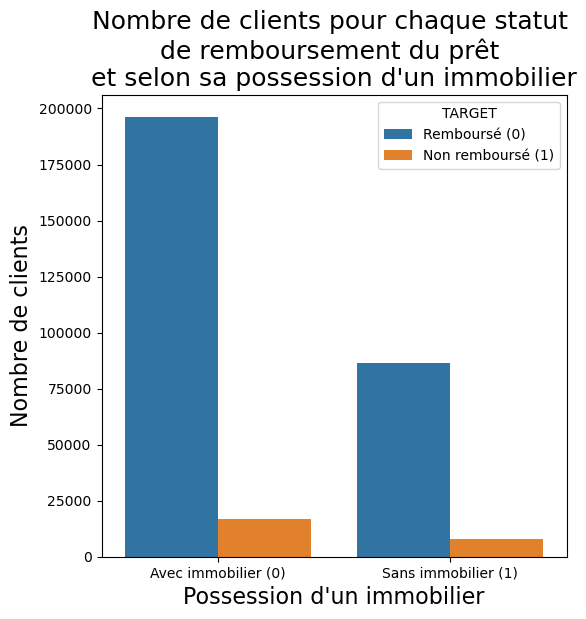

In [48]:
plt.figure(figsize=(6,6))
sns.countplot(data=data, x = "FLAG_OWN_REALTY", hue = "TARGET")
plt.title("Nombre de clients pour chaque statut \nde remboursement du prêt \net selon sa possession d'un immobilier", fontsize = 18)
plt.ylabel("Nombre de clients", fontsize = 16)
plt.xlabel("Possession d'un immobilier", fontsize = 16)
plt.legend(title="TARGET", labels=["Remboursé (0)", "Non remboursé (1)"])  # Add a legend
plt.xticks(ticks=[0, 1], labels=["Avec immobilier (0)", "Sans immobilier (1)"])  # Set x-axis tick labels
plt.show()

In [49]:
chi_test_stat(data, "FLAG_OWN_REALTY")

Variable testée :  FLAG_OWN_REALTY
p_value : 0.00067
Il y a une association significative entre FLAG_OWN_REALTY et la variable TARGET.


Le fait de possèder de l'immobilier ou non contribue à la capacité de rembourser un prêt.

La variable CODE_GENDER nous donne accès au genre du client.

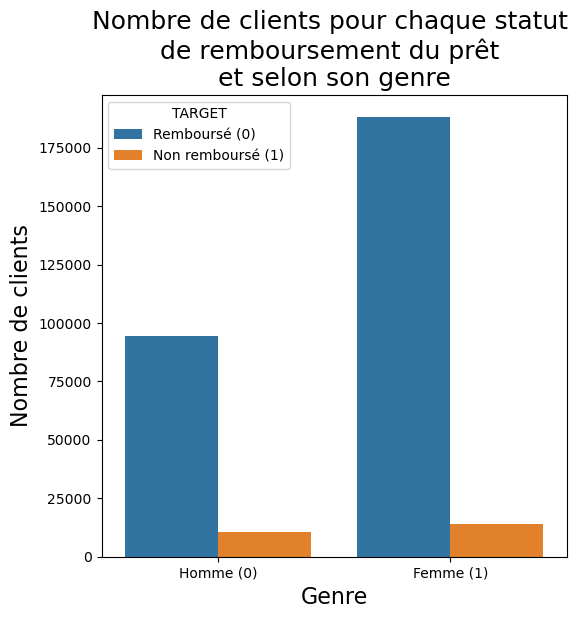

In [50]:
plt.figure(figsize=(6,6))
sns.countplot(data=data, x = "CODE_GENDER", hue = "TARGET")
plt.title("Nombre de clients pour chaque statut \nde remboursement du prêt \net selon son genre", fontsize = 18)
plt.ylabel("Nombre de clients", fontsize = 16)
plt.xlabel("Genre", fontsize = 16)
plt.legend(title="TARGET", labels=["Remboursé (0)", "Non remboursé (1)"])
plt.xticks(ticks=[0, 1], labels=["Homme (0)", "Femme (1)"]) 
plt.show()

In [51]:
chi_test_stat(data, "CODE_GENDER")

Variable testée :  CODE_GENDER
p_value : 0.00000
Il y a une association significative entre CODE_GENDER et la variable TARGET.


Le genre du client est associé significativement à sa capacité à rembourser

In [52]:
total_homme = data[data.CODE_GENDER == 0]
total_femme = data[data.CODE_GENDER == 1]
total = total_homme + total_femme

bon_client_homme_pourc = total_homme[total_homme.TARGET == 0].shape[0] / total_homme.shape[0] * 100
mauvais_client_homme_pourc = 100 - bon_client_homme_pourc

bon_client_femme_pourc = total_femme[total_femme.TARGET == 0].shape[0] / total_femme.shape[0] * 100
mauvais_client_femme_pourc = 100 - bon_client_femme_pourc

print("Pourcentage de clients hommes ayant remboursés un crédit %.0f %% contre les mauvais %.0f %%" 
      %(bon_client_homme_pourc, mauvais_client_homme_pourc))

print("Pourcentage de clientes femmes ayant remboursées un crédit %.0f %% contre les mauvaises %.0f %%" 
      %(bon_client_femme_pourc, mauvais_client_femme_pourc))

Pourcentage de clients hommes ayant remboursés un crédit 90 % contre les mauvais 10 %
Pourcentage de clientes femmes ayant remboursées un crédit 93 % contre les mauvaises 7 %


Les clients hommes sont  plus proportionnels représentés dans les catégories de client à ne pas rembourser leur prêt.

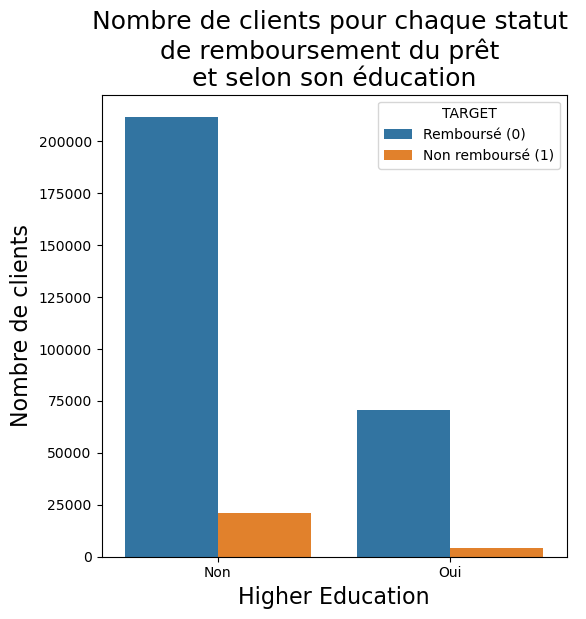

In [53]:
plt.figure(figsize=(6,6))
sns.countplot(data = data, x = "NAME_EDUCATION_TYPE_Higher education", hue = "TARGET")
plt.title("Nombre de clients pour chaque statut \nde remboursement du prêt \net selon son éducation", fontsize = 18)
plt.ylabel("Nombre de clients", fontsize = 16)
plt.xlabel("Higher Education", fontsize = 16)
plt.legend(title="TARGET", labels=["Remboursé (0)", "Non remboursé (1)"])
plt.xticks(ticks=[0, 1], labels=["Non", "Oui"]) 
plt.show()

On retrouve chez les clients qui n'ont pas remboursés peu qui ont une éducation élevée 

In [54]:
chi_test_stat(data, "NAME_EDUCATION_TYPE_Higher education")

Variable testée :  NAME_EDUCATION_TYPE_Higher education
p_value : 0.00000
Il y a une association significative entre NAME_EDUCATION_TYPE_Higher education et la variable TARGET.


On peut regarder quelques unes des distributions financières des clients.
- AMT_INCOME_TOTAL (**Argent gagné par le client**)
- AMT_CREDIT (**Prêt accordé au client)
- INCOME_CREDIT_PERC (**Taux entre argent gagné par le client et le prêt accordé**) 
- AMT_ANNUITY (**Somme remboursée par année**)
- ANNUITY_INCOME_PERC (**Taux de remboursement par année sur l'argent gagné du client**)
- PAYMENT_RATE (**Taux de remboursement du prêt accordé**)

In [55]:
mask = copy.deepcopy(data[["TARGET", 
             "AMT_INCOME_TOTAL", 
             "AMT_CREDIT", 
             "INCOME_CREDIT_PERC", 
             "AMT_ANNUITY", 
             "ANNUITY_INCOME_PERC",
             "PAYMENT_RATE"]])

In [56]:
mask[mask.TARGET == 0].describe()

,TARGET,AMT_INCOME_TOTAL,AMT_CREDIT,INCOME_CREDIT_PERC,AMT_ANNUITY,ANNUITY_INCOME_PERC,PAYMENT_RATE
count,282682.0,2.826820e+05,2.826820e+05,282682.000000,282670.000000,282670.000000,282670.000000
mean,0.0,1.690775e+05,6.026512e+05,NaN,27163.722656,0.000000,0.000000
std,0.0,1.104416e+05,4.068120e+05,0.000000,14657.628906,0.094604,0.022644
min,0.0,2.565000e+04,4.500000e+04,0.020309,1615.500000,0.003334,0.022079
25%,0.0,1.125000e+05,2.700000e+05,0.192627,16456.500000,0.114136,0.036285
50%,0.0,1.485000e+05,5.177880e+05,0.306152,24876.000000,0.162231,0.049988
75%,0.0,2.025000e+05,8.100000e+05,0.500000,34749.000000,0.228394,0.063904
max,0.0,1.800009e+07,4.050000e+06,26.671875,258025.500000,1.570312,0.124451


In [57]:
mask[mask.TARGET == 1].describe()

,TARGET,AMT_INCOME_TOTAL,AMT_CREDIT,INCOME_CREDIT_PERC,AMT_ANNUITY,ANNUITY_INCOME_PERC,PAYMENT_RATE
count,24825.0,2.482500e+04,2.482500e+04,24825.000000,24825.000000,24825.000000,24825.000000
mean,1.0,1.656118e+05,5.577785e+05,0.396484,26481.744141,0.185425,0.054596
std,0.0,7.466609e+05,3.464308e+05,1.354492,12450.640625,0.094482,0.020569
min,1.0,2.565000e+04,4.500000e+04,0.011803,2722.500000,0.000224,0.022079
25%,1.0,1.125000e+05,2.844000e+05,0.200317,17361.000000,0.119995,0.039642
50%,1.0,1.350000e+05,4.975200e+05,0.307373,25263.000000,0.169312,0.049988
75%,1.0,2.025000e+05,7.333155e+05,0.469482,32976.000000,0.233643,0.066833
max,1.0,1.170000e+08,4.027680e+06,208.000000,149211.000000,1.875977,0.124451


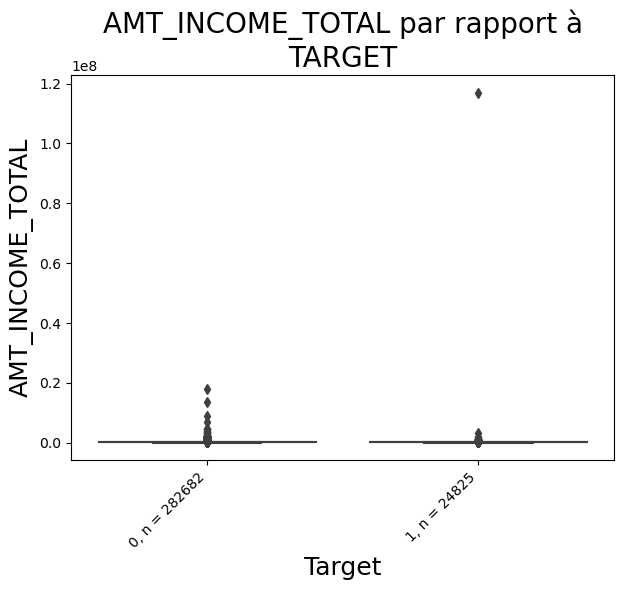

Variable testée :  AMT_INCOME_TOTAL
p_value : 0.00000
La moyenne des deux groupes est statistiquement différente.


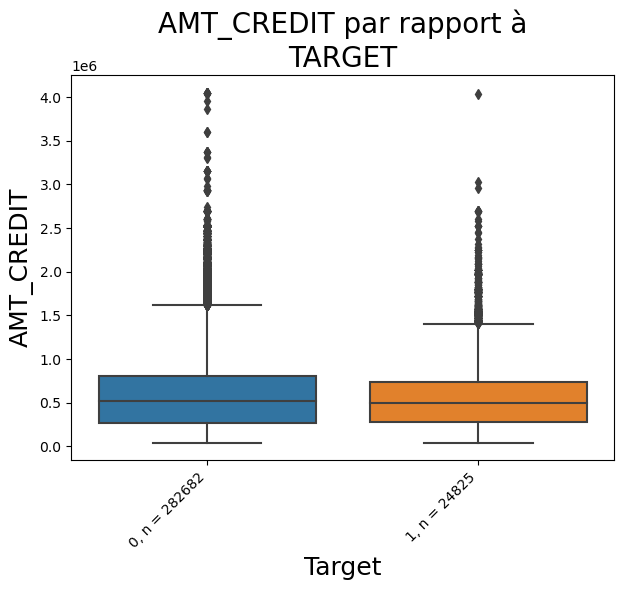

Variable testée :  AMT_CREDIT
p_value : 0.00000
La moyenne des deux groupes est statistiquement différente.


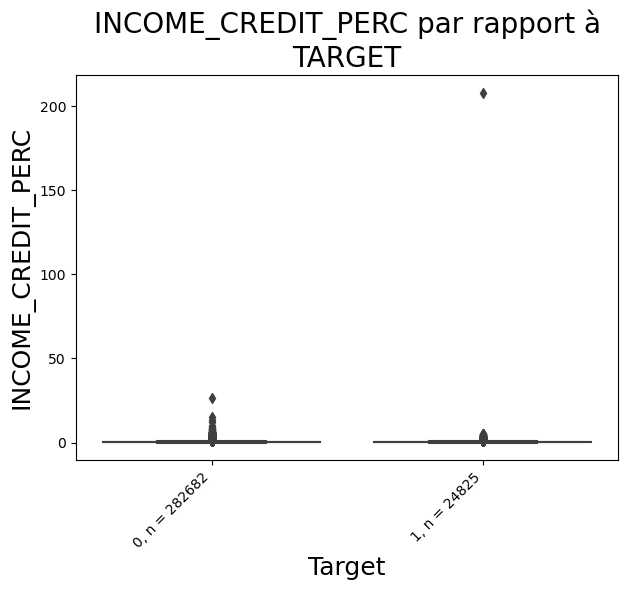

Variable testée :  INCOME_CREDIT_PERC
p_value : 0.00006
La moyenne des deux groupes est statistiquement différente.


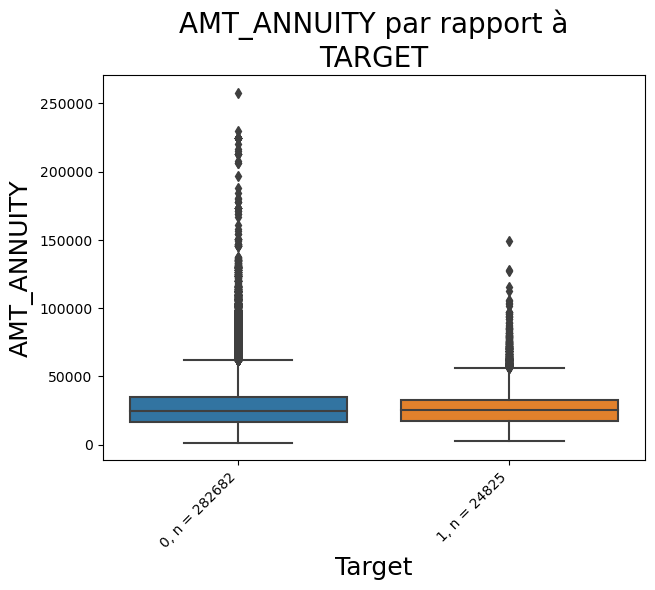

Variable testée :  AMT_ANNUITY
p_value : 0.66651
La moyenne des deux groupes n'est pas statistiquement différente.


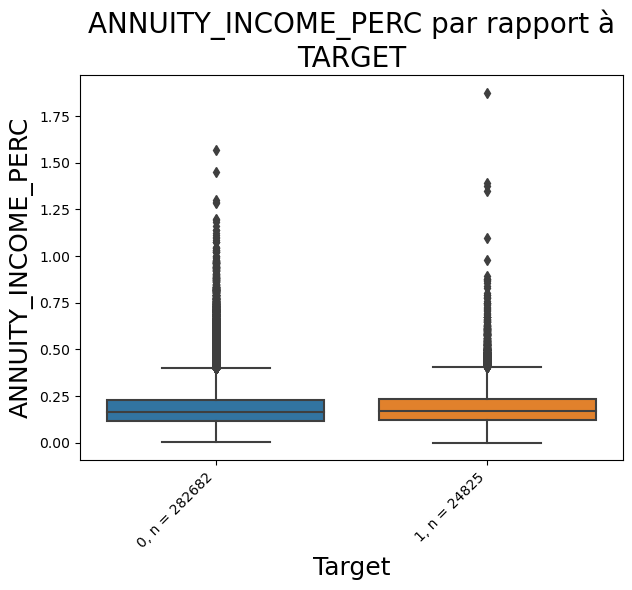

Variable testée :  ANNUITY_INCOME_PERC
p_value : 0.00000
La moyenne des deux groupes est statistiquement différente.


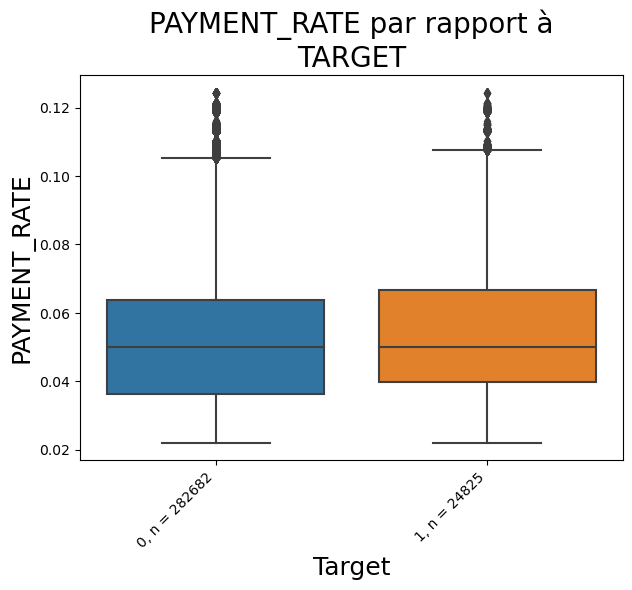

Variable testée :  PAYMENT_RATE
p_value : 0.00000
La moyenne des deux groupes est statistiquement différente.


In [58]:
for col in [c for c in mask.columns if c != "TARGET"]:
    graphBoxplot(mask, "TARGET", col, "TARGET", (7,5))
    
    # Pour réduire la skewness
    mask2 = copy.deepcopy(mask[mask[col].notnull()])
    mask2[col] = np.log1p(mask[col])
    
    test_stat(mask2, col)
del mask, mask2

Il est montré qu'un crédit et un income plus bas sont significativements associés à un défaut de paiement.

De plus, un taux de remboursement plus élevé est également associé à un défaut de paiement. 

On observe une valeur aberrante, on va l'éliminer du dataset car on ne peut pas savoir de combien de 0 l'erreur a été effectuée.

In [59]:
data = data[data.AMT_INCOME_TOTAL < 1e8]

On peut regarder quelques variables corrélées positivement et négativement à target

In [60]:
correlation_scores = data.drop(columns=['TARGET']).corrwith(data['TARGET'])
correlation_scores

SK_ID_CURR                      -0.002094
CODE_GENDER                     -0.054719
FLAG_OWN_CAR                    -0.021842
FLAG_OWN_REALTY                  0.006153
CNT_CHILDREN                     0.019181
                                   ...   
INSTAL_AMT_INSTALMENT_MAX        0.002330
INSTAL_AMT_INSTALMENT_MEAN      -0.018403
INSTAL_AMT_INSTALMENT_SUM       -0.019801
INSTAL_AMT_PAYMENT_MIN          -0.025812
INSTAL_DAYS_ENTRY_PAYMENT_SUM    0.035223
Length: 409, dtype: float64

In [61]:
# On récupère les 5 corrélations positives et négatives
most_pos_corr = correlation_scores.sort_values(ascending = False)[:5]
display("Variables corrélées positivement à TARGET", most_pos_corr)

most_neg_corr = correlation_scores.sort_values()[:5]
display("Variables corrélées négativement à TARGET", most_neg_corr)

del correlation_scores

'Variables corrélées positivement à TARGET'

PREV_NAME_CONTRACT_STATUS_Refused_MEAN    0.077690
BURO_CREDIT_ACTIVE_Active_MEAN            0.077345
BURO_DAYS_CREDIT_MIN                      0.075241
BURO_DAYS_CREDIT_UPDATE_MEAN              0.068922
REGION_RATING_CLIENT                      0.058903
dtype: float64

'Variables corrélées négativement à TARGET'

EXT_SOURCE_3                              -0.178904
EXT_SOURCE_2                              -0.160452
ANNEES_AGE                                -0.078228
DAYS_EMPLOYED_PERC                        -0.067944
PREV_NAME_CONTRACT_STATUS_Approved_MEAN   -0.063522
dtype: float64

Pour les variables négativement corrélées (plus c'est haut, moins y'a de risque de défaut de paiement). On a déjà vu pour l'age et pourcentage au travail. On a 2 variables un peu inconnues EXT_SOURCE 2 et 3.

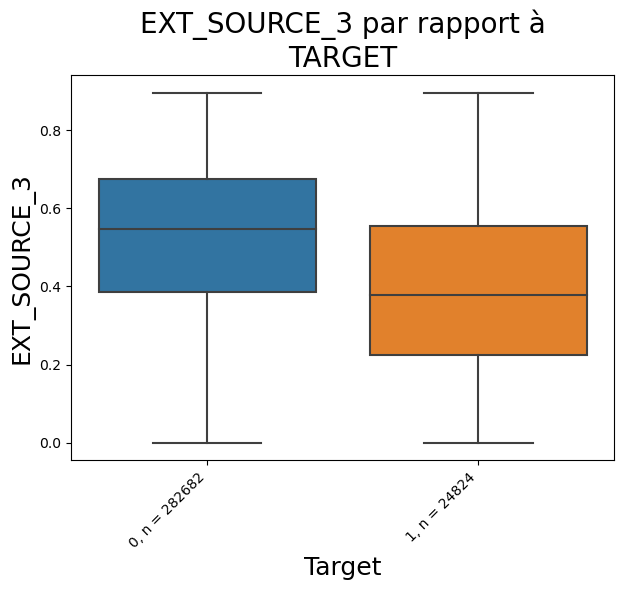

Variable testée :  EXT_SOURCE_3
p_value : 0.00000
La moyenne des deux groupes est statistiquement différente.


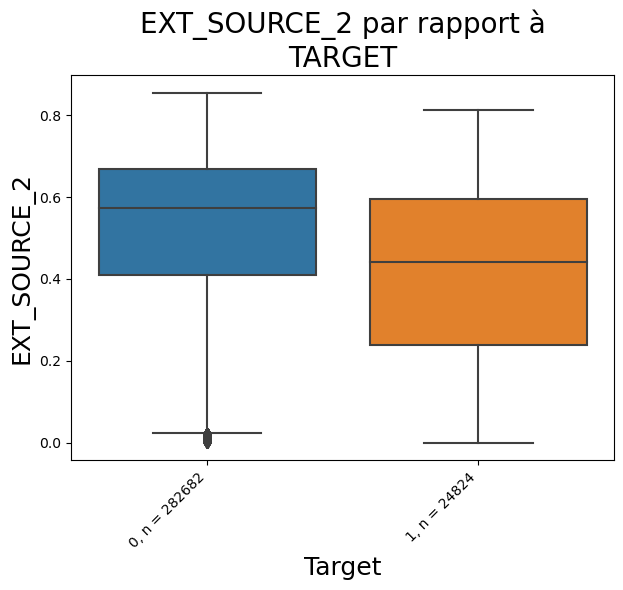

Variable testée :  EXT_SOURCE_2
p_value : 0.00000
La moyenne des deux groupes est statistiquement différente.


In [62]:
for col in most_neg_corr.index[:2]:
    graphBoxplot(data, "TARGET", col, "TARGET", (7,5))
    
    # Pour réduire la skewness
    mask = copy.deepcopy(data[data[col].notnull()])
    mask[col] = np.log1p(mask[col])
    
    test_stat(mask, col)

del mask

On ne sait pas trop ce que ça représente, mais plus cette valeur est basse plus elle est associée à un défaut de paiement.

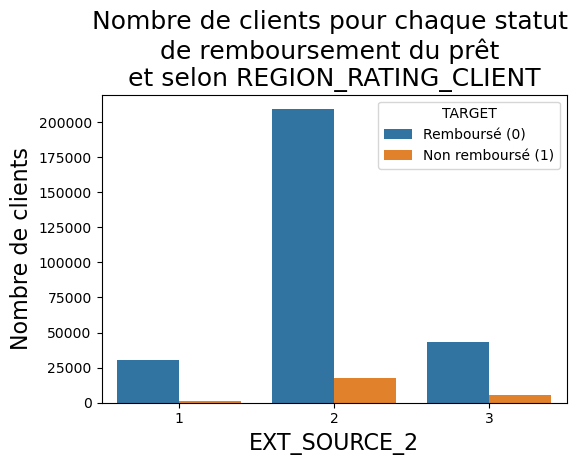

In [63]:
plt.figure(figsize=(6,4))
sns.countplot(data=data, x = "REGION_RATING_CLIENT", hue = "TARGET")
plt.title("Nombre de clients pour chaque statut \nde remboursement du prêt \net selon REGION_RATING_CLIENT", fontsize = 18)
plt.ylabel("Nombre de clients", fontsize = 16)
plt.xlabel(col, fontsize = 16)
plt.legend(title="TARGET", labels=["Remboursé (0)", "Non remboursé (1)"])
plt.show()

In [64]:
chi_test_stat(data, "REGION_RATING_CLIENT")

Variable testée :  REGION_RATING_CLIENT
p_value : 0.00000
Il y a une association significative entre REGION_RATING_CLIENT et la variable TARGET.


In [65]:
data.ANNEES_LAST_PHONE_CHANGE.describe()

count    307505.000000
mean               NaN
std           0.000000
min           0.000000
25%           0.750000
50%           2.070312
75%           4.300781
max          11.750000
Name: ANNEES_LAST_PHONE_CHANGE, dtype: float64

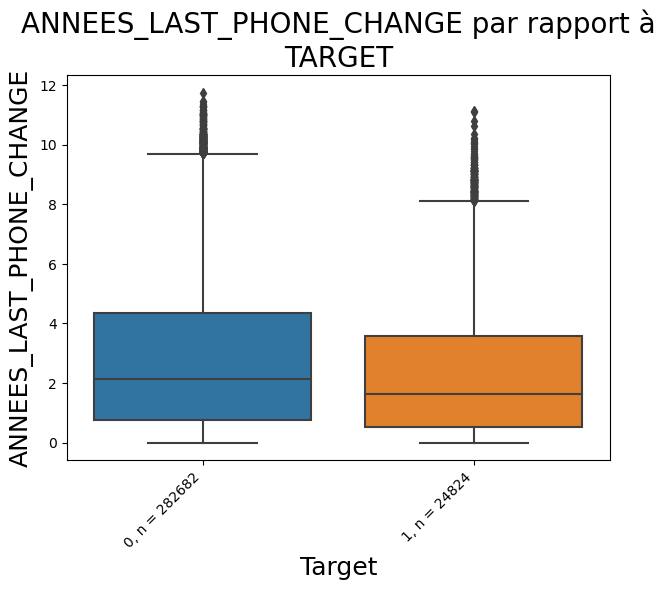

Variable testée :  ANNEES_LAST_PHONE_CHANGE
p_value : 0.00000
La moyenne des deux groupes est statistiquement différente.


In [66]:
graphBoxplot(data, "TARGET", "ANNEES_LAST_PHONE_CHANGE", "TARGET", (7,5))

# Pour réduire la skewness
mask = copy.deepcopy(data[data["ANNEES_LAST_PHONE_CHANGE"].notnull()])
mask[col] = np.log1p(mask["ANNEES_LAST_PHONE_CHANGE"])

test_stat(mask, "ANNEES_LAST_PHONE_CHANGE")

del mask

Un changement récent de téléphone est synonyme d'un échec dans le remboursement de son prêt.

On peut assimiler cela à des dépenses trop courantes et importantes qui ne sont pas en adéquations avec un remboursement d'un prêt. 

On peut ajouter une variable sur les données manquantees

In [67]:
data["donnees_manquantes"] = data.isnull().sum(axis = 1)/data.shape[1]*100

In [68]:
data["donnees_manquantes"] = data["donnees_manquantes"].apply(lambda x: 1 if x <= 5 else 0)

In [69]:
data.loc[data.TARGET == 0, "donnees_manquantes"].value_counts()

1    228711
0     53971
Name: donnees_manquantes, dtype: int64

In [70]:
data.loc[data.TARGET == 1, "donnees_manquantes"].value_counts()

1    19422
0     5402
Name: donnees_manquantes, dtype: int64

In [71]:
test_stat(data, "donnees_manquantes")

Variable testée :  donnees_manquantes
p_value : 0.00000
La moyenne des deux groupes est statistiquement différente.


Le faite de ne pas avoir toutes les données remplies sur l'application tendrait vers un échec de remboursement.

On peut analyser un peu les variables avec des outliers

In [72]:
df = copy.deepcopy(data)

In [73]:
for col in df.columns:
    # Pour ne pas sélectionner les valeurs issues des encodage

    mean = df[col].mean()
    std_dev = df[col].std()
    df['Z-Score'] = (df[col] - mean) / std_dev

    threshold = 10 # 3 est la norme, mais on veut voir les très extrêmes 

    outliers = df.loc[abs(df['Z-Score']) > threshold, col]
    if outliers.shape[0] > 0:
        print("Moyenne = ", df[col].mean())
        print(outliers)
del df

Moyenne =  0.41704552106300363
12615      8
23881      9
34545     11
80948     12
132585    10
154317     8
155369    19
171125    12
176011    14
183878    14
186820    10
265784    19
267998    14
276768     9
Name: CNT_CHILDREN, dtype: int8
Moyenne =  168417.75
1723      1935000.0
3371      1350000.0
4603      1350000.0
8314      1350000.0
10222     2250000.0
            ...    
294892    2250000.0
298082    2475000.0
300468    1575000.0
304477    2025000.0
306028    1350000.0
Name: AMT_INCOME_TOTAL, Length: 150, dtype: float32
Moyenne =  27108.672
12108     225000.0
14643     197230.5
15501     225000.0
17948     258025.5
20119     225000.0
20338     213291.0
23582     225000.0
24428     173704.5
32100     225000.0
34471     173704.5
41874     173574.0
45419     180000.0
66528     225000.0
89256     206167.5
101007    225000.0
101508    230161.5
103006    225000.0
103406    177826.5
104938    225000.0
109209    225000.0
111186    213160.5
117546    208215.0
121842    177696.0
1281

Moyenne =  0.0
2141      1.0
2700      1.0
3448      1.0
4098      1.0
4766      1.0
         ... 
294398    1.0
301027    1.0
303592    1.0
305374    1.0
305676    1.0
Name: NAME_EDUCATION_TYPE_Academic degree, Length: 164, dtype: float16
Moyenne =  0.0
41982     1.0
187348    1.0
Name: NAME_FAMILY_STATUS_Unknown, dtype: float16
Moyenne =  0.0
223       1.0
723       1.0
805       1.0
1163      1.0
1684      1.0
         ... 
305609    1.0
306045    1.0
306270    1.0
306907    1.0
307212    1.0
Name: NAME_HOUSING_TYPE_Co-op apartment, Length: 1122, dtype: float16
Moyenne =  0.0
159       1.0
418       1.0
480       1.0
616       1.0
729       1.0
         ... 
307059    1.0
307104    1.0
307186    1.0
307254    1.0
307317    1.0
Name: NAME_HOUSING_TYPE_Office apartment, Length: 2617, dtype: float16
Moyenne =  0.0
753       1.0
775       1.0
1687      1.0
1743      1.0
2793      1.0
         ... 
305874    1.0
306189    1.0
306686    1.0
306931    1.0
307083    1.0
Name: OCCUPATION_TYP

Moyenne =  0.0
96        1.0
221       1.0
659       1.0
840       1.0
1185      1.0
         ... 
306570    1.0
306651    1.0
306749    1.0
307077    1.0
307452    1.0
Name: ORGANIZATION_TYPE_Restaurant, Length: 1811, dtype: float16
Moyenne =  0.0
34        1.0
485       1.0
599       1.0
780       1.0
984       1.0
         ... 
306966    1.0
307074    1.0
307127    1.0
307161    1.0
307332    1.0
Name: ORGANIZATION_TYPE_Security Ministries, Length: 1974, dtype: float16
Moyenne =  0.0
31        1.0
51        1.0
238       1.0
407       1.0
641       1.0
         ... 
305383    1.0
305846    1.0
306557    1.0
307327    1.0
307506    1.0
Name: ORGANIZATION_TYPE_Services, Length: 1575, dtype: float16
Moyenne =  0.0
1795      1.0
1909      1.0
2942      1.0
3387      1.0
3781      1.0
         ... 
303479    1.0
304506    1.0
305598    1.0
307300    1.0
307482    1.0
Name: ORGANIZATION_TYPE_Telecom, Length: 577, dtype: float16
Moyenne =  0.0
695       1.0
3027      1.0
3651      1.0
4444

Moyenne =  0.0
3990      0.045441
4899      0.333252
7804      0.083313
12467     0.058838
12642     0.071411
            ...   
284995    0.071411
290035    0.071411
291937    0.058838
292627    0.166626
302737    0.076904
Name: BURO_CREDIT_CURRENCY_currency 3_MEAN, Length: 129, dtype: float16
Moyenne =  0.0
18329     0.250000
118391    0.055542
146925    0.250000
168420    0.111084
172234    0.250000
204037    0.142822
205921    0.500000
234906    0.142822
237688    0.125000
Name: BURO_CREDIT_CURRENCY_currency 4_MEAN, dtype: float16
Moyenne =  0.0
928       0.199951
1133      0.500000
2455      0.333252
2561      0.250000
4254      0.500000
            ...   
299748    0.333252
301266    0.250000
301467    1.000000
302341    0.500000
307218    0.199951
Name: BURO_CREDIT_TYPE_Another type of loan_MEAN, Length: 368, dtype: float16
Moyenne =  0.0
71        1.0
89        1.0
116       1.0
284       1.0
525       1.0
         ... 
306485    1.0
306608    1.0
306653    1.0
307006    1.0
30

Moyenne =  0.0
11155     0.851074
28573     0.850586
71529     0.850586
105387    0.871094
111378    0.980957
132644    0.912109
132672    0.863770
134996    0.858398
176549    0.989746
183940    0.907715
264541    0.871094
Name: PREV_RATE_DOWN_PAYMENT_MIN, dtype: float16
Moyenne =  0.0
453       0.285645
2779      0.166626
3180      0.166626
4275      0.222168
4283      0.099976
            ...   
299884    0.187500
301366    0.250000
302310    0.250000
303841    0.250000
305757    0.142822
Name: PREV_NAME_CONTRACT_TYPE_XNA_MEAN, Length: 247, dtype: float16
Moyenne =  0.0
224       0.272705
418       0.545410
970       0.500000
1443      0.333252
2211      0.333252
            ...   
305792    0.285645
306047    0.399902
306623    0.500000
307338    0.272705
307413    0.333252
Name: PREV_FLAG_LAST_APPL_PER_CONTRACT_N_MEAN, Length: 737, dtype: float16
Moyenne =  0.0
425       0.250000
1005      0.500000
2105      0.250000
2436      0.222168
3288      0.250000
            ...   
304837 

Moyenne =  0.0
195       0.75
1472      1.00
1519      1.00
5320      1.00
12835     1.00
          ... 
304257    0.75
305888    1.00
306076    1.00
306093    1.00
307078    1.00
Name: PREV_NAME_CONTRACT_STATUS_Unused offer_MEAN, Length: 172, dtype: float16
Moyenne =  0.0
883       0.199951
993       0.500000
4478      0.199951
4696      1.000000
4896      0.199951
            ...   
300266    0.199951
301103    0.500000
301237    0.199951
303756    0.250000
304371    0.500000
Name: PREV_NAME_PAYMENT_TYPE_Cashless from the account of the employer_MEAN, Length: 375, dtype: float16
Moyenne =  0.0
146       0.666504
251       0.666504
471       1.000000
692       1.000000
1115      1.000000
            ...   
305874    1.000000
306351    1.000000
306656    1.000000
307050    1.000000
307201    1.000000
Name: PREV_NAME_PAYMENT_TYPE_Non-cash from your account_MEAN, Length: 640, dtype: float16
Moyenne =  0.0
6323      1.000000
21539     1.000000
29191     1.000000
30162     1.000000
35058  

Moyenne =  0.0
647       0.50
2140      1.00
2296      1.00
2434      1.00
2792      0.50
          ... 
306138    1.00
306143    0.50
306337    1.00
307013    0.75
307229    0.50
Name: PREV_NAME_GOODS_CATEGORY_Tourism_MEAN, Length: 442, dtype: float16
Moyenne =  0.0
0         1.000000
82        0.500000
1348      0.500000
3101      0.500000
3359      0.500000
            ...   
305679    0.500000
305895    0.500000
306246    0.500000
306529    0.500000
307365    0.666504
Name: PREV_NAME_GOODS_CATEGORY_Vehicles_MEAN, Length: 733, dtype: float16
Moyenne =  0.0
667       0.666504
1016      0.099976
8053      0.166626
15326     0.333252
22281     1.000000
33370     0.111084
38180     0.500000
56190     1.000000
66149     0.099976
71478     0.500000
74284     0.333252
82144     0.166626
89635     1.000000
91407     0.500000
94052     0.333252
98996     0.199951
103526    0.166626
104380    0.199951
112112    0.125000
113090    0.199951
115019    0.500000
125782    1.000000
130279    0.5000

On observe des valeurs qui divergent fortement de la moyenne, mais sans connaissance dans le milieu, il nous est un peu compliqué d'identifier les vrais valeurs de vrais outliers. Cela pourrait faire partie des axs d'améliorations.

***
# <a name="T3">Modélisation</a>

In [74]:
data.value_counts("TARGET")

TARGET
0    282682
1     24824
dtype: int64

In [75]:
def debug_file(df, debug = False):
    
    # On utilise que 3 variables pour tester la modèlisation
    if debug == True:
        X = df[["ANNEES_AGE", "DAYS_EMPLOYED_PERC", "CODE_GENDER"]]
        k_selection = [3]
        dataset_name = "Test avec peu de variables"

    # On utilise l'ensemble des variables
    else : 
        X = df.drop("TARGET", axis = 1)
        k_selection = [40, 60]
        dataset_name = "Test avec l'ensemble des variables"
        
    Y = df["TARGET"]

    # On sépare en 3, train/val/test 
    # Le val set servira principalement pour le tuning du modèle Deep learning 
    # Le test set servira pour comparer les différents modèles entre eux
    
    # Split : 80 / 10 / 10
    xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size = 0.2, stratify = df["TARGET"], random_state = 42)
    xtest, xval, ytest, yval = train_test_split(xtest, ytest, test_size = 0.5, stratify = ytest, random_state = 42)
    
    return xtrain, xtest, xval, ytrain, ytest, yval, dataset_name, k_selection

In [76]:
xtrain, xtest, xval, ytrain, ytest, yval, dataset_name, k_selection = debug_file(data, False)

In [77]:
print("Taille et dimension des données d'entraînement :", xtrain.shape)
print("Taille et dimension des données de test :", xtest.shape)
print("Taille et dimension des données de validation :", xval.shape)

Taille et dimension des données d'entraînement : (246004, 410)
Taille et dimension des données de test : (30751, 410)
Taille et dimension des données de validation : (30751, 410)


### <a name = "T3C1">Features sélection</a>
#### <a name = "T3C11">1 - Variance</a>

Etant donnée la présence d'un grand nombres de variables, on va encore en réduire le nombre :

    - Sélection par la variance (élimination des variables avec peu de variances)
    - F-test (recherche des meilleurs features selon la variance)

On part du principe que des variables avec peu d'informations ne vont pas aider le modèle.

In [78]:
# Proportion :
len(ytrain[ytrain == 1]) / len(ytrain[ytrain == 0])

0.08781533971566916

Etant donné que nous sommes dans un problème de classification binaire et qu'il y a un déséquilibre de classe, on voudrait éliminer les variables qui sont peu informatives de par leur variance. On peut regarder différents thresholds.

In [79]:
col_variance = []
for threshold in [0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.5, 0.75, 1]:
    # On instancie un objet VarianceThreshold avec un threshold de 0 variance
    sel = VarianceThreshold(threshold=threshold)

    #On fit sur nos données
    sel.fit(xtrain)

    var = [x for x in xtrain.columns if x not in xtrain.columns[sel.get_support()]]
    
    col_variance.append([threshold, len(var), var])

In [80]:
col_variance = pd.DataFrame(col_variance, columns= ["Threshold", "Nombre de variables", "Variables"])

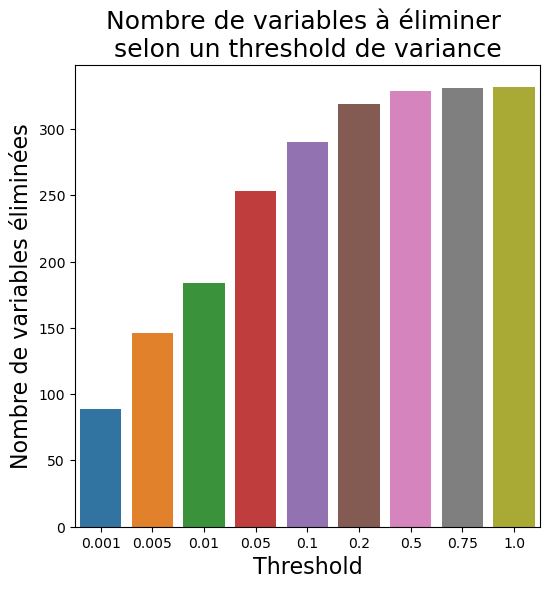

In [81]:
plt.figure(figsize=(6,6))
sns.barplot(data = col_variance, x = "Threshold", y="Nombre de variables")
plt.title("Nombre de variables à éliminer \nselon un threshold de variance", fontsize = 18)
plt.ylabel("Nombre de variables éliminées", fontsize = 16)
plt.xlabel("Threshold", fontsize = 16)  
plt.show()

In [82]:
# on peut regarder quelques une des features
for col in col_variance.Variables.values[0]:
    print(xtrain[col].value_counts())

0.035797    13162
0.046234    10833
0.030762     9684
0.025162     9511
0.026398     9363
            ...  
0.001417      374
0.001333      190
0.000533       32
0.000938       26
0.000290        2
Name: REGION_POPULATION_RELATIVE, Length: 81, dtype: int64
1    246003
0         1
Name: FLAG_MOBIL, dtype: int64
0    245993
1        11
Name: FLAG_DOCUMENT_2, dtype: int64
0    245985
1        19
Name: FLAG_DOCUMENT_4, dtype: int64
0    245959
1        45
Name: FLAG_DOCUMENT_7, dtype: int64
0    245998
1         6
Name: FLAG_DOCUMENT_10, dtype: int64
0    246002
1         2
Name: FLAG_DOCUMENT_12, dtype: int64
0    245944
1        60
Name: FLAG_DOCUMENT_17, dtype: int64
0    245858
1       146
Name: FLAG_DOCUMENT_19, dtype: int64
0    245874
1       130
Name: FLAG_DOCUMENT_20, dtype: int64
0    245924
1        80
Name: FLAG_DOCUMENT_21, dtype: int64
0.0    245791
1.0       213
Name: NAME_TYPE_SUITE_Group of people, dtype: int64
0.0    245998
1.0         6
Name: NAME_INCOME_TYPE_Businessman

0.000000    229918
0.166626       254
0.199951       254
0.250000       250
0.142822       248
             ...  
0.277832         1
0.021271         1
0.025635         1
0.088257         1
0.307617         1
Name: PREV_CODE_REJECT_REASON_XNA_MEAN, Length: 90, dtype: int64
0.000000    231432
0.250000       148
0.500000       141
0.199951       139
0.166626       138
0.333252       131
0.142822       104
1.000000        87
0.125000        86
0.111084        74
0.099976        69
0.090881        47
0.076904        37
0.083313        32
0.071411        29
0.066650        21
0.062500        15
0.058838        14
0.052643        13
0.055542        11
0.285645         9
0.666504         8
0.399902         8
0.047607         8
0.043488         5
0.045441         3
0.040009         3
0.041656         3
0.037048         3
0.153809         3
0.049988         2
0.181763         2
0.035706         2
0.300049         2
0.026321         2
0.034485         2
0.038452         2
0.222168         1
0.44

La plupart des features font parties de celles créées par features engineering.

On va utiliser le threshold 0.001 (pour être assez conservateur) pour éliminer les variables.

In [83]:
# On instancie un objet VarianceThreshold avec un threshold de 0 variance
sel = VarianceThreshold(threshold=0.001)

#On fit sur nos données
sel.fit(xtrain)

zero_var = [x for x in xtrain.columns if x not in xtrain.columns[sel.get_support()]]

print("Il y a %d variables qui ont moins de 0.001 de variance et qui sont écartées" %len(zero_var))

# On élimine sur l'ensemble du jeu de donnée
xtrain = xtrain.loc[:, ~xtrain.columns.isin(zero_var)]
xtest = xtest.loc[:, ~xtest.columns.isin(zero_var)]
xval = xval.loc[:, ~xval.columns.isin(zero_var)]

Il y a 89 variables qui ont moins de 0.001 de variance et qui sont écartées


#### <a name = "T3C12">2 - F-test</a>

Nous allons utiliser SelectKBest(score_func=f_classif) afin d'identifier les variables les plus pertinentes pour identifier les groupes de clients pouvant reembourser leur crédit par rapport à ceux qui ne pourraient pas.

On réduit à 100 variables, pour réduire les ressources utilisées lors de la modélisation.

In [84]:
pipe_preprocess = Pipeline([
                ('imputer', SimpleImputer(strategy='median')),
                ('feature_selection', SelectKBest(score_func=f_classif, k = 100)),
            ])
xtrain_preprocess = pipe_preprocess.fit(xtrain.drop("SK_ID_CURR", axis = 1), ytrain)

On peut regarder les p.values obtenues

In [85]:
df = pd.DataFrame(pipe_preprocess[1].pvalues_, xtrain.drop("SK_ID_CURR", axis = 1).columns)

In [86]:
df = df.reset_index().rename(columns={'index': 'Features', 0: 'p_values'})

In [87]:
df[df.p_values > 0.005].sort_values("p_values").tail(20)

,Features,p_values
192,CLOSED_AMT_CREDIT_SUM_OVERDUE_MEAN,0.710638
83,WEEKDAY_APPR_PROCESS_START_FRIDAY,0.729116
35,AMT_REQ_CREDIT_BUREAU_HOUR,0.749004
78,OCCUPATION_TYPE_Realty agents,0.750417
56,NAME_FAMILY_STATUS_Separated,0.769385
188,CLOSED_CREDIT_DAY_OVERDUE_MEAN,0.780120
268,PREV_CHANNEL_TYPE_Country-wide_MEAN,0.789033
87,WEEKDAY_APPR_PROCESS_START_THURSDAY,0.792000
172,BURO_CNT_CREDIT_PROLONG_SUM,0.811838
110,ORGANIZATION_TYPE_Industry: type 7,0.830590


On observe que certaines variables ne sont pas associées à la Target

In [88]:
df[df.p_values < 0.005].sort_values("p_values").head(20)

,Features,p_values
21,EXT_SOURCE_3,0.000000e+00
20,EXT_SOURCE_2,0.000000e+00
155,ANNEES_AGE,1.363127e-320
229,PREV_NAME_CONTRACT_STATUS_Refused_MEAN,9.125284e-317
174,BURO_CREDIT_ACTIVE_Active_MEAN,2.861372e-253
157,BURO_DAYS_CREDIT_MIN,5.272775e-244
163,BURO_DAYS_CREDIT_UPDATE_MEAN,3.803301e-214
227,PREV_NAME_CONTRACT_STATUS_Approved_MEAN,7.631077e-211
14,REGION_RATING_CLIENT,1.778240e-185
152,DAYS_EMPLOYED_PERC,1.539314e-181


Alors que d'autres sont très associées

In [89]:
best_features = pipe_preprocess.named_steps['feature_selection']
selected_cols = xtrain.drop("SK_ID_CURR", axis = 1).columns[best_features.get_support(indices=True)].insert(0, "SK_ID_CURR")

In [90]:
# On élimine sur l'ensemble du jeu de donnée
xtrain = xtrain.loc[:, xtrain.columns.isin(selected_cols)]
xtest = xtest.loc[:, xtest.columns.isin(selected_cols)]
xval = xval.loc[:, xval.columns.isin(selected_cols)]

In [91]:
print("Taille et dimension des données d'entraînement :", xtrain.shape)
print("Taille et dimension des données de test :", xtest.shape)
print("Taille et dimension des données de validation :", xval.shape)

Taille et dimension des données d'entraînement : (246004, 101)
Taille et dimension des données de test : (30751, 101)
Taille et dimension des données de validation : (30751, 101)


In [92]:
print("Répartition de la variable TARGET")
print(ytrain.value_counts())
print(ytest.value_counts())
print(yval.value_counts())

Répartition de la variable TARGET
0    226145
1     19859
Name: TARGET, dtype: int64
0    28268
1     2483
Name: TARGET, dtype: int64
0    28269
1     2482
Name: TARGET, dtype: int64


On obtient la répartition attendue

On va créer une fonction permettant de faire la sélection des variables, elle sera incorporée aux pipelines des modèles. 

Cela permet d'avoir un traitement automatique de nouvelles données en ne gardant que les variables utilisées par le modèle. 

In [93]:
# On crée un transformer personnalisé sur la sélection des colonnes
# On rajoute un élément permettant d'ignorer les colonnes manquantes
class SelectColumns(BaseEstimator, TransformerMixin):
    def __init__(self, columns, ignore_missing=False):
        self.columns = columns
        self.ignore_missing = ignore_missing

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        if self.ignore_missing:
            selected_columns = [col for col in self.columns if col in X.columns]
        else:
            selected_columns = self.columns

        return X[selected_columns]

### <a name = "T3C1">a. Pipeline</a>

Nous avons observé qu'il y avait une sous-représentation des individus n'ayant pas sur rembourser leur crédit contre ceux qui ont pu le rembourser (1/10). Il faut traiter ce problème, sinon les algorithmes auront dû mal à prédire.

Pour cela, nous allons tester les algorithmes de la librairie imbalanced-learn

In [94]:
# ancienne version avant ajout dans pipeline
def resample(x_train, y_train, choice = 0):
    ## 
    # Fonction qui resample les échantillons par sous, sur ou un mélange de ré échantillonnage
    # Par défaut, pas de resampling
    ##

    # On utilise différentes méthodes pour traiter les échantillons 
    #if choice == 1:
        # On sous-échantillonne le groupe majoritaire
     #   ss_echant = NearMiss()
      #  x_resampled, y_resampled = ss_echant.fit_resample(x_train, ytrain)
    if choice == 1:
        # On sur-échantillonne le groupe minoritaire
        sur_echant = SMOTE()
        x_resampled, y_resampled = sur_echant.fit_resample(x_train, ytrain)
    #elif choice == 2:
     #   # Combinaison des 2 méthodes
      #  comb_echant = SMOTEENN()
       # x_resampled, y_resampled = comb_echant.fit_resample(x_train, ytrain)
    else:
        # No resampling
        x_resampled, y_resampled = x_train, y_train
    
    if choice != 0:
        print("Ancienne distribution :", Counter(y_train))
        print("Nouvelle distribution :", Counter(y_resampled))
    
    return x_resampled, y_resampled

In [95]:
def plot_feature_importance(importance, names, model_name):
    ## 
    #    Fonction affichant les 20 plus importantes features des modèles de type DecisionTree
    ##
    
    # On créé 2 listes  contenant les coefficients et le nom des features
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    # On créé un dataframe à partir d'un dictionnaire
    df = {"feature_names" : feature_names, "feature_importance" : feature_importance}
    fi_df = pd.DataFrame(df)

    # On classe notre dataframe par feature importance (décroissance)
    fi_df.sort_values("feature_importance", ascending = False, inplace = True)

    taille_max = 0.4 * len(names) if len(names) < 20 else 0.4 * 20
    
    plt.figure(figsize=(10, taille_max))
    
    # On affiche que les 20 premières features
    sns.barplot(x = fi_df["feature_importance"][:20], y = fi_df["feature_names"][:20])

    plt.title(model_name)
    
    plt.xlabel("FEATURE IMPORTANCE (coefficient)")
    plt.ylabel("FEATURES")
    
    plt.show()
    
    
def plot_coefficients_importance(feature_importance, names, model_name):
    ## 
    #    Fonction affichant les 20 plus importantes features des modèles de type Regression
    ##
    
    # On créé 1 liste  contenant le nom des features
    feature_names = np.array(names)
    
    # On créé un dataframe à partir d'un dictionnaire
    df = {"feature_names" : feature_names, "feature_importance" : feature_importance}
    fi_df = pd.DataFrame(df)

    # On classe notre dataframe par feature importance (décroissance)
    fi_df.sort_values("feature_importance", ascending = False, inplace = True)

    taille_max = 0.4 * len(names) if len(names) < 20 else 0.4 * 20
    
    plt.figure(figsize=(10, taille_max))
    
    # On affiche que les 20 premières features
    sns.barplot(x = fi_df["feature_importance"][:20], y = fi_df["feature_names"][:20])

    plt.title(model_name)
    plt.xlabel("FEATURE IMPORTANCE (coefficient)")
    plt.ylabel("FEATURES")
    
    plt.show()   

Matrice de confusion :

**Positif/Negatif : Type de classe (label) ["Non", "Oui"] True/False: Correctement ou incorrectement classifié par le modèle.**


- Vrais négatifs (En haut à gauche) : Nombre de classifications correctes de la classe "Non" (Bon client).


- Faux positifs (En haut à droite) : Nombre de classifications incorrectes de la classe "Non" (Bon client).


- Faux négatifs (En bas à gauche) : Nombre de classifications incorrectes de la classe "Oui" (Mauvaise client).


- Vrais positifs (En bas à droite) : Nombre de classifications correctes de la classe "Oui" (Mauvaise client).

In [96]:
# Fonction affichant la matrice de confusion
def matrice_confusion(real_labels, predicted_labels):

    conf_mat = confusion_matrix(real_labels, predicted_labels, labels = [0, 1])

    df_cm = pd.DataFrame(conf_mat)
    
    plt.figure(figsize = (6,4))
    
    # On garde la valeur précédente pour la restaurer ensuite
    original_font_weight = plt.rcParams['font.weight']
    plt.rcParams['font.weight'] = 'bold'
    
    sns.heatmap(df_cm, annot=True, fmt='d', cmap="Blues")
    
    classes = ["Bon client", "Mauvais client"]
    
    tick_positions = np.arange(0.5, len(classes))
    plt.xticks(tick_positions, classes)
    plt.yticks(tick_positions, classes)
    
    plt.ylabel('Vrais labels', fontsize=20)
    
    plt.xlabel('Labels prédits', fontsize=20)
     
    # On ajoute du texte à la figure
    texte_add = ["Vrais négatifs", "Faux positifs", "Faux négatifs", "Vrais positifs"]
    n = 0
    
    # Pour alléger le code
    conditions_affichage = {'ha': 'center', 'va': 'center', 'color': 'black', 'weight': 'bold'}
    
    for i in range(len(df_cm)):
        for j in range(len(df_cm)):
            # On mesure le pourcentage sur le total de chaque label
            #pourcentage = round(df_cm.iloc[i, j] / len(real_labels) * 100, 1) 
            pourcentage = round(df_cm.iloc[i, j] / (df_cm.iloc[i, 0] + df_cm.iloc[i, 1]) * 100, 1)
                
            # On change la couleur du texte selon le background
            if df_cm.iloc[i, j] > df_cm.values.max() / 2:
                conditions_affichage['color'] = 'white'
            else:
                conditions_affichage['color'] = 'black'
            
            # On ajoute du texte
            plt.text(j + 0.5, i + 0.625, "(" + str(pourcentage) + " %)", **conditions_affichage)
            plt.text(j + 0.5, i + 0.75, texte_add[n], **conditions_affichage)
            n += 1
    
    plt.rcParams['font.weight'] = original_font_weight

    plt.show()

# Fonction affichant plusieurs métriques comparant les résultats de prédictions vs réels et matrice de confusion
def results_prediction(real_labels, predicted_labels):

    print(classification_report(real_labels, predicted_labels))

    # on appel la fonction matrice_confusion
    matrice_confusion(real_labels, predicted_labels)

In [97]:
def calcul_nombre_hyperparametres(param_grid):
    ##
    #    Fonction retournant le nombre total d'hyperparamètres testés
    ##
    
    # On initialise
    total = 1
    
    # On parcours le dictionnaire
    for values in param_grid.values():
        total *= len(values)
    
    # On retourne le nombre total
    return total

In [98]:
def extract_confusion_matrix_metrics(confusion_m):
    ##
    # Fonction extraction les valeurs de la matrice de confusion
    # Retourne sous la forme d'un dictionnaire
    ##
    vn = confusion_m[0, 0]  # vrais négatifs
    vp = confusion_m[1, 1]  # vrais positifs
    fp = confusion_m[0, 1]  # faux positifs
    fn = confusion_m[1, 0]  # faux negatifs
    
    valeurs_matrice = {
        "VN": vn,
        "VP": vp,
        "FP": fp,
        "FN": fn
    }
    
    return valeurs_matrice


In [99]:
def classification_scores(y_true_labels, y_pred_labels,):
    ##
    #    On calcul les valeurs moyennes de précision, recall et score F1
    ##
    precision_mean = round(precision_score(y_true_labels, y_pred_labels, average="macro"), 2)
    recall_mean = round(recall_score(y_true_labels, y_pred_labels, average="macro"), 2)
    f1_mean = round(f1_score(y_true_labels, y_pred_labels, average="macro"), 2)
    
    return precision_mean, recall_mean, f1_mean

In [100]:
def top_shape_features(shap_values, x_train_ech, feature_names):
    ##
    #    Fonction permettant de récupèrer les 20 features les plus importantes
    ##
    
    # On calcul la somme absolue des valeurs Shap de chaque feature
    shap_values_sum = np.abs(shap_values).mean(axis=0)

    # On trie les sommes des valeurs shap du plus haut au plus petit
    sorted_features_index = np.argsort(shap_values_sum)[::-1]

    max_len = 20 if len(feature_names) > 20 else len(feature_names)
    
    # On sélectionne les N features avec valeurs les plus hautes
    top_features_index = sorted_features_index[:max_len]  
    
    # On récupère les noms des features
    top_feature_names = [feature_names[i] for i in top_features_index]

    # On filtre pour n'avoir que les N features sélectionnées
    shap_values_top = shap_values[:, top_features_index]
    x_train_ech_top = x_train_ech[:, top_features_index]
    
    return x_train_ech_top, shap_values_top, top_feature_names, shap_values_sum

def coefficients_importance_by_shape(model, model_name, x_train, y_train, feature_names, model_type):
    ##
    #    Fonction permettant un affichage indépendant avec SHAP de l'importance des variables dans les modèles
    #    De façon local et global
    ##

    np.random.seed(42)
    random.seed(42)  
        
    # On sélectionnne un sous échantillonnage pour limiter les temps de calcul
    ech_indices = np.random.choice(x_train.shape[0], size = 500, replace=False)
    x_train_ech = x_train[ech_indices]
    
    if model_type == 0: 
        explainer = shap.LinearExplainer(model, x_train_ech)

    elif model_type == 1:
        explainer = shap.TreeExplainer(model, x_train_ech)

    elif model_type == 2:
        explainer = shap.KernelExplainer(model.predict_proba, x_train_ech)
        
    elif model_type == 3:
        explainer = shap.PermutationExplainer(model, x_train_ech)
        
    # check_additivity=False pour les TreeExplainer
    shap_values = explainer.shap_values(x_train_ech) if model_type != 1 else explainer.shap_values(x_train_ech, check_additivity=False)
    if model_type != 3:
        expected_values = explainer.expected_value
    
    if len(shap_values) == 2:
        shap_values = shap_values[1] 
        expected_values = expected_values[0]
        
    print("Utilisation de SHAP pour une explication indépendante des modèles")
    print("En quoi les variables contribue à un défaut de paiement :")
    
    # On récupère les meilleures features
    x_train_ech_top, shap_values_top, top_feature_names, feature_importances = top_shape_features(shap_values, x_train_ech, feature_names)
    
    # On affiche l'importance des features selon SHAP
    plot_feature_importance(feature_importances, feature_names, model_name)
    
    shap.summary_plot(shap_values_top, 
                      x_train_ech_top,
                      feature_names=[name[:20] for name in top_feature_names], 
                      max_display=20, show=False, plot_size=(10, 6))
    
    # On récupère les informations des objets figures
    fig, ax = plt.gcf(), plt.gca()

    ax.tick_params(labelsize=14)
    ax.set_xlabel("Valeurs de SHAP (impacts sur les sorties du modèle)", fontsize=16)
    ax.set_title("Importance des Features - Prédiction sur l'obtention d'un crédit bancaire", fontsize=20)
    
    #On met une limite, pour avoir un meilleur affichage
    #ax.set_xlim(-2, 2)
    
    # On récupère la barre de couleur
    cb_ax = fig.axes[1] 

    # On modifie les paramètres de la barre de couleur
    cb_ax.tick_params(labelsize=15)
    cb_ax.set_ylabel("Feature value", fontsize=20)
    
    plt.show()
    
    # On recherche les indices de chaque catégories
    ech_indices_cat0 = np.where((y_train.iloc[ech_indices] == 0))[0]
    ech_indices_cat1 = np.where((y_train.iloc[ech_indices] == 1))[0]

    # On choisit aléatoirement 3 de chaque catégories
    random_indices_cat0 = random.sample(list(ech_indices_cat0), 3)
    random_indices_cat1 = random.sample(list(ech_indices_cat1), 3)
    
    if model_type != 3:
        for i in range(2):
            category_indices = random_indices_cat0 if i == 0 else random_indices_cat1
        
        for j in range(3):
            shap.force_plot(expected_values, shap_values_top[category_indices[j]], top_feature_names, matplotlib=True)
            plt.show()
                  
    #shap.summary_plot(explainer.shap_values(x_train_ech), x_train_ech, plot_type="bar")

def affichage_features(model, model_name, selected_cols, x_train_preprocessed, y_train, model_type = None):

    # On affiche les features les plus importantes pour ce type de modèle
    if model_type == "DecisionTree":
        # On récupère le niveau d'importance des features des modèles de type arbre de décision 
        features_importances = model.feature_importances_

        plot_feature_importance(features_importances, selected_cols, model_name)

        coefficients_importance_by_shape(model, model_name, x_train_preprocessed, y_train, selected_cols, model_type = 1)

     # On affiche les features les plus importantes pour ce type de modèle
    elif model_type == "Regression":
        # On récupère le niveau d'importance des features des modèles de type régression
        features_importances = model.coef_[0]

        plot_coefficients_importance(features_importances, selected_cols, model_name)

        coefficients_importance_by_shape(model, model_name, x_train_preprocessed, y_train, selected_cols, model_type = 0)

    elif model_type == "kernel":

        coefficients_importance_by_shape(model, model_name, x_train_preprocessed, y_train, selected_cols, model_type = 2)
    

In [101]:
def round_up(a, th):
    if a - int(a) >= th:
        return int(a) + 1
    return int(a)

def calcul_scores(best_estimator, x_train, y_train, x_test, y_test, beta, threshold = 0.5, 
                  my_func = None, proba = False):
    ##
    #    Fonction permettant de mesurer un certains nombre de métriques
    #    Par défaut, nous utilisons un threshold de 0.5
    #    Retourne les résultats sous la forme d'un dictionnaire
    ##
    
    if proba == False :
        # On prédit les probabilités 
        y_pred_prob_train = best_estimator.predict_proba(x_train)[:, 1]
        y_pred_prob_test = best_estimator.predict_proba(x_test)[:, 1]

        # On prédit les labels
        y_pred_train = (best_estimator.predict_proba(x_train)[:, 1] >= (threshold)).astype(int)
        y_pred_test = (best_estimator.predict_proba(x_test)[:, 1] >= (threshold)).astype(int)

    elif proba == True :
    # Quand le modèle prédit directement des probabilitées
        # On prédit les probabilités 
        
        y_pred_prob_train = best_estimator.predict(x_train, verbose = 0)
        y_pred_prob_test = best_estimator.predict(x_test, verbose = 0)
        
        # On prédit les labels
        y_pred_train = np.where(y_pred_prob_train >= threshold, 1, 0)
        y_pred_test = np.where(y_pred_prob_test >= threshold, 1, 0)
        
    # On calcul le score de performance
    if my_func != None :
        score_performance_train = round(my_func(y_train, y_pred_train, threshold), 2)
        score_performance_test = round(my_func(y_test, y_pred_test, threshold), 2)
    else : 
        score_performance_train = np.nan
        score_performance_test = np.nan
        
    # On calcul le score roc auc
    roc_auc_train = round(roc_auc_score(y_train, y_pred_prob_train), 2)
    roc_auc_test = round(roc_auc_score(y_test, y_pred_prob_test), 2)

    # On calcul le pourcentage d'erreur
    errors_train = round(100 * (1 - accuracy_score(y_train, y_pred_train)), 2)
    errors_test = round(100 * (1 - accuracy_score(y_test, y_pred_test)), 2)
    
    # On calcul le f beta score
    f_beta_train = round(fbeta_score(y_train, y_pred_train, beta=beta), 2)
    f_beta_test = round(fbeta_score(y_test, y_pred_test, beta=beta), 2)

    # On calcul les différents scores de la matrice de confusion
    precision_mean, recall_mean, f1_mean = classification_scores(ytest, y_pred_test)

    scores = {
        "score_performance_train": score_performance_train,
        "score_performance_test": score_performance_test,
        "roc_auc_train": roc_auc_train,
        "roc_auc_test": roc_auc_test,
        "errors_train": errors_train,
        "errors_test": errors_test,
        "f_beta_train": f_beta_train,
        "f_beta_test": f_beta_test,
        "precision_mean": precision_mean,
        "recall_mean": recall_mean,
        "f1_mean": f1_mean
    }

    return scores


In [102]:
def affichage_score(best_params, dict_scores):
    ##
    #    Fonction d'affichage des scores des métriques
    ##
    
    print("\n\n")
    print("_" * 100)
    print("Meilleurs paramètres :", best_params)
    print("Temps de recherche des meilleurs paramètres :", dict_scores["training_time"])
    print("Temps d'exécution :", dict_scores["elapsed_time"])
    print("_" * 20)
    print("Résultats sur échantillons d'entraînement :")
    print("Score performance : %.2f %%" %dict_scores["score_performance_train"])
    print("Erreur : %.2f %%" %dict_scores["errors_train"])
    print("ROC_AUC :", dict_scores["roc_auc_train"])
    print("Fbeta-Score : %.2f " %dict_scores["f_beta_train"])
    print("_" * 20)
    print("Résultats sur échantillons de test :")
    print("Score performance : %.2f %%" %dict_scores["score_performance_test"])
    print("Erreur : %.2f %%" %dict_scores["errors_test"])
    print("ROC_AUC :", dict_scores["roc_auc_test"])
    print("Precision moyenne : %.2f " %dict_scores["precision_mean"])
    print("Recall moyen : %.2f " %dict_scores["recall_mean"])
    print("F1-Score moyen : %.2f " %dict_scores["f1_mean"])
    print("Fbeta-Score : %.2f " %dict_scores["f_beta_test"])
    print("_" * 100)
    print("\n\n")

In [103]:
def search_model_params(model_name, model, params, x_train, y_train, x_test, y_test, cols_model, model_type = None, verb = 1):
    ##
    #    Fonction recherchant les meilleurs paramètres du modèle à l'aide d'un gridsearch
    #    On retourne un certain nombre de métriques de scores 
    ##

    # model : nom du modèle testé (format string)
    # model_type : type de modèle testé (format string)
    # cls : modèle instancier à tester
    # params : paramètres du modèle à tester avec gridsearch
    # train/test : données utilisées
    # cols_model : variables utilisées
    # verb : verbosité, affichage des résultats
    # On retourne les scores obtenus avec le modèle et ses meilleurs paramètres
    
    
    # Création du pipeline
    # On réduit les données au nombre de variables sélectionnées (intérêt avec de nouvelles données)
    # On réalise une imputation (median)
    # On élimine les features sans variance après imputation
    # On réalise une sélection des features avec ANOVA
    # Prend en compte un scaler et un sampler avant d'appliquer le modèle
    # On utilise un sampler dû aux données sur représentées
    # On instancie le modèle
    
    # Permet de sélectionner les colonnes d'intérêts
    column_selector = SelectColumns(columns=cols_model, ignore_missing=True)
    
    pipe = Pipeline([
        ('select_columns', column_selector),
        ('imputer', SimpleImputer(strategy='median')),
        ('feature_elimination', VarianceThreshold(threshold=0.0)),
        ('feature_selection', SelectKBest(score_func=f_classif)),
        ('scaler', None),
        ('sampler', None),
        ('model', model)
    ])
    
    # On crée un dictionnaire qui contiendra les différents scores
    scores = {}
    
    # On veut suivre plusieurs scores
    precision_scorer = make_scorer(precision_score, zero_division=1, greater_is_better=True)
    recall_scorer = make_scorer(recall_score, zero_division=1, greater_is_better=True)
    f1_scorer = make_scorer(f1_score, zero_division=1, greater_is_better=True)
    beta = 2
    f_beta_scorer = make_scorer(fbeta_score, zero_division=1, beta=beta, greater_is_better=True)
    
    scorers = {
    "roc_auc" : "roc_auc",
    "precision_scorer" : precision_scorer,
    "recall_scorer" : recall_scorer,
    "f1_scorer" : f1_scorer,
    "f_beta" : f_beta_scorer,
    }
            
    time0 = time.time()
    
    # On instancie un StratifiedKFold pour garder la répartition dans le gridsearch
    # Je réduit à 3 pour augmenter la vitesse d'éxecution, les tests préliminaires ont montré que 3 était suffisant 
    stratified_kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
    
    # On réalise un RandomizedSearchCV pour trouver les meilleurs hyperparamètres pour les modèle de type "arbre de décision"
    if model_type == "DecisionTree":
        # On test 75 % des paramètres
        n_iter = calcul_nombre_hyperparametres(params) * 0.75
        
        print("Nous testons %d hyperparamètres" %n_iter) 

        grid = RandomizedSearchCV(pipe, params, cv = stratified_kfold, scoring = scorers, refit = "f_beta", 
                                  verbose = 1, n_iter = n_iter)#, n_jobs=-1)
        
    # On réalise un GridSearchCV pour trouver les meilleurs hyperparamètres pour les modèles de type non "arbre de décision"
    else :
        print("Nous testons %d hyperparamètres" %calcul_nombre_hyperparametres(param_grid_search)) 
        
        grid = GridSearchCV(pipe, params, cv = stratified_kfold, scoring = scorers, refit = "f_beta", 
                            verbose = 1)#, n_jobs=-1)


    # On fit sur les données d'entrainement
    grid.fit(x_train, y_train)

    time1 = time.time()

    # On mesure le temps d'entrainement
    scores["training_time"] = round(time1 - time0, 1)

    # On récupère les meilleurs paramètres 
    best_param_pipe = grid.best_estimator_
        
    # On réalise une cross évaluation
    cross_scores = cross_val_score(best_param_pipe, x_train, y_train, cv=stratified_kfold, scoring=f_beta_scorer)
    print("Cross-validation score : %0.2f avec un écart-type de %0.2f \n" 
              % (cross_scores.mean(), cross_scores.std()))
    
    # On mesure les différentes métriques et on ajoute au dictionnaire
    scores.update(calcul_scores(best_param_pipe, x_train, y_train, x_test, y_test, beta))

    # On mesure le temps d'application du meilleur modèle
    scores["elapsed_time"] = round(time.time() - time1, 1)
    
    if verb == 1:
        # On affiche les différents résultats des métriques
        affichage_score(grid.best_params_, scores)
        
        # On affiche la matrice de confusion
        results_prediction(ytest, best_param_pipe.predict(x_test))
        
        # On transform x_train selon le pipeline (en enlevant les 2 dernières étapes)
        # Note : peut etre x_test à l'avenir
        x_train_preprocessed = best_param_pipe[:-2].transform(x_train)

        # On récupère le nom des colonnes sélectionnées
        selected_cols = x_train.columns[grid.best_estimator_['feature_selection'].get_support()]
        
        # On affiche l'importance des features
        affichage_features(best_param_pipe.named_steps['model'], model_type, selected_cols, x_train_preprocessed, y_train, model_type)

    # On retourne les différentes métriques et le meilleur modèle
    return scores, best_param_pipe


In [104]:
def log_mlflow(param_grid, df, dataset_name, dict_scores, trained_model):
    ##
    #    Fonction cataloguant les résultats des différentes métriques obtenus   
    #    Mais également les données utilisées
    ##
    
    # On catalogue les hyperparamètres utilisés
    mlflow.log_params(param_grid_search)    
    
    # On catalogue les meilleurs hyperparamètres du modèle
    best_params = trained_model[1:-1].named_steps
    mlflow.log_params({"best_" + key: value for key, value in best_params.items()})
    
    # On catalogue le dataset utilisé
    dataset = mlflow.data.from_pandas(df, source="fichiers/concatenate_files.csv")

    mlflow.log_input(dataset, context=dataset_name)
    
    # On catalogue les métriques (on parcours le dictionnaire)
    for key, value in dict_scores.items():
        mlflow.log_metric(str(key), value)
    
    # On catalogue le modèle
    log_model(trained_model, "Modèle entrainé")

Les tests préliminaires sur un petit nombre de données a permis d'écarter un certains nombre de test d'hyperparamètres.

Ce qui permet de réduire le nombre d'hyperparamètres et pré traitement à tester avec l'ensemble des données.

NearMiss ne sera pas utiliser dans les samplers et on va utiliser directement un Scaler.

SMOTEENN est plus performant que SMOTE, mais prend plus de temps d'execution. On testera quand on aura validé un modèle.

In [105]:
# Liste permettant de conserver les résultats des performances des différents modèles
resultats_models = []

### <a name = "T3C2">b. DummyClassifier</a>

Nous testons 2 hyperparamètres
Fitting 3 folds for each of 2 candidates, totalling 6 fits
Cross-validation score : 0.00 avec un écart-type de 0.00 



Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.





____________________________________________________________________________________________________
Meilleurs paramètres : {'feature_selection__k': 40, 'imputer': SimpleImputer(strategy='median'), 'sampler': None, 'scaler': StandardScaler()}
Temps de recherche des meilleurs paramètres : 25.7
Temps d'exécution : 10.9
____________________
Résultats sur échantillons d'entraînement :
Score performance : nan %
Erreur : 8.07 %
ROC_AUC : 0.5
Fbeta-Score : 0.00 
____________________
Résultats sur échantillons de test :
Score performance : nan %
Erreur : 8.07 %
ROC_AUC : 0.5
Precision moyenne : 0.46 
Recall moyen : 0.50 
F1-Score moyen : 0.48 
Fbeta-Score : 0.00 
____________________________________________________________________________________________________



              precision    recall  f1-score   support

           0       0.92      1.00      0.96     28268
           1       0.00      0.00      0.00      2483

    accuracy                           0.92     30751
   macro av

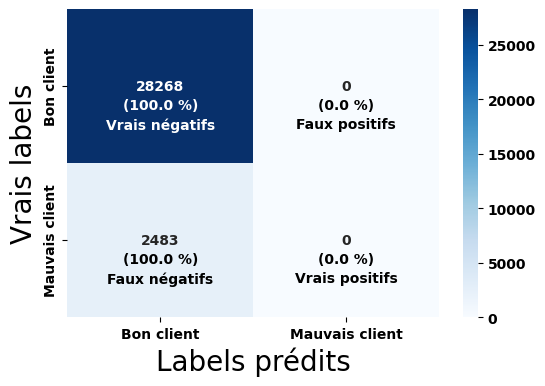

The specified dataset source can be interpreted in multiple ways: LocalArtifactDatasetSource, LocalArtifactDatasetSource. MLflow will assume that this is a LocalArtifactDatasetSource source.
Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
Setuptools is replacing distutils.


In [106]:
# On recherche les meilleurs hyperparamètres
param_grid_search = {
                     "imputer" : [SimpleImputer(strategy='median')],# SimpleImputer(strategy='mean')],
                     "feature_selection__k" : k_selection, #(3 pendant le debug)
                     "scaler" : [StandardScaler()],
                     "sampler" : [None] # on ne test pas de sampler, on veut un classifier simple
}

# On instancie le modèle
knn = DummyClassifier(random_state = 42)

# On ajoute en plus du nom du classifier
name = "DummyClassifier"

# On commence l'enregistrement mlflow 
with mlflow.start_run(run_name=name) as run:
    
    # On récupère les résultats après application de la fonction search_model_params
    results, model = search_model_params(name, knn, param_grid_search, xtrain, ytrain, xtest, ytest, selected_cols)
    
    # On catalogue le dataset utilisé, les paramètres grids, les métriques produites et le modèle  
    log_mlflow(param_grid_search, data, dataset_name, results, model)
    
# On ajoute à la liste de résultats des modèles
resultats_models.append([name] + list(results.values()))

### <a name = "T3C3">c. KNeighborsClassifier</a>

Nous testons 12 hyperparamètres
Fitting 3 folds for each of 12 candidates, totalling 36 fits
Cross-validation score : 0.35 avec un écart-type de 0.00 




____________________________________________________________________________________________________
Meilleurs paramètres : {'feature_selection__k': 40, 'imputer': SimpleImputer(strategy='median'), 'model__n_neighbors': 20, 'model__weights': 'uniform', 'sampler': SMOTE(), 'scaler': StandardScaler()}
Temps de recherche des meilleurs paramètres : 1537.3
Temps d'exécution : 280.5
____________________
Résultats sur échantillons d'entraînement :
Score performance : nan %
Erreur : 44.30 %
ROC_AUC : 0.92
Fbeta-Score : 0.47 
____________________
Résultats sur échantillons de test :
Score performance : nan %
Erreur : 49.46 %
ROC_AUC : 0.65
Precision moyenne : 0.53 
Recall moyen : 0.61 
F1-Score moyen : 0.42 
Fbeta-Score : 0.34 
____________________________________________________________________________________________________



            

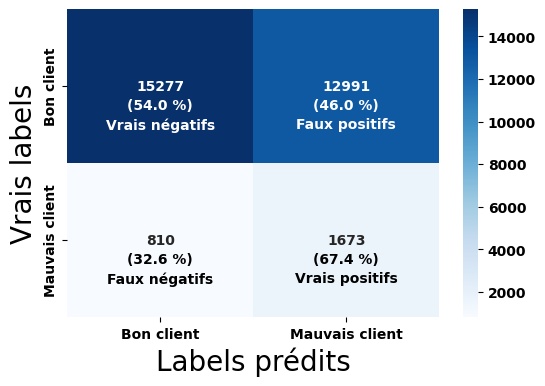

The specified dataset source can be interpreted in multiple ways: LocalArtifactDatasetSource, LocalArtifactDatasetSource. MLflow will assume that this is a LocalArtifactDatasetSource source.
Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.


In [107]:
# On recherche les meilleurs hyperparamètres
param_grid_search = {
                     "imputer" : [SimpleImputer(strategy='median')],
                     "feature_selection__k" : k_selection, #(3 pendant le debug)
                     "scaler" : [StandardScaler()],
                     "sampler" : [None, SMOTE()],
                     "model__n_neighbors" : [3, 10, 20], 
                     "model__weights" : ["uniform"]}

# On instancie le modèle
knn = KNeighborsClassifier(n_jobs = -1)

# On ajoute en plus du nom du classifier
name = "KNeighborsClassifier"

# On commence l'enregistrement mlflow 
with mlflow.start_run(run_name=name) as run:
    
    # On récupère les résultats après application de la fonction search_model_params
    results, model = search_model_params(name, knn, param_grid_search, xtrain, ytrain, xtest, ytest, selected_cols)#, "kernel")
    
    # On catalogue le dataset utilisé, les paramètres grids, les métriques produites et le modèle retenu  
    log_mlflow(param_grid_search, data, dataset_name, results, model)

# On ajoute à la liste de résultats des modèles
resultats_models.append([name] + list(results.values()))

### <a name = "T3C4">d. RandomForestClassifier</a>

Nous testons 18 hyperparamètres
Fitting 3 folds for each of 18 candidates, totalling 54 fits
Cross-validation score : 0.36 avec un écart-type de 0.00 




____________________________________________________________________________________________________
Meilleurs paramètres : {'scaler': StandardScaler(), 'sampler': SMOTE(), 'model__n_estimators': 1000, 'model__max_depth': 5, 'imputer': SimpleImputer(strategy='median'), 'feature_selection__k': 40}
Temps de recherche des meilleurs paramètres : 3889.3
Temps d'exécution : 427.7
____________________
Résultats sur échantillons d'entraînement :
Score performance : nan %
Erreur : 28.75 %
ROC_AUC : 0.71
Fbeta-Score : 0.37 
____________________
Résultats sur échantillons de test :
Score performance : nan %
Erreur : 28.77 %
ROC_AUC : 0.7
Precision moyenne : 0.55 
Recall moyen : 0.64 
F1-Score moyen : 0.53 
Fbeta-Score : 0.36 
____________________________________________________________________________________________________



              pr

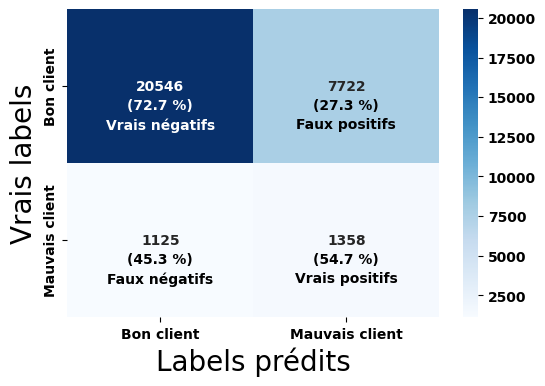

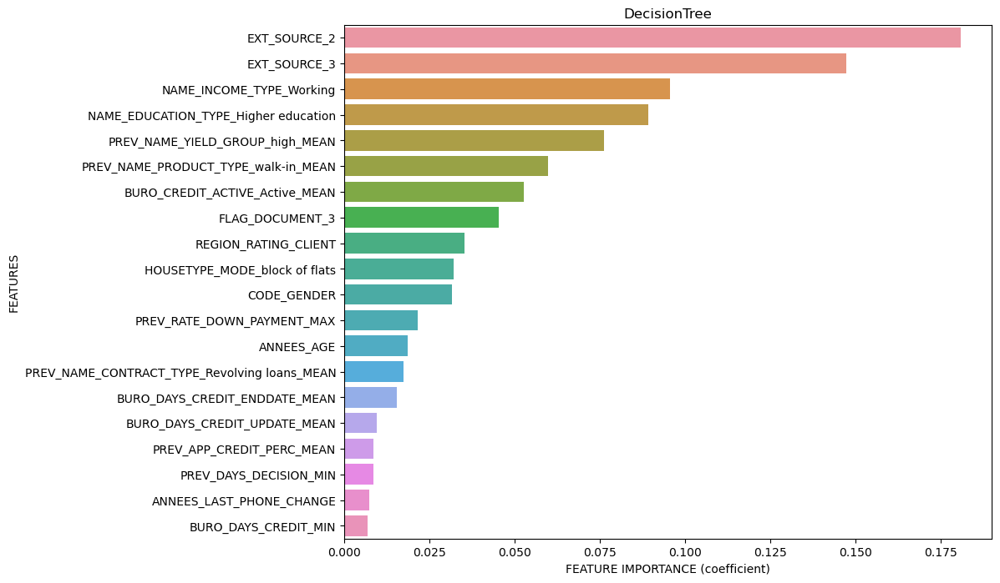

 99%|===================| 993/1000 [00:40<00:00]        

Utilisation de SHAP pour une explication indépendante des modèles
En quoi les variables contribue à un défaut de paiement :


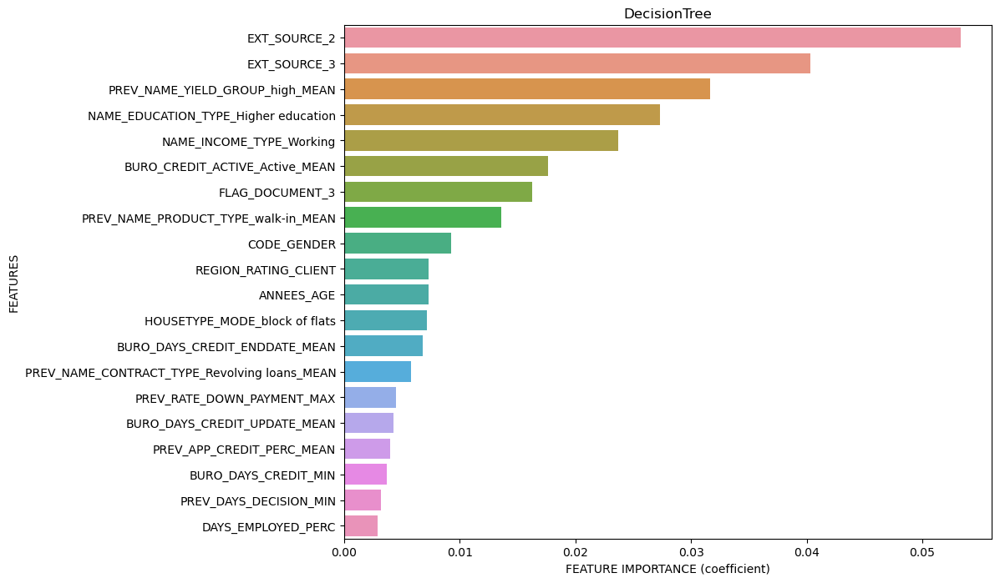

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


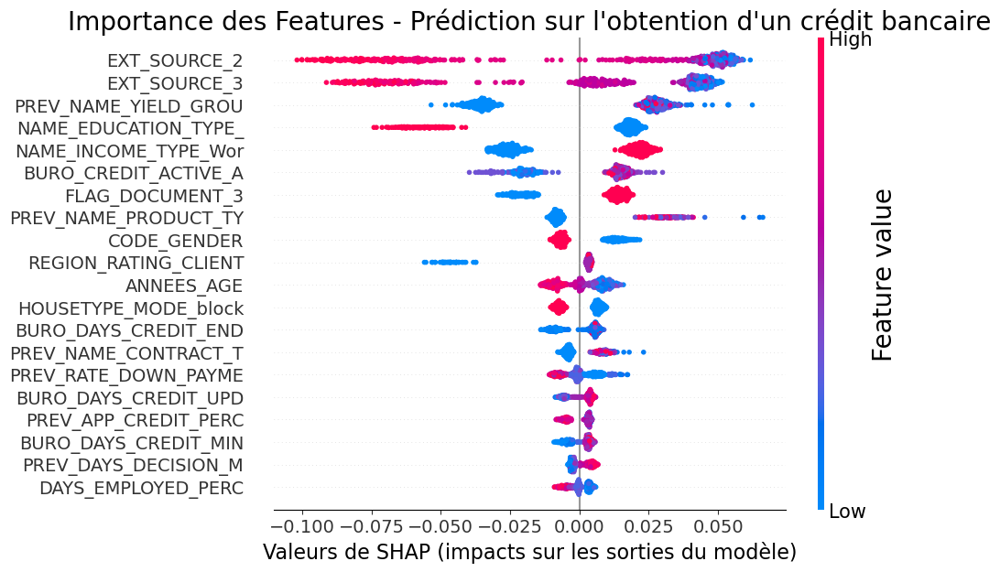

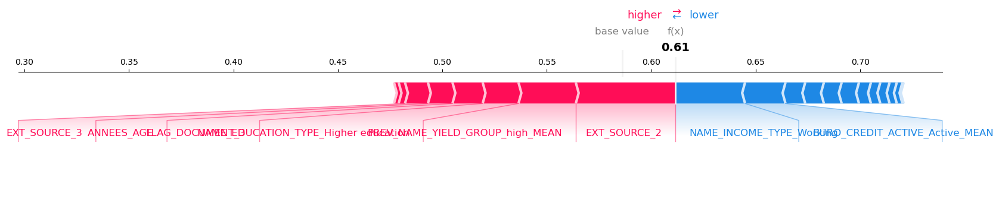

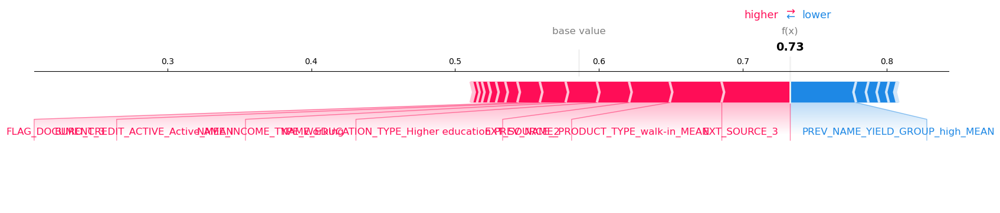

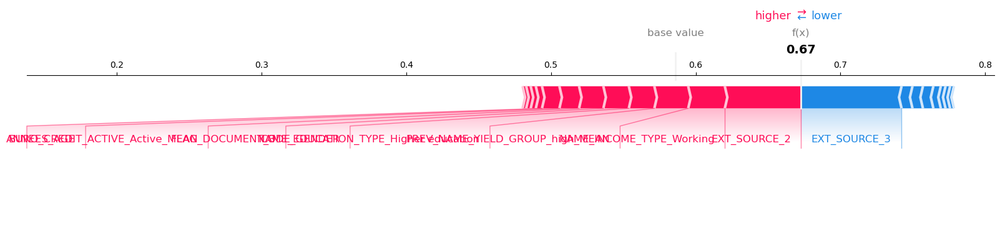

The specified dataset source can be interpreted in multiple ways: LocalArtifactDatasetSource, LocalArtifactDatasetSource. MLflow will assume that this is a LocalArtifactDatasetSource source.
Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.


In [108]:
# On recherche les meilleurs hyperparamètres
param_grid_search = {
                     "imputer" : [SimpleImputer(strategy='median')],
                     "scaler" : [StandardScaler()],
                     "feature_selection__k" : k_selection, #(3 pendant le debug)
                     "sampler" : [None, SMOTE()],
                     "model__n_estimators" : [100, 1000], 
                     "model__max_depth" : [5, 7, 9]}

# On instancie le modèle
rfc = RandomForestClassifier(n_jobs = -1, random_state = 42)

# On ajoute en plus du nom du classifier
name = "RandomForestClassifier"

# On commence l'enregistrement mlflow 
with mlflow.start_run(run_name=name) as run:
    
    # On récupère les résultats après application de la fonction search_model_params
    results, model = search_model_params(name, rfc, param_grid_search, xtrain, ytrain, xtest, ytest, selected_cols, "DecisionTree")
    
    # On catalogue le dataset utilisé, les paramètres grids, les métriques produites et le modèle retenu      
    log_mlflow(param_grid_search, data, dataset_name, results, model)

# On ajoute à la liste de résultats des modèles
resultats_models.append([name] + list(results.values()))

### <a name = "T3C5">e. Naives Bayes Classifier</a>

Nous testons 40 hyperparamètres
Fitting 3 folds for each of 40 candidates, totalling 120 fits
Cross-validation score : 0.38 avec un écart-type de 0.00 




____________________________________________________________________________________________________
Meilleurs paramètres : {'feature_selection__k': 40, 'imputer': SimpleImputer(strategy='median'), 'model__var_smoothing': 2.0, 'sampler': SMOTE(), 'scaler': StandardScaler()}
Temps de recherche des meilleurs paramètres : 480.3
Temps d'exécution : 13.2
____________________
Résultats sur échantillons d'entraînement :
Score performance : nan %
Erreur : 36.00 %
ROC_AUC : 0.71
Fbeta-Score : 0.38 
____________________
Résultats sur échantillons de test :
Score performance : nan %
Erreur : 35.74 %
ROC_AUC : 0.71
Precision moyenne : 0.55 
Recall moyen : 0.66 
F1-Score moyen : 0.50 
Fbeta-Score : 0.38 
____________________________________________________________________________________________________



              precision    recall  f1-s

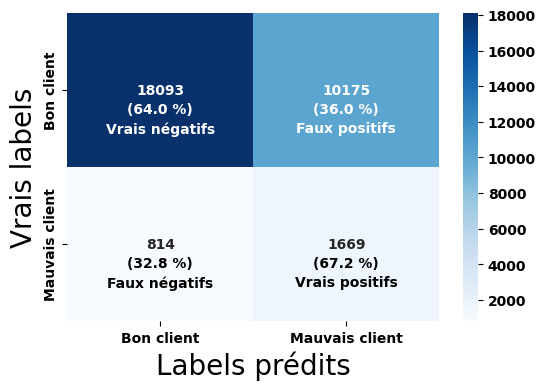

The specified dataset source can be interpreted in multiple ways: LocalArtifactDatasetSource, LocalArtifactDatasetSource. MLflow will assume that this is a LocalArtifactDatasetSource source.
Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.


In [109]:
# On recherche les meilleurs hyperparamètres
param_grid_search = {
                     "imputer" : [SimpleImputer(strategy='median')],
                     "feature_selection__k" : k_selection, 
                     "scaler" : [StandardScaler()],
                     "sampler" : [None, SMOTE()],# SMOTEENN()],
                     "model__var_smoothing" : np.linspace(0.1, 2.0, 10)}

# On instancie le modèle
modele_NB = GaussianNB()

# On ajoute en plus du nom du classifier
name = "NaivesBayesClassifier"

# On commence l'enregistrement mlflow 
with mlflow.start_run(run_name=name) as run:
    
    # On récupère les résultats après application de la fonction search_model_params
    results, model = search_model_params(name, modele_NB, param_grid_search, xtrain, ytrain, xtest, ytest, selected_cols)
    
   # On catalogue le dataset utilisé, les paramètres grids, les métriques produites et le modèle retenu    
    log_mlflow(param_grid_search, data, dataset_name, results, model)

# On ajoute à la liste de résultats des modèles
resultats_models.append([name] + list(results.values()))

### <a name = "T3C6">f. LogisticRegression</a>

Nous testons 32 hyperparamètres
Fitting 3 folds for each of 32 candidates, totalling 96 fits
Cross-validation score : 0.40 avec un écart-type de 0.00 




____________________________________________________________________________________________________
Meilleurs paramètres : {'feature_selection__k': 60, 'imputer': SimpleImputer(strategy='median'), 'model__C': 0.1, 'model__class_weight': {0: 0.1, 1: 0.9}, 'model__max_iter': 100, 'sampler': None, 'scaler': StandardScaler()}
Temps de recherche des meilleurs paramètres : 525.8
Temps d'exécution : 15.9
____________________
Résultats sur échantillons d'entraînement :
Score performance : nan %
Erreur : 24.29 %
ROC_AUC : 0.75
Fbeta-Score : 0.40 
____________________
Résultats sur échantillons de test :
Score performance : nan %
Erreur : 24.46 %
ROC_AUC : 0.74
Precision moyenne : 0.56 
Recall moyen : 0.66 
F1-Score moyen : 0.56 
Fbeta-Score : 0.39 
______________________________________________________________________________________________

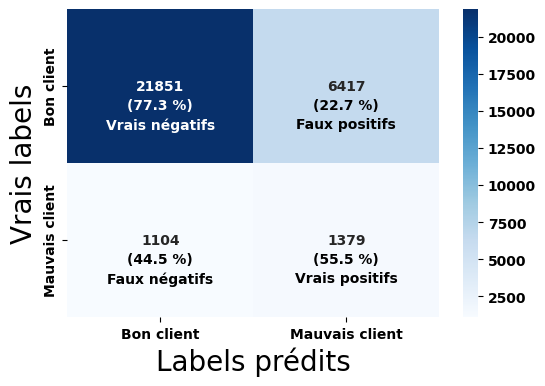

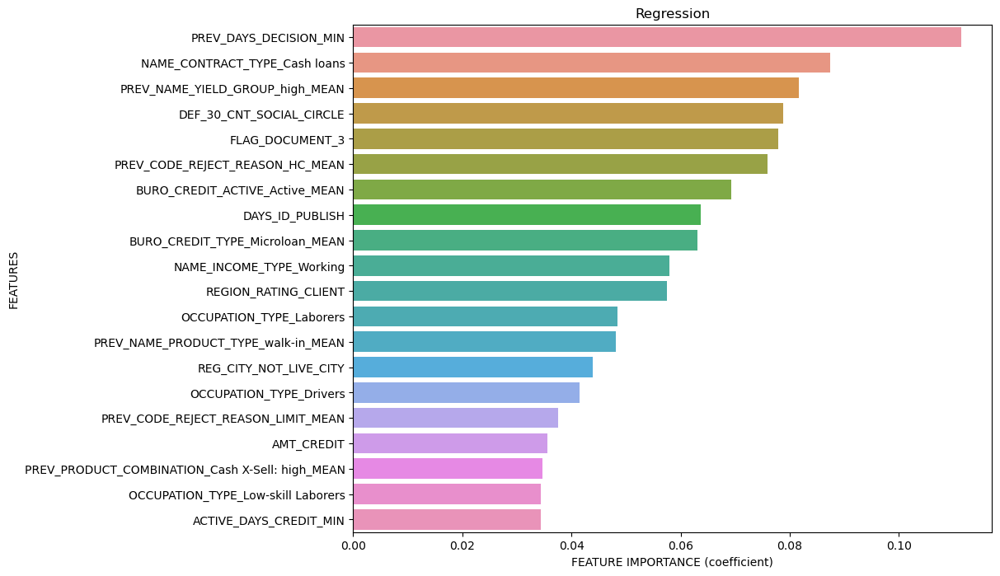

Utilisation de SHAP pour une explication indépendante des modèles
En quoi les variables contribue à un défaut de paiement :


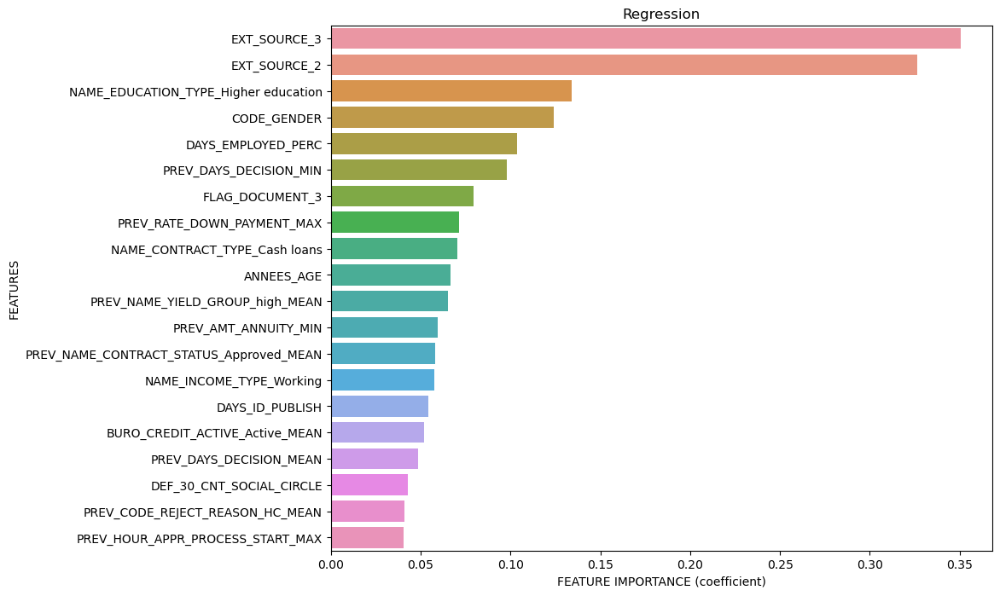

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


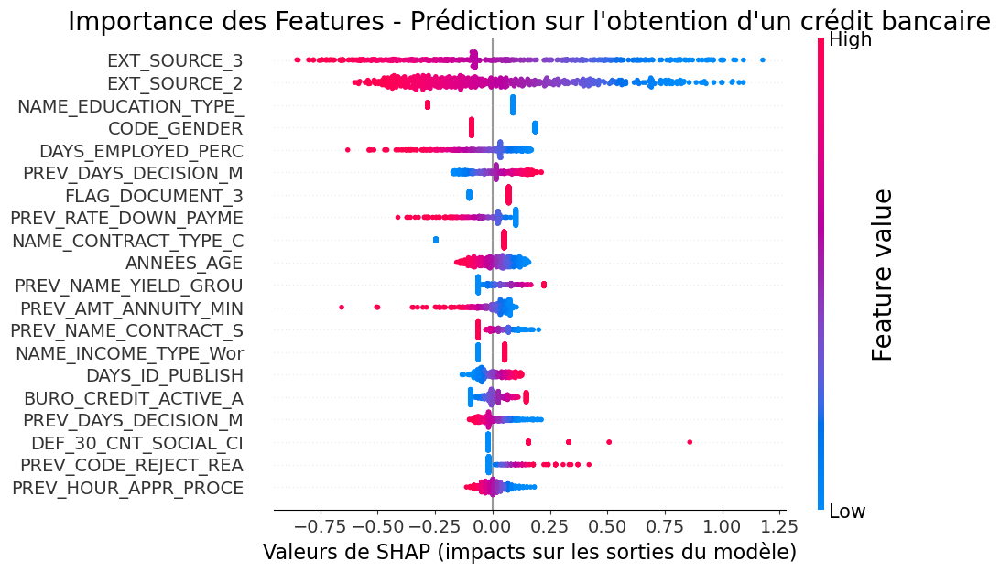

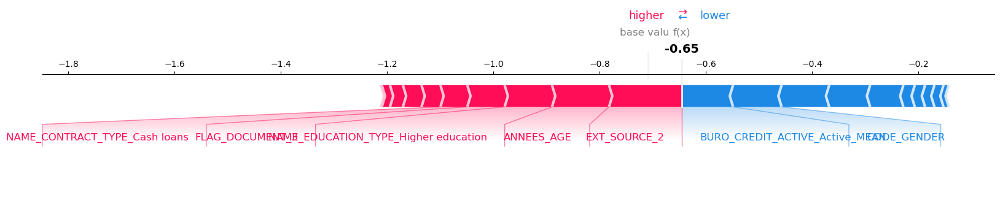

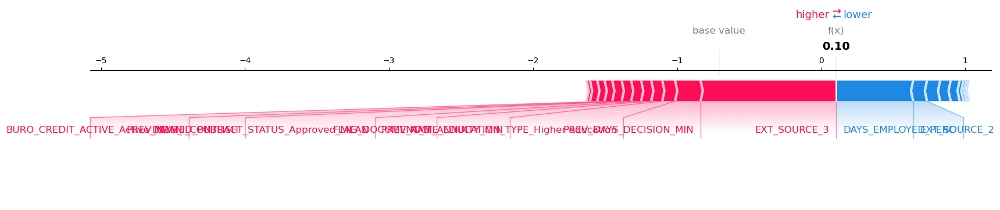

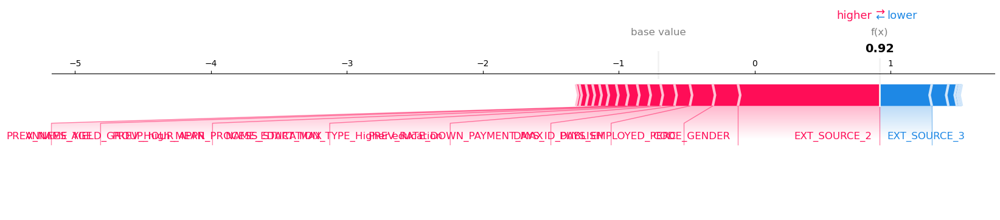

The specified dataset source can be interpreted in multiple ways: LocalArtifactDatasetSource, LocalArtifactDatasetSource. MLflow will assume that this is a LocalArtifactDatasetSource source.
Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.


In [110]:
# On recherche les meilleurs hyperparamètres
param_grid_search = {
                     "imputer" : [SimpleImputer(strategy='median')],
                     "feature_selection__k" : k_selection, 
                     "scaler" : [StandardScaler()],
                     "sampler" : [None, SMOTE()],# SMOTEENN()],
                     "model__class_weight" : [None, {0:.1, 1:.9}], 
                     "model__C" : [0.1, 1],
                     "model__max_iter" : [100, 1000]}

# On instancie le modèle
modele_LR = LogisticRegression(n_jobs = -1, random_state = 42)

# On ajoute en plus du nom du classifier
name = "LogisticRegression"

# On commence l'enregistrement mlflow 
with mlflow.start_run(run_name=name) as run:
    
    # On récupère les résultats après application de la fonction search_model_params
    results, model = search_model_params(name, modele_LR, param_grid_search, xtrain, ytrain, xtest, ytest, selected_cols, "Regression")
    
   # On catalogue le dataset utilisé, les paramètres grids, les métriques produites et le modèle retenu    
    log_mlflow(param_grid_search, data, dataset_name, results, model)

# On ajoute à la liste de résultats des modèles
resultats_models.append([name] + list(results.values()))

### <a name = "T3C7">g. SGDClassifier</a>

Nous testons 32 hyperparamètres
Fitting 3 folds for each of 32 candidates, totalling 96 fits
Cross-validation score : 0.40 avec un écart-type de 0.00 




____________________________________________________________________________________________________
Meilleurs paramètres : {'feature_selection__k': 40, 'imputer': SimpleImputer(strategy='median'), 'model__alpha': 0.001, 'model__max_iter': 200, 'model__penalty': 'l1', 'sampler': SMOTE(), 'scaler': StandardScaler()}
Temps de recherche des meilleurs paramètres : 447.4
Temps d'exécution : 15.2
____________________
Résultats sur échantillons d'entraînement :
Score performance : nan %
Erreur : 30.89 %
ROC_AUC : 0.74
Fbeta-Score : 0.40 
____________________
Résultats sur échantillons de test :
Score performance : nan %
Erreur : 30.58 %
ROC_AUC : 0.73
Precision moyenne : 0.56 
Recall moyen : 0.67 
F1-Score moyen : 0.53 
Fbeta-Score : 0.40 
____________________________________________________________________________________________________



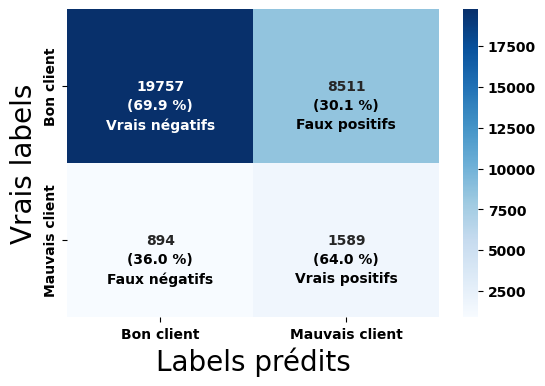

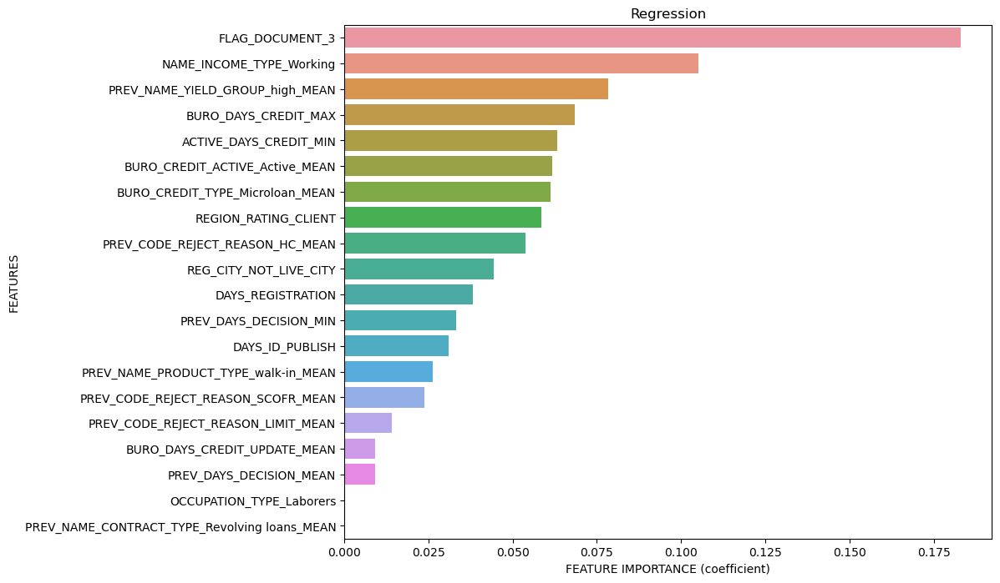

Utilisation de SHAP pour une explication indépendante des modèles
En quoi les variables contribue à un défaut de paiement :


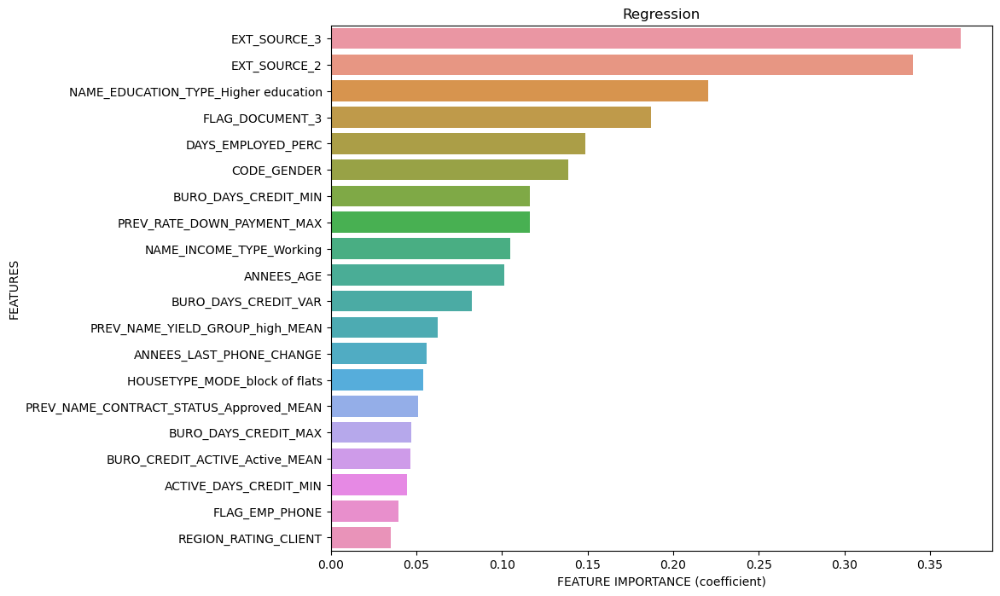

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


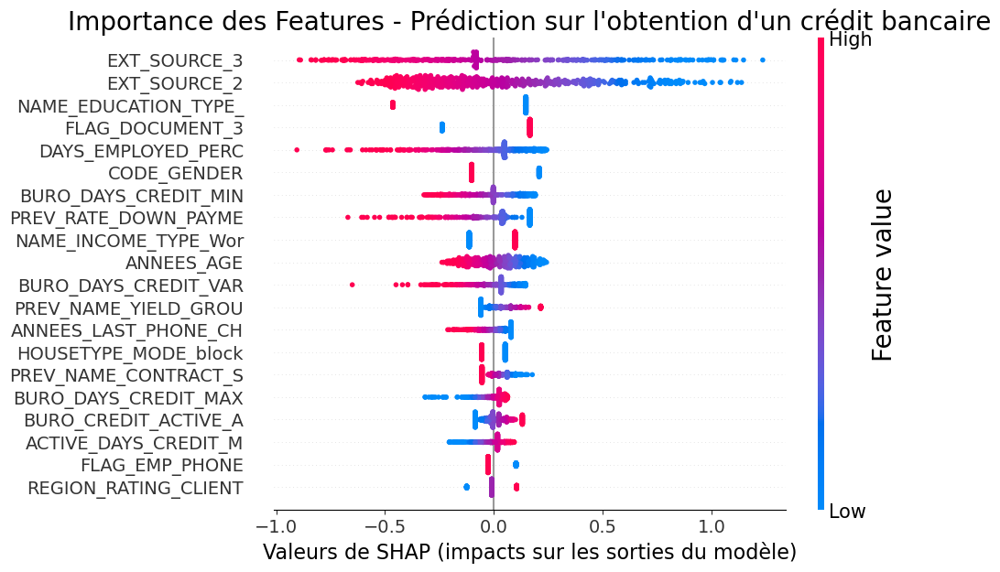

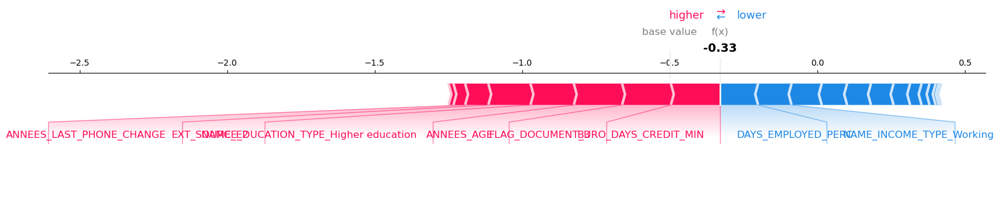

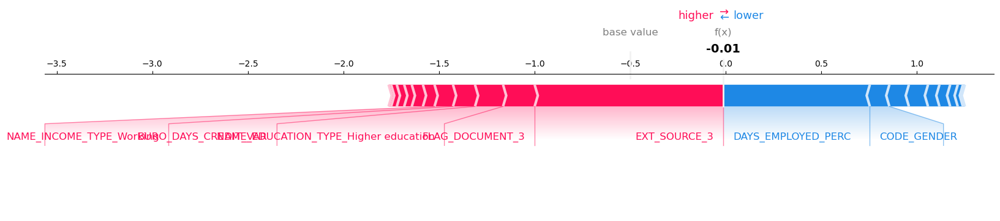

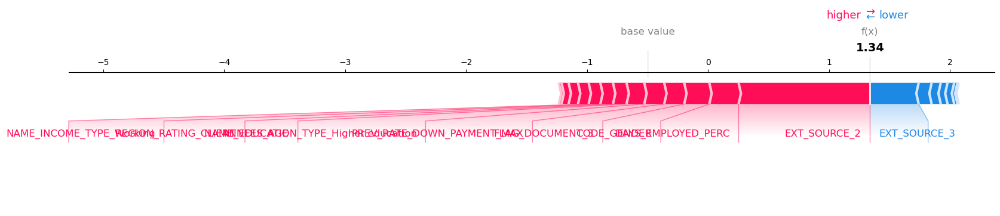

The specified dataset source can be interpreted in multiple ways: LocalArtifactDatasetSource, LocalArtifactDatasetSource. MLflow will assume that this is a LocalArtifactDatasetSource source.
Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.


In [111]:
# On recherche les meilleurs hyperparamètres
param_grid_search = {
                     "imputer" : [SimpleImputer(strategy="median")],# SimpleImputer(strategy="mean")],
                     "feature_selection__k" : k_selection, 
                     "scaler" : [StandardScaler()],
                     "sampler" : [None, SMOTE()],
                     "model__alpha": [0.0001, 0.001],
                     "model__penalty": ["l1", "l2"],
                     "model__max_iter": [200, 1000], 
                     }

# On instancie le modèle
modele_SVC = SGDClassifier(loss="log", early_stopping = True, n_jobs = -1, random_state = 42)

# On ajoute en plus du nom du classifier
name = "SGDClassifier"

# On commence l"enregistrement mlflow 
with mlflow.start_run(run_name=name) as run:
    
    # On récupère les résultats après application de la fonction search_model_params
    results, model = search_model_params(name, modele_SVC, param_grid_search, xtrain, ytrain, xtest, ytest, selected_cols, "Regression")
    
   # On catalogue le dataset utilisé, les paramètres grids, les métriques produites et le modèle retenu      
    log_mlflow(param_grid_search, data, dataset_name, results, model)

# On ajoute à la liste de résultats des modèles
resultats_models.append([name] + list(results.values()))

### <a name = "T3C8">h. GradientBoostingClassifier</a>

Aucun hyperparamètres de tester, trop lent sinon. Juste ajouté au test pour avoir une idée.

Nous testons 1 hyperparamètres
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Cross-validation score : 0.26 avec un écart-type de 0.01 




____________________________________________________________________________________________________
Meilleurs paramètres : {'scaler': StandardScaler(), 'sampler': SMOTE(), 'model__n_estimators': 100, 'model__min_samples_split': 2, 'model__max_depth': 3, 'model__learning_rate': 0.1, 'imputer': SimpleImputer(strategy='median'), 'feature_selection__k': 40}
Temps de recherche des meilleurs paramètres : 1285.7
Temps d'exécution : 830.9
____________________
Résultats sur échantillons d'entraînement :
Score performance : nan %
Erreur : 15.82 %
ROC_AUC : 0.71
Fbeta-Score : 0.28 
____________________
Résultats sur échantillons de test :
Score performance : nan %
Erreur : 15.98 %
ROC_AUC : 0.7
Precision moyenne : 0.56 
Recall moyen : 0.59 
F1-Score moyen : 0.57 
Fbeta-Score : 0.26 
________________________________________________________________

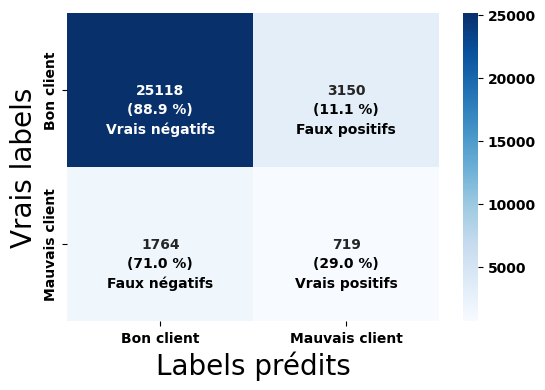

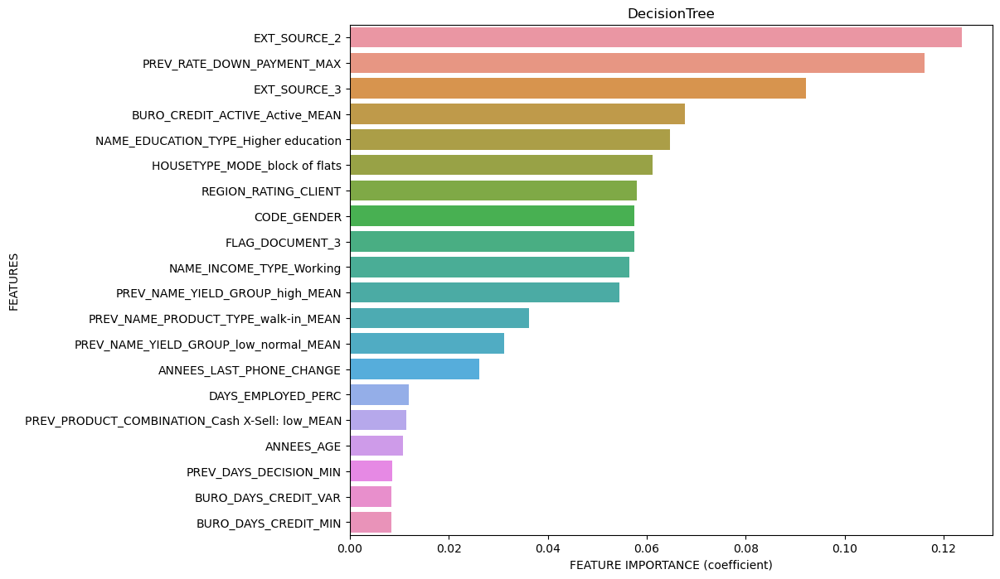

Utilisation de SHAP pour une explication indépendante des modèles
En quoi les variables contribue à un défaut de paiement :


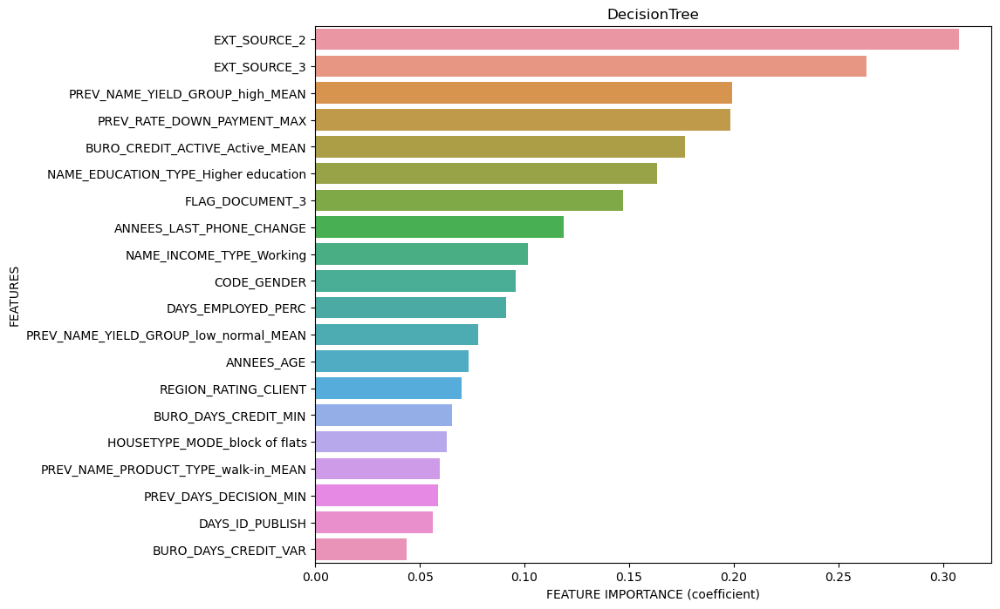

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


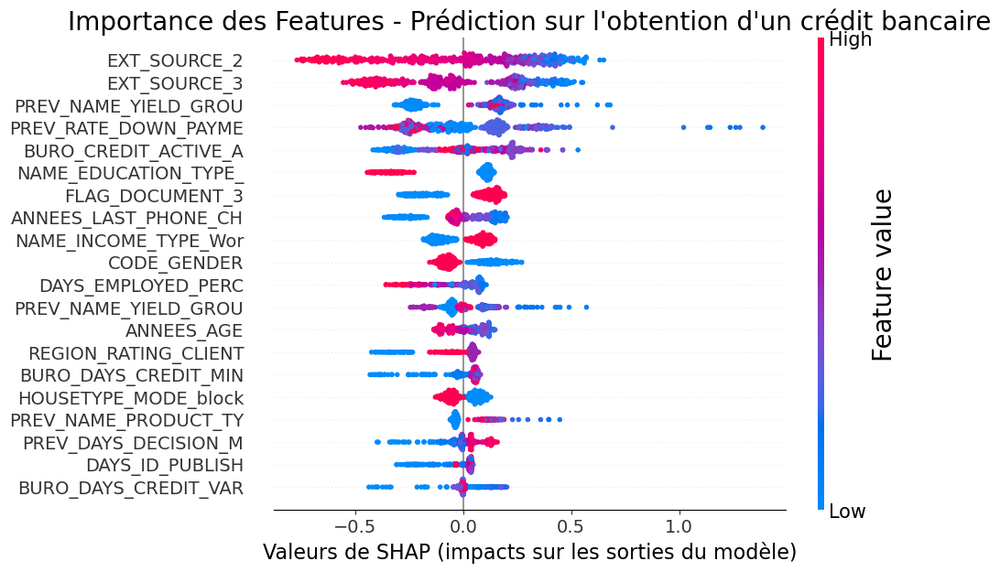

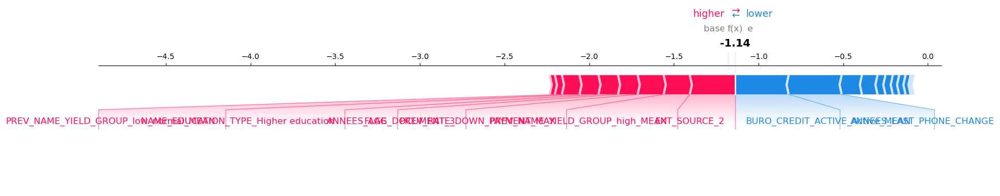

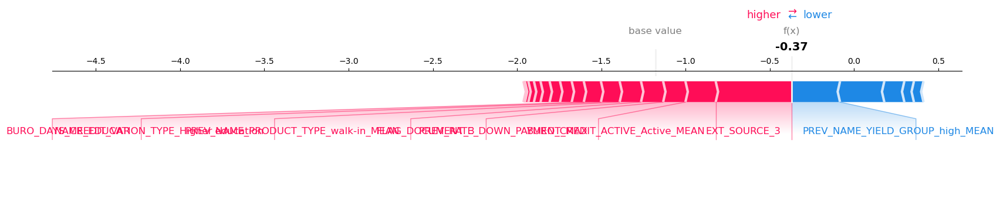

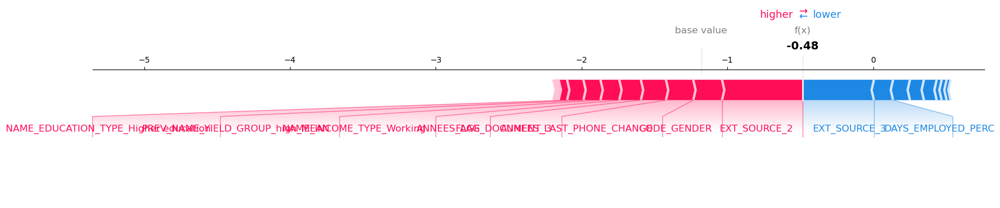

The specified dataset source can be interpreted in multiple ways: LocalArtifactDatasetSource, LocalArtifactDatasetSource. MLflow will assume that this is a LocalArtifactDatasetSource source.
Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.


In [112]:
# On recherche les meilleurs hyperparamètres
param_grid_search = {
                     "imputer" : [SimpleImputer(strategy='median')],
                     "feature_selection__k" : [40], 
                     "scaler" : [StandardScaler()],
                     "sampler" : [SMOTE()],
                     'model__n_estimators': [100],
                     'model__max_depth': [3],
                     'model__min_samples_split': [2],
                     'model__learning_rate' : [0.1, 1]}

# On instancie le modèle
modele_GB = GradientBoostingClassifier(random_state = 42)

# On ajoute en plus du nom du classifier
name = "GradientBoostingClassifier"

# On commence l'enregistrement mlflow 
with mlflow.start_run(run_name=name) as run:

    # On récupère les résultats après application de la fonction search_model_params
    results, model = search_model_params(name, modele_GB, param_grid_search, xtrain, ytrain, xtest, ytest, selected_cols, "DecisionTree")
    
    # On catalogue le dataset utilisé, les paramètres grids, les métriques produites et le modèle retenu   
    log_mlflow(param_grid_search, data, dataset_name, results, model)

# On ajoute à la liste de résultats des modèles
resultats_models.append([name] + list(results.values()))

### <a name = "T3C9">i. XGBClassifier</a>

Nous testons 24 hyperparamètres
Fitting 3 folds for each of 24 candidates, totalling 72 fits
Cross-validation score : 0.37 avec un écart-type de 0.00 




____________________________________________________________________________________________________
Meilleurs paramètres : {'scaler': StandardScaler(), 'sampler': SMOTE(), 'model__n_estimators': 100, 'model__max_depth': 3, 'model__eta': 0.01, 'imputer': SimpleImputer(strategy='median'), 'feature_selection__k': 40}
Temps de recherche des meilleurs paramètres : 1464.5
Temps d'exécution : 33.5
____________________
Résultats sur échantillons d'entraînement :
Score performance : nan %
Erreur : 33.03 %
ROC_AUC : 0.7
Fbeta-Score : 0.37 
____________________
Résultats sur échantillons de test :
Score performance : nan %
Erreur : 33.15 %
ROC_AUC : 0.69
Precision moyenne : 0.54 
Recall moyen : 0.63 
F1-Score moyen : 0.51 
Fbeta-Score : 0.35 
____________________________________________________________________________________________________



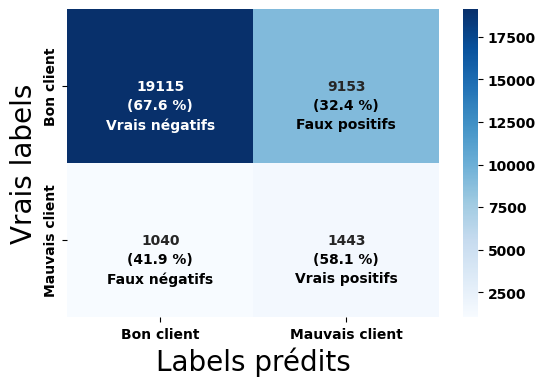

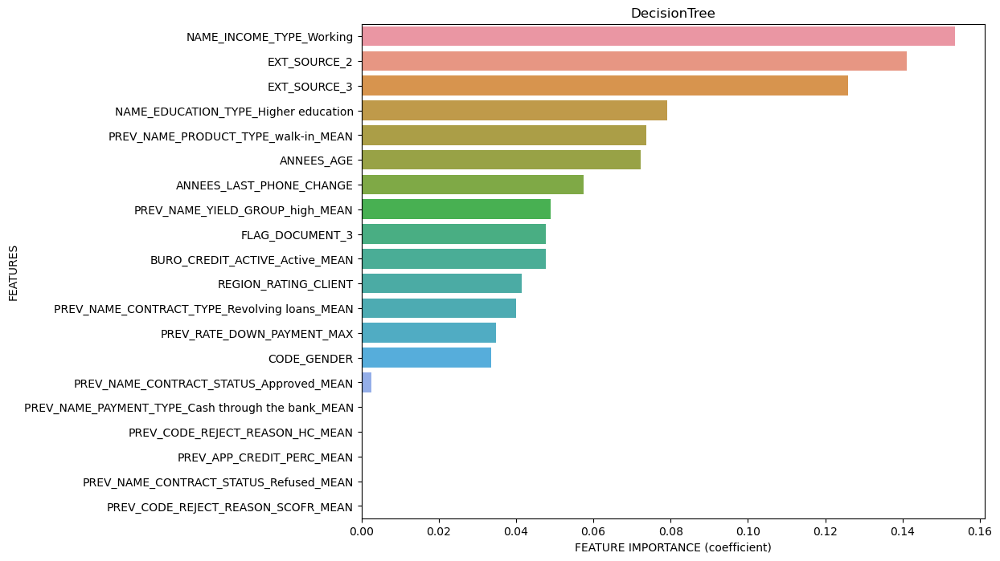

Utilisation de SHAP pour une explication indépendante des modèles
En quoi les variables contribue à un défaut de paiement :


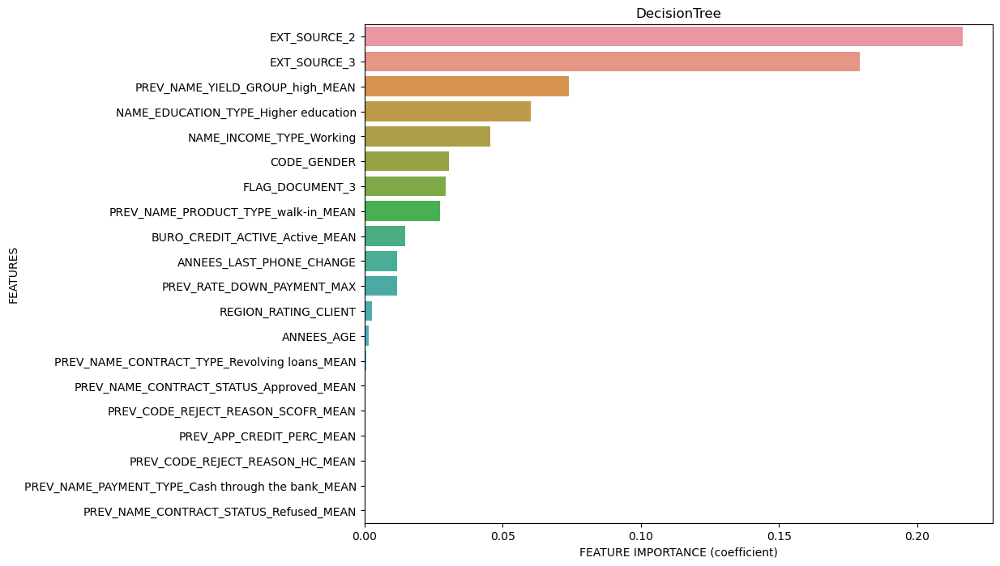

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


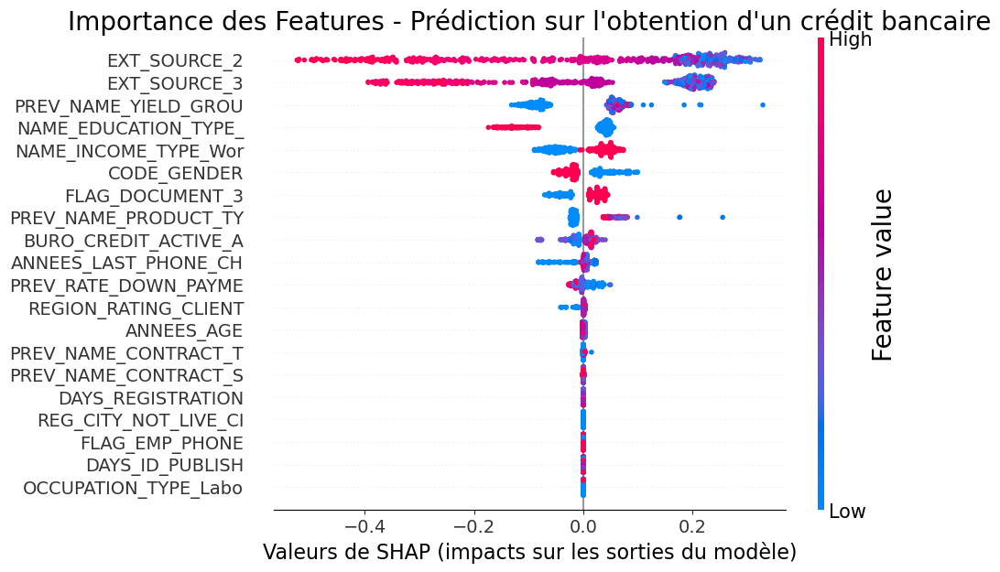

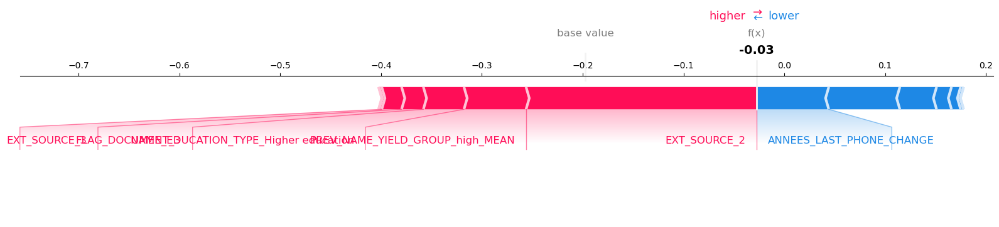

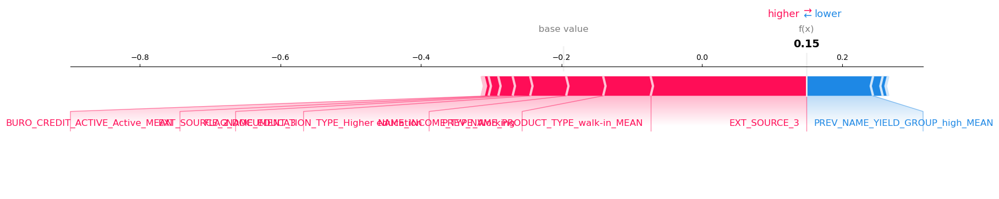

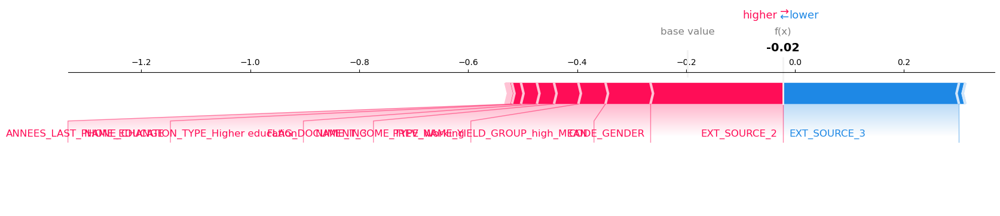

The specified dataset source can be interpreted in multiple ways: LocalArtifactDatasetSource, LocalArtifactDatasetSource. MLflow will assume that this is a LocalArtifactDatasetSource source.
Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.


In [113]:
# On recherche les meilleurs hyperparamètres
param_grid_search = {
                     "imputer" : [SimpleImputer(strategy='median')],
                     "feature_selection__k" : k_selection, #(3 pendant le debug)
                     "scaler" : [StandardScaler()],
                     "sampler" : [None, SMOTE()],
                    'model__n_estimators': [100, 200],
                    'model__max_depth': [3, 7],
                    'model__eta' : [0.01, 0.1]}

# On instancie le modèle
modele_XGB = XGBClassifier(random_state = 42)

# On ajoute en plus du nom du classifier
name = "XGBClassifier"

# On commence l'enregistrement mlflow 
with mlflow.start_run(run_name=name) as run:

    # On récupère les résultats après application de la fonction search_model_params
    results, model = search_model_params(name, modele_XGB, param_grid_search, xtrain, ytrain, xtest, ytest, selected_cols, "DecisionTree")
    
    # On catalogue le dataset utilisé, les paramètres grids, les métriques produites et le modèle retenu  
    log_mlflow(param_grid_search, data, dataset_name, results, model)

# On ajoute à la liste de résultats des modèles
resultats_models.append([name] + list(results.values()))

### <a name = "T3C10">j. LightGBM</a>

Nous testons 36 hyperparamètres
Fitting 3 folds for each of 36 candidates, totalling 108 fits
Cross-validation score : 0.37 avec un écart-type de 0.00 




____________________________________________________________________________________________________
Meilleurs paramètres : {'scaler': StandardScaler(), 'sampler': SMOTE(), 'model__num_leaves': 50, 'model__n_estimators': 100, 'model__max_depth': 3, 'model__learning_rate': 0.01, 'model__boosting_type': 'gbdt', 'imputer': SimpleImputer(strategy='median'), 'feature_selection__k': 40}
Temps de recherche des meilleurs paramètres : 680.6
Temps d'exécution : 16.2
____________________
Résultats sur échantillons d'entraînement :
Score performance : nan %
Erreur : 33.00 %
ROC_AUC : 0.7
Fbeta-Score : 0.37 
____________________
Résultats sur échantillons de test :
Score performance : nan %
Erreur : 33.20 %
ROC_AUC : 0.69
Precision moyenne : 0.54 
Recall moyen : 0.62 
F1-Score moyen : 0.50 
Fbeta-Score : 0.35 
___________________________________

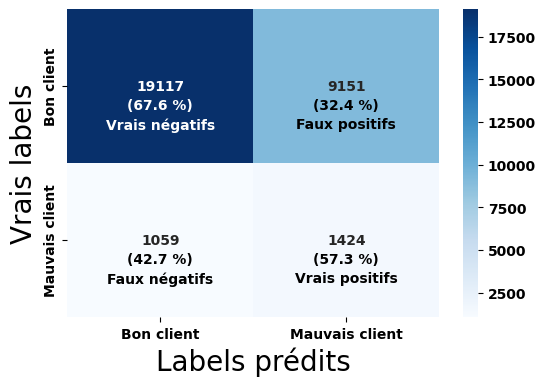

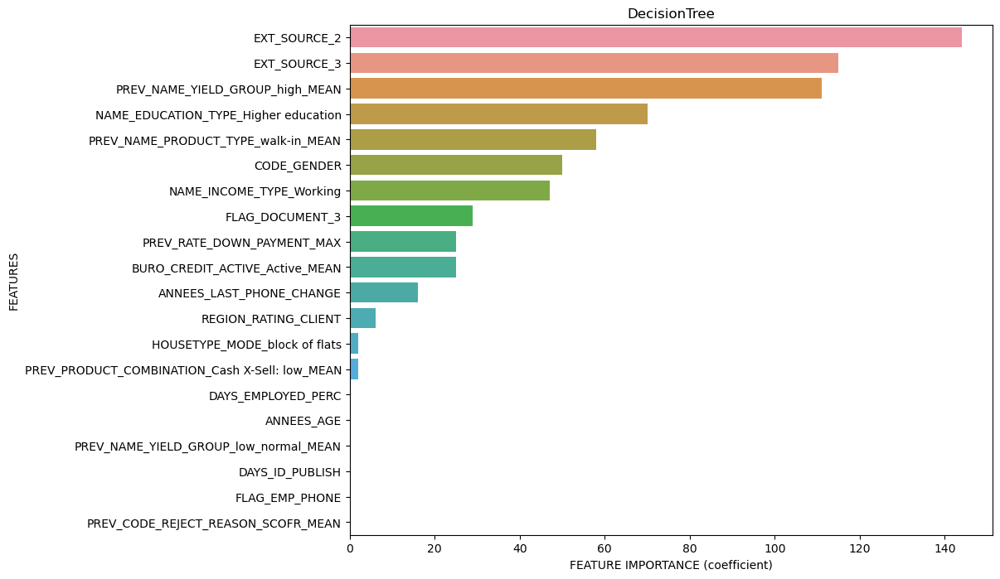

Utilisation de SHAP pour une explication indépendante des modèles
En quoi les variables contribue à un défaut de paiement :


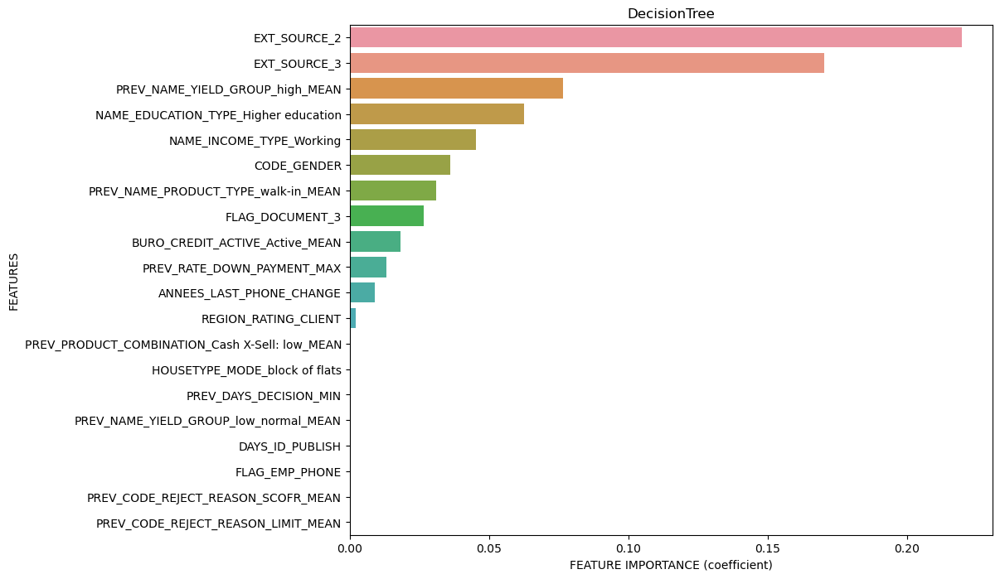

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


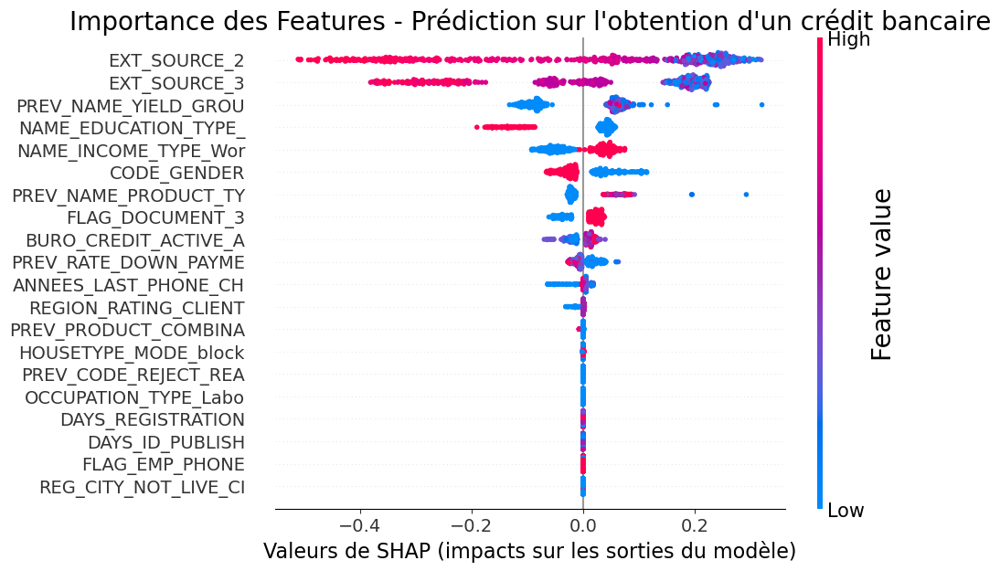

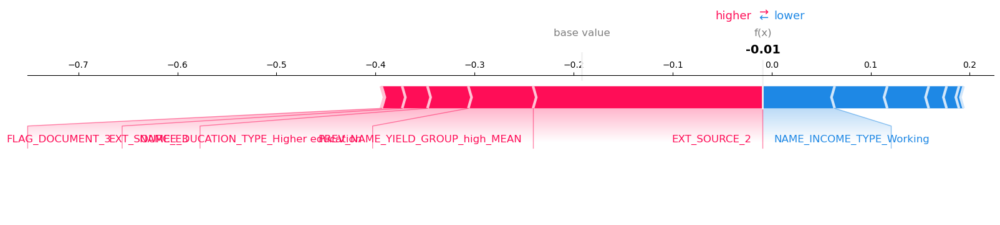

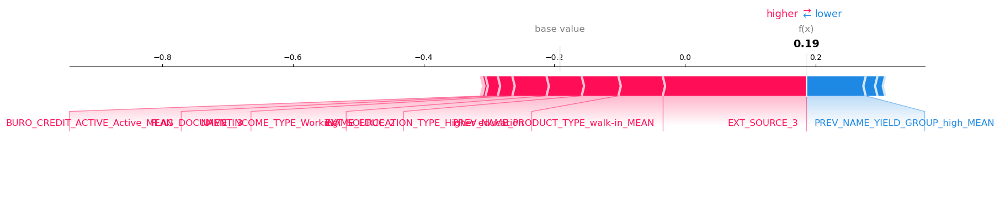

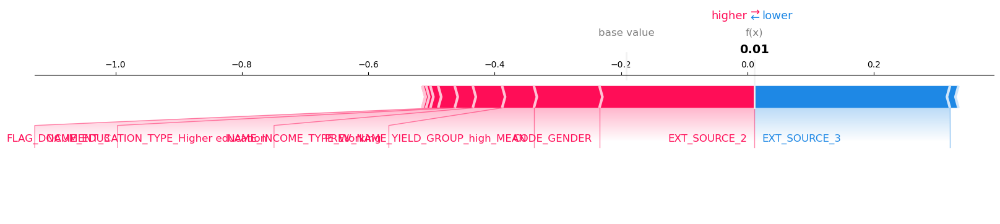

The specified dataset source can be interpreted in multiple ways: LocalArtifactDatasetSource, LocalArtifactDatasetSource. MLflow will assume that this is a LocalArtifactDatasetSource source.
Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.


In [114]:
# On recherche les meilleurs hyperparamètres
param_grid_search = {
                     "imputer" : [SimpleImputer(strategy="median")],
                     "feature_selection__k" : k_selection, 
                     "scaler" : [StandardScaler()],
                     "sampler" : [None, SMOTE()],
                    "model__boosting_type": ["gbdt"],
                    "model__num_leaves": [31, 50],
                    "model__learning_rate": [0.01],
                    "model__n_estimators": [100, 200],
                    "model__max_depth" : [-1, 3, 8]
                    }

# On instancie le modèle
modele_lgbm = LGBMClassifier(verbose=-100,
                             objective = "binary",
                             random_state = 42)

# On ajoute en plus du nom du classifier
name = "LGBMClassifier"

# On commence l"enregistrement mlflow 
with mlflow.start_run(run_name=name) as run:

    # On récupère les résultats après application de la fonction search_model_params
    results, model = search_model_params(name, modele_lgbm, param_grid_search, xtrain, ytrain, xtest, ytest, selected_cols, "DecisionTree")
    
    # On catalogue le dataset utilisé, les paramètres grids, les métriques produites et le modèle retenu  
    log_mlflow(param_grid_search, data, dataset_name, results, model)

# On ajoute à la liste de résultats des modèles
resultats_models.append([name] + list(results.values()))


### <a name = "T3C11">k. Neural Network (Keras) </a>

Besoin de créer de nouvelles fonctions pour tester un réseau de neurones

In [115]:
# Permet de mesurer les scores F1 et Fbeta

class F1Score(tf.keras.metrics.Metric):
    def __init__(self, name='f1_score', **kwargs):
        super(F1Score, self).__init__(name=name, **kwargs)
        self.true_positives = self.add_weight(name='tp', initializer='zeros')
        self.false_positives = self.add_weight(name='fp', initializer='zeros')
        self.false_negatives = self.add_weight(name='fn', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.cast(y_pred, tf.float32)
        true_positives = tf.reduce_sum(y_true * y_pred)
        false_positives = tf.reduce_sum((1 - y_true) * y_pred)
        false_negatives = tf.reduce_sum(y_true * (1 - y_pred))
        self.true_positives.assign_add(true_positives)
        self.false_positives.assign_add(false_positives)
        self.false_negatives.assign_add(false_negatives)

    def result(self):
        precision = self.true_positives / (self.true_positives + self.false_positives + tf.keras.backend.epsilon())
        recall = self.true_positives / (self.true_positives + self.false_negatives + tf.keras.backend.epsilon())
        f1 = 2 * (precision * recall) / (precision + recall + tf.keras.backend.epsilon())
        return f1
    
class FBetaScore(tf.keras.metrics.Metric):
    def __init__(self, name='fbeta_score', beta=1.0, threshold=0.5, **kwargs):
        super(FBetaScore, self).__init__(name=name, **kwargs)
        self.beta = beta
        self.threshold = threshold
        self.true_positives = self.add_weight(name='tp', initializer='zeros')
        self.false_positives = self.add_weight(name='fp', initializer='zeros')
        self.false_negatives = self.add_weight(name='fn', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.cast(y_pred > self.threshold, tf.float32)
        true_positives = tf.reduce_sum(y_true * y_pred)
        false_positives = tf.reduce_sum((1 - y_true) * y_pred)
        false_negatives = tf.reduce_sum(y_true * (1 - y_pred))
        self.true_positives.assign_add(true_positives)
        self.false_positives.assign_add(false_positives)
        self.false_negatives.assign_add(false_negatives)

    def result(self):
        precision = self.true_positives / (self.true_positives + self.false_positives + tf.keras.backend.epsilon())
        recall = self.true_positives / (self.true_positives + self.false_negatives + tf.keras.backend.epsilon())
        beta_squared = self.beta ** 2
        fbeta = (1 + beta_squared) * (precision * recall) / (beta_squared * precision + recall + tf.keras.backend.epsilon())
        return fbeta

In [116]:
# Fonction retournant une liste de callbacks pour la formation du modèle
def callbacks(path, monitor="auc", patienceStop = 5, patienceReducer = 0):

    # On sauvegarde le modèle quand la valeur augmente de validation est augmentée
    checkpoint = ModelCheckpoint(path, monitor=monitor, verbose=0, save_best_only=True, mode='max')

    # Arrête le modèle s'il n'y a pas d'amélioration au bout de x epoches
    es = EarlyStopping(monitor=monitor, mode='max', verbose=0, patience = patienceStop)

    # Réduit le temps d'apprentissage si le modèle ne s'améliore pas
    lr_reducer = ReduceLROnPlateau(monitor=monitor, factor=0.5, patience = patienceReducer, min_lr=1e-8)

    return [checkpoint, es, lr_reducer]

In [117]:
def build_and_compile_model(taille_var, optimizer=Adam(), regularization=None, beta = 2.0, th = 0.7):
    ##
    #    Fonction permettant la création d'un modèle RN avec plusieurs couches
    #    Une couche Dropout est ajoutée entre chaque couche Dense pour limiter l'overfitting
    #    On finit par une couche permettant la classification binaire
    #    On suit un certain nombre de métriques
    ##
    
    model = tf.keras.Sequential([
        Dense(200, input_shape=(taille_var,), activation='relu',
                              kernel_regularizer=regularization),
        Dropout(0.5),
        Dense(100, activation='relu', kernel_regularizer=regularization),
        Dropout(0.5),
        Dense(50, activation='relu', kernel_regularizer=regularization),
        Dropout(0.5),
        Dense(25, activation='relu', kernel_regularizer=regularization),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])

    model.compile(loss='binary_crossentropy',
                  optimizer=optimizer,
                  metrics=[
                            tf.keras.metrics.TruePositives(name='tp'),
                            tf.keras.metrics.FalsePositives(name='fp'),
                            tf.keras.metrics.TrueNegatives(name='tn'),
                            tf.keras.metrics.FalseNegatives(name='fn'), 
                            tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                            tf.keras.metrics.Precision(name='precision'),
                            tf.keras.metrics.Recall(name='recall'),
                            tf.keras.metrics.AUC(name='auc'),
                            tf.keras.metrics.AUC(name='prc', curve='PR'), # precision-recall curve
                            F1Score(name='f1_score'),  
                            FBetaScore(name='fbeta_score', beta=beta, threshold=th)
                        ]
                 )
    return model

In [118]:
def preparation_sample_RN(x_train, y_train, x_test, y_test, x_val, y_val, cols_model, samplingChoice, k, scaler):
    
# Permet de sélectionner les colonnes d'intérêts
    column_selector = SelectColumns(columns=cols_model, ignore_missing=True)
    
    pipe = Pipeline([
                    ('select_columns', column_selector),
                    ('imputer', SimpleImputer(strategy='median')),
                    ('feature_elimination', VarianceThreshold(threshold=0.0)),
                    ('feature_selection', SelectKBest(score_func=f_classif, k = k)),
                    ('scaler', scaler)
                ])
    
    x_pipe_train = pipe.fit_transform(x_train, y_train)
    x_pipe_test = pipe.transform(x_test)
    x_pipe_val = pipe.transform(x_val)
    
    # Pour l'utilisation des scores fbeta et f1 score
    ytrain1 = y_train.astype('float32')
    yval1 = y_val.astype('float32')
    ytest1 = y_test.astype('float32')
    
    xtrain_resampled, ytrain_resampled = resample(x_pipe_train, ytrain1, choice = samplingChoice)
    
    return xtrain_resampled, ytrain_resampled, x_pipe_test, ytest1, x_pipe_val, yval1

In [119]:
def preparation_sample_RN_best_params(x_train, y_train, x_test, k, scaler, cols_model):

    scaler_dict = {"None" : None, "StandardScaler" : StandardScaler()}
    
    # Préparation des données avec les meilleures paramètres
    # Permet de sélectionner les colonnes d'intérêts
    column_selector = SelectColumns(columns=cols_model, ignore_missing=True)
    
    pipe = Pipeline([
                    ('select_columns', column_selector),
                    ('imputer', SimpleImputer(strategy='median')),
                    ('feature_elimination', VarianceThreshold(threshold=0.0)),
                    ('feature_selection', SelectKBest(score_func=f_classif, k = k)),
                    ('scaler', scaler_dict[scaler])
                ])
    
    x_pipe_train = pipe.fit_transform(x_train, y_train)
    x_pipe_test = pipe.transform(x_test)
    
    # On récupère le noms des features
    best_features = pipe.named_steps['feature_selection']
    selected_cols = xtrain.columns[best_features.get_support(indices=True)]
    
    return x_pipe_train, x_pipe_test, selected_cols

On veut donner un poids pour les deux catégories 

In [120]:
# On compte le nombre de chaque
neg, pos = np.bincount(ytrain)
total = neg + pos

poids_classe_0 = round((1 / neg) * (total / 2.0), 1)
poids_classe_1 = round((1 / pos) * (total / 2.0), 1)

poids_classes = {0: poids_classe_0, 1: poids_classe_1}

print("Poids pour la classe 0 : {:.2f}".format(poids_classe_0))
print("Poids pour la classe 1: {:.2f}".format(poids_classe_1))

Poids pour la classe 0 : 0.50
Poids pour la classe 1: 6.20


In [121]:
def best_model_RN(model, parametres, x_test, y_test, best_score):
##
#    Fonction permettant de suivre le meilleur score et de le garder en mémoire
##
    yresult_test = np.round(model.predict(x_test, verbose=0))
                    
    score_test = round(roc_auc_score(y_test, yresult_test), 2)
    
    # Si on améliore le score, on garde les nouveaux meilleurs
    if score_test > best_score:
        
         return parametres, score_test


In [122]:
def log_mlflow_RN(param_grid, df, dataset_name, dict_scores, trained_model, best_params):
    ##
    #    Fonction cataloguant les résultats des différentes métriques obtenus   
    #    Mais également les données utilisées
    ##
    
    ## Amélioration future : Ajout d'un dictionnaire répertoriant les métriques à cataloguer  
    
    # On catalogue les meilleurs hyperparamètres du modèle
    mlflow.log_params({"best_" + key: value for key, value in best_params.items()})
    
    # On catalogue le dataset utilisé
    dataset = mlflow.data.from_pandas(df, source="fichiers/concatenate_files.csv")

    mlflow.log_input(dataset, context=dataset_name)
    
    # On catalogue les métriques (on parcours le dictionnaire)
    for key, value in dict_scores.items():
        mlflow.log_metric(str(key), value)
    
    # On catalogue le modèle
    log_model(trained_model, "Modèle entrainé")

In [123]:
def search_RNmodel_params(model_name, param_grid, x_train, y_train, x_test, y_test, x_val, y_val, cols_model, poids_classes):
    scores = {}
    best_auc_score = 0
    
    # Pour conserver les meilleurs poids du modèle
    best_model_save_path = "./best_model_weights.h5"

    sampling_dict = {0 : "None", 1 : "SMOTE", 2 : "Poids"}
    
    # On calcul le nombre d'hyperparamètres
    total_hp = np.prod([len(param_grid[keys]) for keys in param_grid.keys()])

    print("Nombre d'hyperparamètres testés :", total_hp)

    suivi = 1

    time0 = time.time()

    # Recherche des meilleurs hyperparamètres
    for choice in param_grid["sampling_choice"]:
        if choice == 3 :
            weight = poids_classes
            print("Poids :", weight)
        else :
            weight = None

        for k in param_grid["k_selection"]:
            # Préparation des données
    
            for nrm, nrm_name in zip(param_grid["normalizer_param"], ["None", "StandardScaler"]):
                # On prépare les données
                x_train1, y_train1, xtest1, ytest1, xval1, yval1 = (
                    preparation_sample_RN(x_train, y_train, x_test, y_test, x_val, y_val, cols_model, choice, k, nrm))

                for reg, reg_name in zip(param_grid["regularization"], ["None", "L2"]):
                    # On test différents régularisateurs

                    for b_s in param_grid["batch_size"]:
                        # On teste différentes tailles de batch_size

                        # Pour suivre la progression
                        print("%d %%" %(suivi/total_hp*100))

                        model_save_path = "./model_weights.h5"

                        # On utilise le beta_score pour que le modèle s'entraîne
                        callbacks_list = callbacks(model_save_path, monitor="fbeta_score") 

                        model = build_and_compile_model(x_train1.shape[1], Adam(), reg)

                        history = model.fit(x_train1, 
                                            y_train1,
                                            validation_data=(xval1, yval1),
                                            callbacks=callbacks_list,
                                            epochs=50,
                                            batch_size=b_s,
                                            verbose=0,
                                            class_weight=weight)

                        params = [sampling_dict[choice], nrm_name, k, reg_name, b_s]

                        result = best_model_RN(model, params, xtest1, ytest1, best_auc_score)
                        # Si on a un meilleur score, on enregistre
                        if result:
                            best_params, best_auc_score = result
                            # On enregistre les poids du meilleur modèle
                            model.save_weights(best_model_save_path)
                        
                        suivi += 1
    
    # Préparation des données avec les meilleures paramètres
    x_pipe_train, x_pipe_test, feats = (
        preparation_sample_RN_best_params(x_train, y_train, x_test, best_params[2], best_params[1], cols_model))
    
    # on régènere le modèle                    
    reg_dict = {"None" : None, "L2" : l2(0.01)}
    best_model = build_and_compile_model(x_pipe_train.shape[1], Adam(), reg_dict[reg_name])
    best_model.load_weights(best_model_save_path)
    
    time1 = time.time()

    # On mesure le temps d'entrainement
    scores["training_time"] = round(time1 - time0, 1)                    

    # On mesure les différentes métriques et on ajoute au dictionnaire
    scores.update(calcul_scores(best_model, x_pipe_train, y_train1, x_pipe_test, ytest1, beta = 2, proba = True))

    # On mesure le temps d'application du meilleur modèle
    scores["elapsed_time"] = round(time.time() - time1, 1)            

    affichage_score(best_params, scores)

     # On affiche la matrice de confusion
    results_prediction(ytest1, np.round(best_model.predict(x_pipe_test, verbose = 0)))
    
    # On affiche l'importance des features obtenus avec SHAP
    coefficients_importance_by_shape(best_model, model_name, x_pipe_train, y_train1, feats, 3)
    
    best_params = {key: value for key, value in zip(param_grid.keys(), best_params)}
    
    # On retourne les différentes métriques et le meilleur modèle
    return scores, best_model, best_params

Nombre d'hyperparamètres testés : 12
8 %


You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


16 %


You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


25 %


You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


33 %


You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


Ancienne distribution : Counter({0.0: 226145, 1.0: 19859})
Nouvelle distribution : Counter({0: 226145, 1: 226145})
41 %


You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


50 %


You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


Ancienne distribution : Counter({0.0: 226145, 1.0: 19859})
Nouvelle distribution : Counter({0: 226145, 1: 226145})
58 %


You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


66 %


You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


Ancienne distribution : Counter({0.0: 226145, 1.0: 19859})
Nouvelle distribution : Counter({0.0: 226145, 1.0: 19859})
75 %


You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


83 %


You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


Ancienne distribution : Counter({0.0: 226145, 1.0: 19859})
Nouvelle distribution : Counter({0.0: 226145, 1.0: 19859})
91 %


You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


100 %


You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.





____________________________________________________________________________________________________
Meilleurs paramètres : ['SMOTE', 'None', 40, 'None', 20]
Temps de recherche des meilleurs paramètres : 3150.5
Temps d'exécution : 11.3
____________________
Résultats sur échantillons d'entraînement :
Score performance : nan %
Erreur : 8.07 %
ROC_AUC : 0.5
Fbeta-Score : 0.00 
____________________
Résultats sur échantillons de test :
Score performance : nan %
Erreur : 8.07 %
ROC_AUC : 0.5
Precision moyenne : 0.46 
Recall moyen : 0.50 
F1-Score moyen : 0.48 
Fbeta-Score : 0.00 
____________________________________________________________________________________________________



              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     28268
         1.0       0.00      0.00      0.00      2483

    accuracy                           0.92     30751
   macro avg       0.46      0.50      0.48     30751
weighted avg       0.85      0.92      0

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


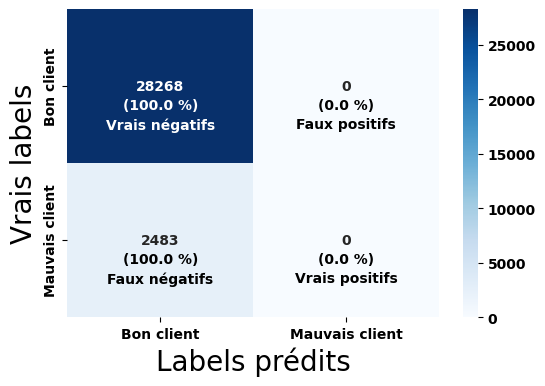

Permutation explainer: 501it [00:56,  7.92it/s]                                                                        


Utilisation de SHAP pour une explication indépendante des modèles
En quoi les variables contribue à un défaut de paiement :


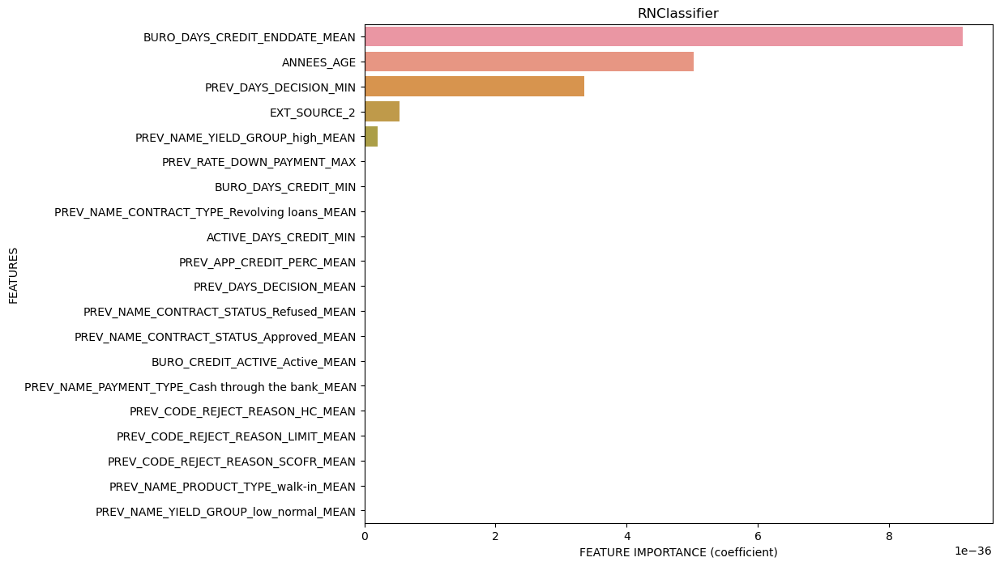

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


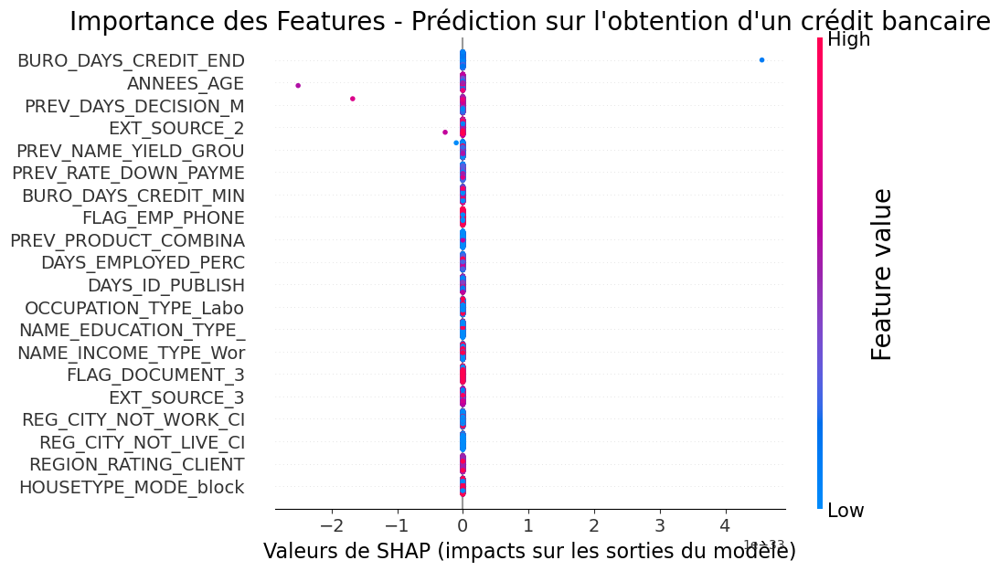

The specified dataset source can be interpreted in multiple ways: LocalArtifactDatasetSource, LocalArtifactDatasetSource. MLflow will assume that this is a LocalArtifactDatasetSource source.
Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
2023/09/14 07:12:10 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\33664\AppData\

In [124]:
# On recherche les meilleurs hyperparamètres
param_grid_search = {
    "sampling_choice" : [0, 1, 2],
    "k_selection" : [40, 60],
    "normalizer_param" : [StandardScaler()],
    "regularization" : [l2(0.01)],
    "batch_size" : [20, 50]
}

name = "RNClassifier"

# On commence l"enregistrement mlflow 
with mlflow.start_run(run_name=name) as run:

    # On récupère les résultats après application de la fonction search_model_params
    results, model, best_params = search_RNmodel_params(name, param_grid_search, xtrain, ytrain, xtest, ytest, xval, yval, selected_cols, poids_classes)
    
    # On catalogue le dataset utilisé, les paramètres grids, les métriques produites et le modèle retenu  
    log_mlflow_RN(param_grid_search, data, dataset_name, results, model, best_params)

# On ajoute à la liste de résultats des modèles
resultats_models.append([name] + list(results.values()))


***
# <a name="T4">Sélection du meilleur modèle</a>
### <a name = "T4C1">a. Résultats des modélisations</a>

In [125]:
resultats_models_df = pd.DataFrame(resultats_models, columns = ["modèles"] + list(results.keys()))
resultats_models_df

,modèles,training_time,score_performance_train,score_performance_test,roc_auc_train,roc_auc_test,errors_train,errors_test,f_beta_train,f_beta_test,precision_mean,recall_mean,f1_mean,elapsed_time
0,DummyClassifier,25.7,NaN,NaN,0.50,0.50,8.07,8.07,0.00,0.00,0.46,0.50,0.48,10.9
1,KNeighborsClassifier,1537.3,NaN,NaN,0.92,0.65,44.30,49.46,0.47,0.34,0.53,0.61,0.42,280.5
2,RandomForestClassifier,3889.3,NaN,NaN,0.71,0.70,28.75,28.77,0.37,0.36,0.55,0.64,0.53,427.7
3,NaivesBayesClassifier,480.3,NaN,NaN,0.71,0.71,36.00,35.74,0.38,0.38,0.55,0.66,0.50,13.2
4,LogisticRegression,525.8,NaN,NaN,0.75,0.74,24.29,24.46,0.40,0.39,0.56,0.66,0.56,15.9
5,SGDClassifier,447.4,NaN,NaN,0.74,0.73,30.89,30.58,0.40,0.40,0.56,0.67,0.53,15.2
6,GradientBoostingClassifier,1285.7,NaN,NaN,0.71,0.70,15.82,15.98,0.28,0.26,0.56,0.59,0.57,830.9
7,XGBClassifier,1464.5,NaN,NaN,0.70,0.69,33.03,33.15,0.37,0.35,0.54,0.63,0.51,33.5
8,LGBMClassifier,680.6,NaN,NaN,0.70,0.69,33.00,33.20,0.37,0.35,0.54,0.62,0.50,16.2
9,RNClassifier,3150.5,NaN,NaN,0.50,0.50,8.07,8.07,0.00,0.00,0.46,0.50,0.48,11.3


Pour comparer les modèles, on va s'intéresser à quelques unes des métriques préservées : 

- **Temps d'entraînement et pour la prédiction**

Pour l'optimisation plus fine du modèle sélectionné, on voudrait tester plus d'hyper paramètres, ont veut donc éviter de gonfler le temps de recherche des paramètres. Pour la prédiction, on veut éviter qu'il soit trop long.

- **ROC auc (train/test)**

On veut des scores assez proches entre les deux (pas d'overfitting/underfitting) et un score élevé nous permet d'estimer une bonne prédiction 

- **Recall moyen**

On veut un recall moyen le plus haut possible, métrique nous donnant une idée de la bonne affiliation.

### <a name = "T4C2">b. Résultats des modélisations : Temps</a>

In [7]:
nb_hyper = [2,12,18,40,32,32,1,24,36,12]

In [10]:
# On standardise le temps de recherche par le nombre d'hyperparamètres testés
resultats_models_df["training_time_std"] = resultats_models_df.training_time / nb_hyper

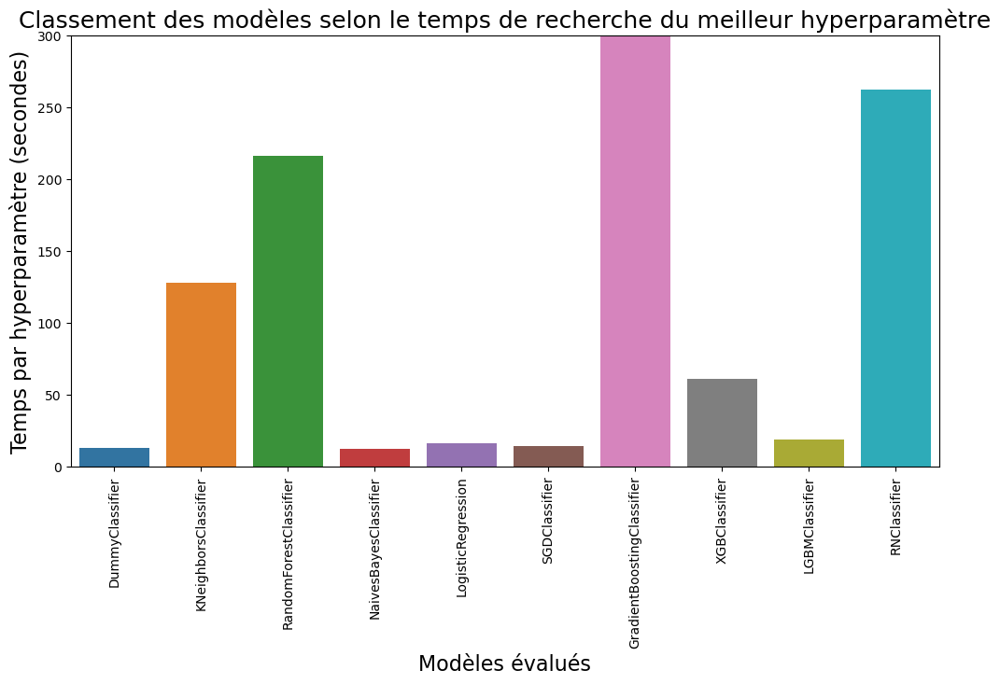

In [16]:
plt.figure(figsize=(12,6))
sns.barplot(data = resultats_models_df, x = "modèles", y="training_time_std")
plt.title("Classement des modèles selon le temps de recherche du meilleur hyperparamètre", fontsize = 18)
plt.ylabel("Temps par hyperparamètre (secondes)", fontsize = 16)
plt.xlabel("Modèles évalués", fontsize = 16) 
plt.xticks(rotation = 90)
plt.ylim(0,300)
plt.show()

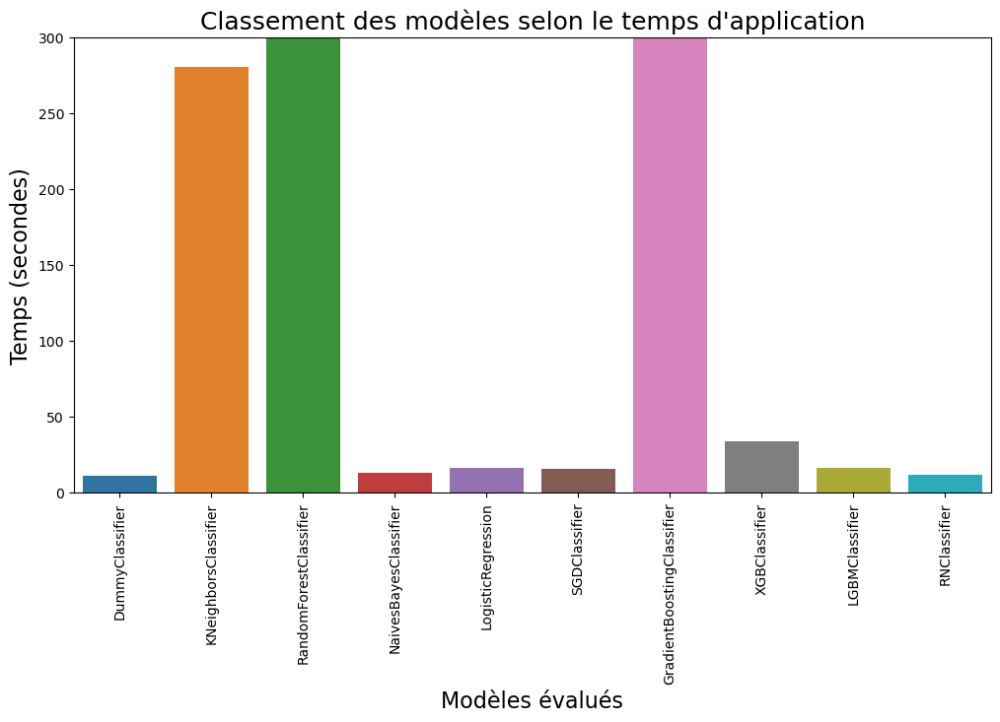

In [15]:
plt.figure(figsize=(12,6))
sns.barplot(data = resultats_models_df, x = "modèles", y="elapsed_time")
plt.title("Classement des modèles selon le temps d'application", fontsize = 18)
plt.ylabel("Temps (secondes)", fontsize = 16)
plt.xlabel("Modèles évalués", fontsize = 16) 
plt.xticks(rotation = 90)
plt.ylim(0,300)
plt.show()

### Observations :

- Trois modèles prenent beaucoup de temps pour leur prédiction Kneighbords, RandomForest et GradientBoosting (mais également dans l'entraînement). 
- Modèle de réseau neuronal prend beaucoup de temps dans sa recherche d'hyperparamètres, mais est assez rapide pour prédire.
- On a ensuite des modèles très rapide à entraîner et dont la prédiction est tout autant rapide : NaiveBayesClassifier, LogisticRegression, SGDClassifier et LGBMClassifier.
- XGBclassifier est en intermédiaire en terme de temps de recherche des hyperparamètres et la prédiction

Il faudra voir les résultats obtenus avec les modèles les plus rapides, car on partirait sur un de ces modèles.

### <a name = "T4C3">c. Résultats des modélisations : ROC-AUC</a>

In [38]:
# Pour avoir une idée de l'overfitting
resultats_models_df["fitting_ROCAUC"] = round(resultats_models_df["roc_auc_train"] / resultats_models_df["roc_auc_test"], 2) 

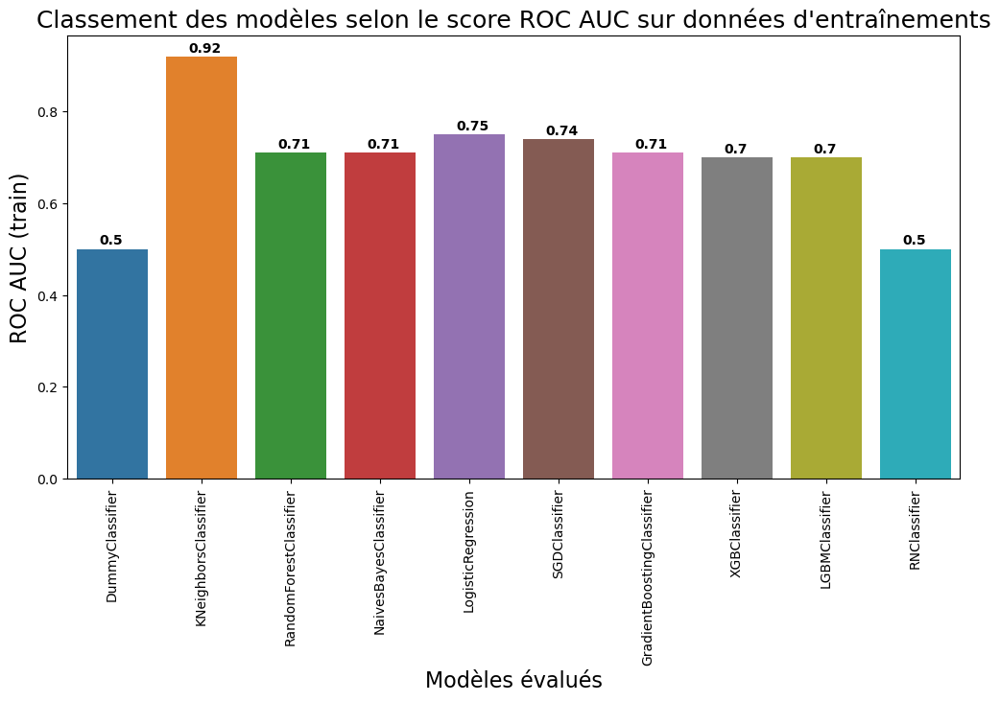

In [35]:
plt.figure(figsize=(12,6))
sns.barplot(data = resultats_models_df, x = "modèles", y="roc_auc_train")
plt.title("Classement des modèles selon le score ROC AUC sur données d'entraînements", fontsize = 18)
plt.ylabel("ROC AUC (train)", fontsize = 16)
plt.xlabel("Modèles évalués", fontsize = 16) 
plt.xticks(rotation = 90)

# Ajout de la valeur
for i, v in enumerate(resultats_models_df.roc_auc_train):
    plt.text(i-0.15, v +.01, str(v),
            color = 'black', fontweight = 'bold')

plt.show()

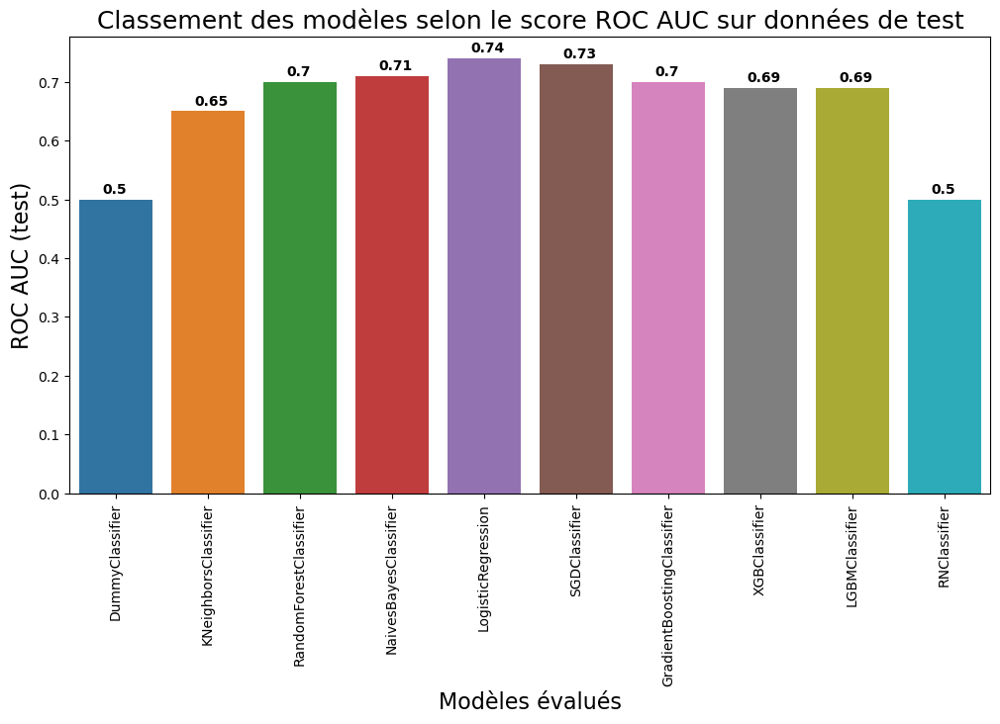

In [36]:
plt.figure(figsize=(12,6))
sns.barplot(data = resultats_models_df, x = "modèles", y="roc_auc_test")
plt.title("Classement des modèles selon le score ROC AUC sur données de test", fontsize = 18)
plt.ylabel("ROC AUC (test)", fontsize = 16)
plt.xlabel("Modèles évalués", fontsize = 16) 
plt.xticks(rotation = 90)

# Ajout de la valeur
for i, v in enumerate(resultats_models_df.roc_auc_test):
    plt.text(i-0.15, v +.01, str(v),
            color = 'black', fontweight = 'bold')

plt.show()

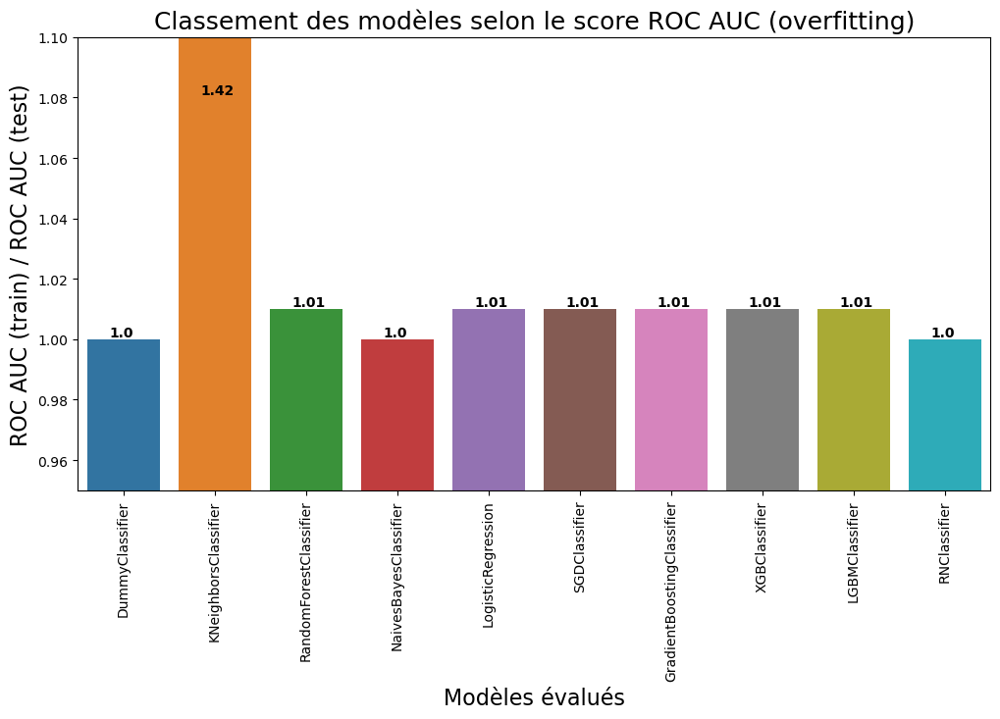

In [49]:
plt.figure(figsize=(12,6))
sns.barplot(data = resultats_models_df, x = "modèles", y="fitting_ROCAUC")
plt.title("Classement des modèles selon le score ROC AUC (overfitting)", fontsize = 18)
plt.ylabel("ROC AUC (train) / ROC AUC (test)", fontsize = 16)
plt.xlabel("Modèles évalués", fontsize = 16) 
plt.ylim(0.95, 1.1)
plt.xticks(rotation = 90)

# Ajout de la valeur
for i, v in enumerate(resultats_models_df.fitting_ROCAUC):
    if v > 1.1:
        plt.text(i-0.15, 1.08 +.001, str(v),
                color = 'black', fontweight = 'bold')
    else :
        plt.text(i-0.15, v +.001, str(v),
                color = 'black', fontweight = 'bold')

plt.show()

### Observations :

- A part pour kneighbords, il n'y a pas d'overfitting ou d'underfitting.
- On retrouve bien une valeur de 0.5 pour le dummy classeur. Etonnament le modèle RN n'a pas bien performé. Des tests préliminaires l'avait très bien placé, il faudra analyser pourquoi il ne performe plus aussi bien. On va donc le mettre de côté pour l'instant.
- Les autres modèles se situent entre 0.69 et 0.75 sur les données d'entraînements et de test, ce qui sont de bon scores.
- LogistricRegression et SGDClassifier sont les meilleurs modèles sur ces analyses.

### <a name = "T4C4">d. Résultats des modélisations : Recall</a>

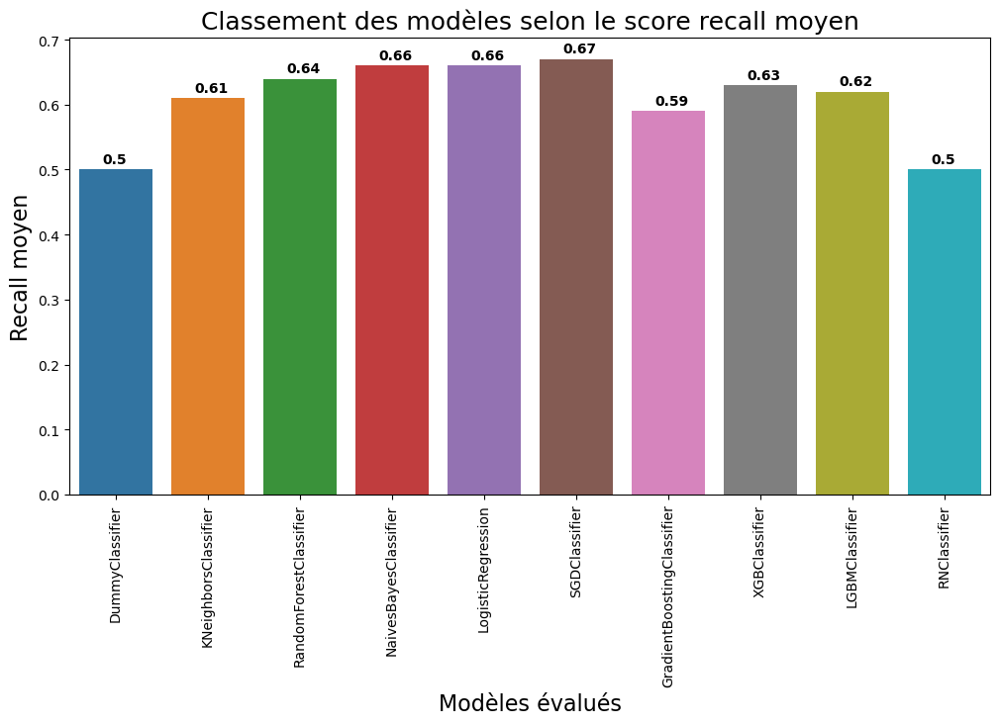

In [50]:
plt.figure(figsize=(12,6))
sns.barplot(data = resultats_models_df, x = "modèles", y="recall_mean")
plt.title("Classement des modèles selon le score recall moyen", fontsize = 18)
plt.ylabel("Recall moyen", fontsize = 16)
plt.xlabel("Modèles évalués", fontsize = 16) 
plt.xticks(rotation = 90)

# Ajout de la valeur
for i, v in enumerate(resultats_models_df.recall_mean):
    plt.text(i-0.15, v +.01, str(v),
            color = 'black', fontweight = 'bold')

plt.show()

### Observations :

- Tendance de résultats assez similaires à ceux obtenus avec ROC_AUC.
- On retrouve bien une valeur de 0.5 pour le dummy classeur. 
- Les autres modèles se situent entre 0.59 et 0.67.
- Le meilleur score attendu serait de 1. Donc on a des scores montrant que 59 à 67 % pour chaque catégorie est bien affiliés
- LogistricRegression, SGDClassifier et NaivesBayes sont les meilleurs modèles sur ces analyses.

***
# <a name="C">Conclusions générales</a>

Deux modèles sortent du lot sur plusieurs des métriques mesurées : 

- LogisticRegression et SGDClassifier 

Mais nous allons focaliser nos efforts que sur un seul des deux modèles, pour en dégager un beaucoup performant en recherchant les meilleurs hyperparamètres. De même, nous développerons notre modèle sur un plus grand nombre de variables.   
Donc nous faisons le choix de continuer avec LogisticRegression, qui a des temps de rechercher d'hyperparamètres assez rapide et un temps de prédiction très court. De même les résultats ROC AUC et Recall sont très élevés.

In [147]:
# On sauvegarde la liste des colonnes sélectionnées

selected_col_ANOVA = df[df.p_values < 0.005].Features.values

with open('selected_col_ANOVA.pkl', 'wb') as selected_col_ANOVA_file:
    pickle.dump(selected_col_ANOVA, selected_col_ANOVA_file)